In [1]:
import sys
sys.path.append('..')

import h5py
import json
import random
import numpy as np
import matplotlib.pyplot as plt

from tqdm.notebook import tqdm
from collections import defaultdict
from skimage.util import view_as_windows
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import MultiLabelBinarizer
from iterstrat.ml_stratifiers import MultilabelStratifiedKFold
from priority_group_stratified_split import Group, GroupSet, GreedySplit

from source.utils import has_valid_tags
from source.constants import (
    STEP_SIZE,
    WINDOW_SIZE,
    TASK_DOMAINS,
    COMPLEXITIES,
    CHROMATIC_SCALE,
    THEORYTAB_DATASET_FILEPATH,
    STRATIFICATION_INFO_FILEPATH
)

RANDOM_SEED = 42
random.seed(RANDOM_SEED)
np.random.seed(RANDOM_SEED)

# Dataset stratification based on iterative stratification

- This method is further explained in the paper *[On the Stratification of Multi-label Data](https://www.researchgate.net/publication/220699691_On_the_Stratification_of_Multi-label_Data)* by *Sechidis et. al.*

In [2]:
def multilabel_stratified_split(X, y, train_size=0.8, val_size=0.1, test_size=0.1):
    """
    Example input
        X: any representation of your samples (paths, features, etc.)
        y: list of label sets for each sample
        
    Example:
        X = ["sample1", "sample2", "sample3", ...]
        y = [["label1", "label2"], ["label2"], ["label3", "label4"], ...]
    """
    assert abs(train_size + val_size + test_size - 1.0) < 1e-6, "Splits must sum to 1"

    # Convert to multi-hot
    mlb = MultiLabelBinarizer()
    y_bin = mlb.fit_transform(y)

    X = np.array(X)
    y_bin = np.array(y_bin)

    # First split: train vs (val+test)
    mskf = MultilabelStratifiedKFold(n_splits=int(1 / (val_size + test_size)), shuffle=True, random_state=RANDOM_SEED)
    train_idx, rest_idx = next(mskf.split(X, y_bin))

    X_train = X[train_idx]
    y_train = y_bin[train_idx]

    X_rest = X[rest_idx]
    y_rest = y_bin[rest_idx]

    # Second split: validation vs test
    rest_ratio = val_size / (val_size + test_size)
    mskf_rest = MultilabelStratifiedKFold(n_splits=int(1 / (1 - rest_ratio)), shuffle=True, random_state=RANDOM_SEED)
    val_idx, test_idx = next(mskf_rest.split(X_rest, y_rest))

    X_val = X_rest[val_idx]
    y_val = y_rest[val_idx]

    X_test = X_rest[test_idx]
    y_test = y_rest[test_idx]

    # Optional: convert binarized labels back to sets
    y_train_labels = mlb.inverse_transform(y_train)
    y_val_labels = mlb.inverse_transform(y_val)
    y_test_labels = mlb.inverse_transform(y_test)

    return {
        'train': {'X': X_train, 'y': y_train, 'labels': y_train_labels},
        'val': {'X': X_val, 'y': y_val, 'labels': y_val_labels},
        'test': {'X': X_test, 'y': y_test, 'labels': y_test_labels},
        'classes': mlb.classes_
    }

# Loading and filtering the TheoryTab Dataset

In [3]:
with open(THEORYTAB_DATASET_FILEPATH, 'r') as fp:
    theorytab_dataset = json.load(fp)
    previous_size = len(theorytab_dataset)

print('Number of theorytabs in TheoryTab Dataset:', len(theorytab_dataset))

Number of theorytabs in TheoryTab Dataset: 54068


In [4]:
theorytab_ids_to_keep = set()
complete_rns = set(TASK_DOMAINS['complete_rn'])

for theorytab_id, theorytab in theorytab_dataset.items():
    if not has_valid_tags(theorytab):
        continue

    keep_theorytab = True
    for chord in theorytab['chords']:
        if chord['complete_rn'] not in complete_rns:
            keep_theorytab = False
            break
        
    if keep_theorytab:
        theorytab_ids_to_keep.add(theorytab_id)

theorytab_dataset = {
    theorytab_id: theorytab
    for theorytab_id, theorytab in theorytab_dataset.items() if theorytab_id in theorytab_ids_to_keep
}

print(f'Number of theorytabs in filtered TheoryTab Dataset: {len(theorytab_dataset)}/{previous_size}')

Number of theorytabs in filtered TheoryTab Dataset: 12058/54068


# Stratification procedure

In [5]:
stratification_info = {}

## Random splits
### TheoryTab level

In [6]:
train_ids, val_ids = train_test_split(list(theorytab_dataset), test_size=0.2, shuffle=True, random_state=RANDOM_SEED)
val_ids, test_ids = train_test_split(val_ids, test_size=0.5, shuffle=True, random_state=RANDOM_SEED)

print(f"Size of train set: {100 * len(train_ids) / len(theorytab_dataset):.2f}%")
print(f"Size of validation set: {100 * len(val_ids) / len(theorytab_dataset):.2f}%")
print(f"Size of test set: {100 * len(test_ids) / len(theorytab_dataset):.2f}%")

Size of train set: 80.00%
Size of validation set: 10.00%
Size of test set: 10.00%


In [7]:
def get_rn_set(theorytab_ids):
    rn_set = set()
    
    for theorytab_id in theorytab_ids:
        for chord in theorytab_dataset[theorytab_id]['chords']:
            rn_set.add(chord['complete_rn'])

    return rn_set


train_rn_set = get_rn_set(train_ids)
val_rn_set = get_rn_set(val_ids)
test_rn_set = get_rn_set(test_ids)

print('RNs in validation but not in train:', val_rn_set - train_rn_set)
print('RNs in test but not in train:', test_rn_set - train_rn_set)

RNs in validation but not in train: set()
RNs in test but not in train: set()


In [8]:
stratification_info['random'] = {}
stratification_info['random']['theorytab'] = {}

stratification_info['random']['theorytab']['train'] = train_ids
stratification_info['random']['theorytab']['val'] = val_ids
stratification_info['random']['theorytab']['test'] = test_ids

### Song level

In [9]:
songname_to_theorytab_ids = defaultdict(list)

for theorytab_id, theorytab in theorytab_dataset.items():
    info = theorytab['hooktheory']
    songname = f"{info['artist']} -- {info['song']}"
    songname_to_theorytab_ids[songname].append(theorytab_id)

print('The Beatles -- Hey Jude Theorytabs:', songname_to_theorytab_ids['The Beatles -- Hey Jude'])

The Beatles -- Hey Jude Theorytabs: ['Rzoj_pYQmDe']


In [10]:
train_songnames, val_songnames = train_test_split(list(songname_to_theorytab_ids), test_size=0.2, shuffle=True, random_state=RANDOM_SEED)
val_songnames, test_songnames = train_test_split(val_songnames, test_size=0.5, shuffle=True, random_state=RANDOM_SEED)

print(f"Size of train set: {100 * len(train_songnames) / len(songname_to_theorytab_ids):.2f}%")
print(f"Size of validation set: {100 * len(val_songnames) / len(songname_to_theorytab_ids):.2f}%")
print(f"Size of test set: {100 * len(test_songnames) / len(songname_to_theorytab_ids):.2f}%")

Size of train set: 80.00%
Size of validation set: 9.99%
Size of test set: 10.01%


In [11]:
train_ids = [theorytab_id for songname in train_songnames for theorytab_id in songname_to_theorytab_ids[songname]]
val_ids = [theorytab_id for songname in val_songnames for theorytab_id in songname_to_theorytab_ids[songname]]
test_ids = [theorytab_id for songname in test_songnames for theorytab_id in songname_to_theorytab_ids[songname]]

train_rn_set = get_rn_set(train_ids)
val_rn_set = get_rn_set(val_ids)
test_rn_set = get_rn_set(test_ids)

print('RNs in validation but not in train:', val_rn_set - train_rn_set)
print('RNs in test but not in train:', test_rn_set - train_rn_set)

RNs in validation but not in train: set()
RNs in test but not in train: set()


In [12]:
stratification_info['random']['song'] = {}

stratification_info['random']['song']['train'] = train_ids
stratification_info['random']['song']['val'] = val_ids
stratification_info['random']['song']['test'] = test_ids

### Artist level

In [13]:
artist_to_theorytab_ids = defaultdict(list)

for theorytab_id, theorytab in theorytab_dataset.items():
    info = theorytab['hooktheory']
    artist_to_theorytab_ids[info['artist']].append(theorytab_id)

print('The Beatles TheoryTabs:', artist_to_theorytab_ids['The Beatles'])

The Beatles TheoryTabs: ['lamkXWaYgDM', 'bWgMQOvPglX', 'ZbgOY-OaonY', 'nLgaXaVbmYp', '_NgbnnEbgQA', 'JkmZYKwjoqn', 'yvgPqRjAxYq', 'AaoGBwbRxeQ', 'dPoDjZzZgnM', 'ZbgORJVkmnY', 'ZOxVZ-YMxdq', 'QLgnGGPEx-V', 'VMgJOneyxqK', '_NgbneWygQA', 'd_gw-JMQoGV', 'nZgWJZrVmry', 'JkmZYkq_oqn', 'Abm_nlwJoak', 'Wegl_yKvmrY', 'ANmpnDAbxyM', 'ANmpnAqbxyM', 'YAg-PkXJmle', 'nZgWJrJrmry', 'Rzoj_wdNmDe', 'JkmZYerZoqn', 'JkmZB-akmqn', 'jDgXp-w_gKl', 'dPoDJdEZgnM', 'nvgy-AezgkA', 'VMgJBYlkgqK', 'VMgJOnpExqK', 'Abm_nnGwoak', 'ZbgORJGkmnY', 'yvgPqGQBxYq', '_NgbnQWrgQA', 'jDgXRPlEoKl', 'JNgqlVEJmrz', 'Rzoj_pYQmDe', 'zngRJMYVgJj', 'yvmrlNwVxOW', 'DpgvlBZOoad', 'lamknLDZoDM', 'Dpgv-ANkmad', 'LAgQEKLegyO', 'VMgJjNyVgqK', 'QLgnGkjpx-V', 'd_gwAGpAoGV', 'KexEQAJvx_B', 'nJmBjeB_mAV', 'LAgQZOBJxyO', 'zngRwwzExJj', 'zngRwNpDxJj', 'JNgq-O_rgrz', 'd_gw-J_eoGV', 'd_gwAGbQoGV', '_NgbnDZbgQA', 'bWgMPwkXmlX', 'Rzoj_XdMmDe', 'ROmNrenAmNw', 'YAg-_-_Kole']


In [14]:
train_artists, val_artists = train_test_split(list(artist_to_theorytab_ids), test_size=0.2, shuffle=True, random_state=RANDOM_SEED)
val_artists, test_artists = train_test_split(val_artists, test_size=0.5, shuffle=True, random_state=RANDOM_SEED)

print(f"Size of train set: {100 * len(train_artists) / len(artist_to_theorytab_ids):.2f}%")
print(f"Size of validation set: {100 * len(val_artists) / len(artist_to_theorytab_ids):.2f}%")
print(f"Size of test set: {100 * len(test_artists) / len(artist_to_theorytab_ids):.2f}%")

Size of train set: 79.98%
Size of validation set: 9.99%
Size of test set: 10.02%


In [15]:
train_ids = [theorytab_id for artist in train_artists for theorytab_id in artist_to_theorytab_ids[artist]]
val_ids = [theorytab_id for artist in val_artists for theorytab_id in artist_to_theorytab_ids[artist]]
test_ids = [theorytab_id for artist in test_artists for theorytab_id in artist_to_theorytab_ids[artist]]

train_rn_set = get_rn_set(train_ids)
val_rn_set = get_rn_set(val_ids)
test_rn_set = get_rn_set(test_ids)

print('RNs in validation but not in train:', val_rn_set - train_rn_set)
print('RNs in test but not in train:', test_rn_set - train_rn_set)

RNs in validation but not in train: set()
RNs in test but not in train: set()


In [16]:
stratification_info['random']['artist'] = {}

stratification_info['random']['artist']['train'] = train_ids
stratification_info['random']['artist']['val'] = val_ids
stratification_info['random']['artist']['test'] = test_ids

## Iterstrat splits
### TheoryTab level

In [17]:
complete_rns_theorytab_count = {rn: 0 for rn in TASK_DOMAINS['complete_rn']}

for theorytab_id, theorytab in theorytab_dataset.items():
    complete_rns = set()

    for chord in theorytab['chords']:
        complete_rns.add(chord['complete_rn'])

    for rn in complete_rns:
        complete_rns_theorytab_count[rn] += 1

complete_rns_theorytab_count = dict(sorted(complete_rns_theorytab_count.items(), key=lambda x: x[1], reverse=True))
print('Top5 most common complete RNs (unit = theorytab):', list(complete_rns_theorytab_count.items())[:5])
print('Top5 least common complete RNs (unit = theorytab):', list(complete_rns_theorytab_count.items())[-5:])

Top5 most common complete RNs (unit = theorytab): [('I::M:0:', 5626), ('IV::M:0:', 4879), ('V::M:0:', 4650), ('i::m:0:', 4281), ('vi::m:0:', 3362)]
Top5 least common complete RNs (unit = theorytab): [('iii::m:0:[bor]', 26), ('V:IV:M:1:', 26), ('V7::D7:2:', 20), ('V7::D7:1:[bor]', 19), ('V7::D7:1:', 11)]


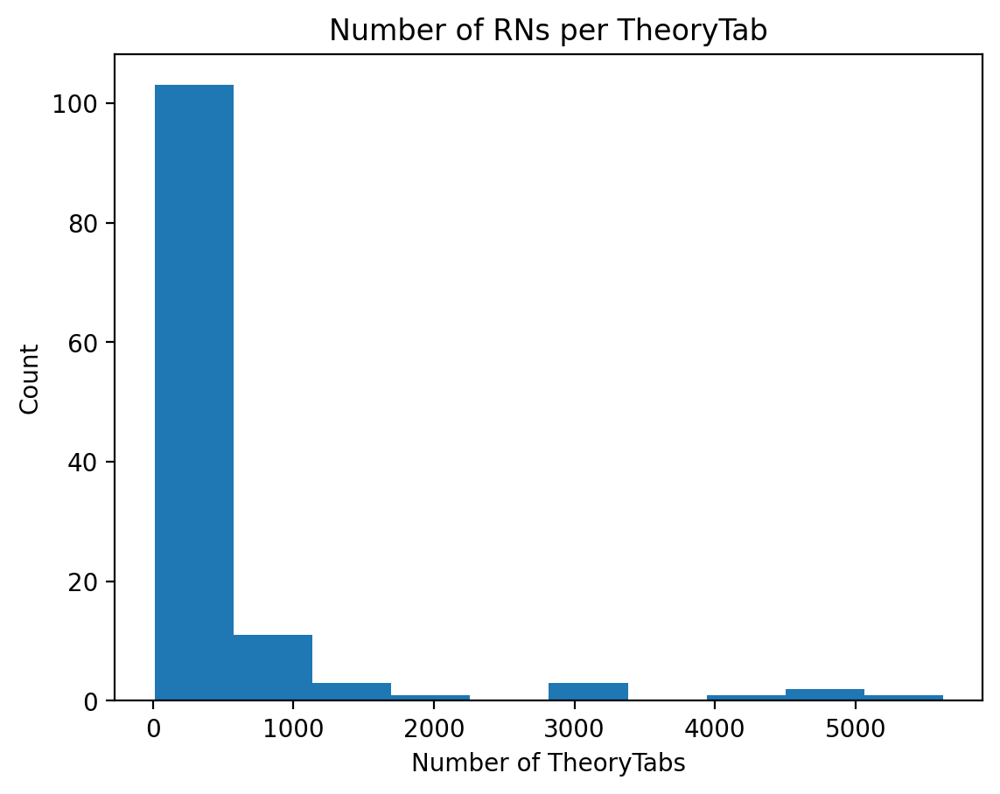

In [18]:
plt.title('Number of RNs per TheoryTab')

plt.hist(complete_rns_theorytab_count.values())
plt.ylabel('Count')
plt.xlabel('Number of TheoryTabs')
plt.show()

In [19]:
num_theorytabs_threshold = 20
print(f'RNs with less than {num_theorytabs_threshold} theorytabs:', dict(filter(lambda x: x[1] < num_theorytabs_threshold, complete_rns_theorytab_count.items())))

RNs with less than 20 theorytabs: {'V7::D7:1:[bor]': 19, 'V7::D7:1:': 11}


- **Takeaway:** If we stratify the dataset accordingly to the roman numerals of a TheoryTab, we shouldn't have any problems related with RNs appearing in validation/test and not in training, since the least common RN per TheoryTab appears in more than 1 TheoryTab. However, splitting the dataset at TheoryTab level may cause data leakage.

In [20]:
def get_theorytab_complete_name(theorytab_id):
    info = theorytab_dataset[theorytab_id]['hooktheory']
    return f"{info['artist']} -- {info['song']} [{str(info['section'])}]"

X = list(theorytab_dataset)
y = []

for theorytab in theorytab_dataset.values():
    complete_rns = set()

    for chord in theorytab['chords']:
        complete_rns.add(chord['complete_rn'])

    y.append(list(complete_rns))

print(f'TheoryTab [{X[0]}]: {get_theorytab_complete_name(X[0])}')
print('Roman numerals:', y[0])

TheoryTab [ANmprEbdxyM]: Ryuji Sasai -- Final Fantasy Mystic Quest - Battle 3 [Pre-Chorus]
Roman numerals: ['VI::M:2:', 'V::M:0:[bor]', 'i::m:2:', 'i::m:1:', 'i::m:0:', 'VI::M:0:', 'VII::M:2:', 'VII::M:0:']


In [21]:
stratification_result = multilabel_stratified_split(X, y, train_size=0.8, val_size=0.1, test_size=0.1)

train_labels = set([rn for rn_list in stratification_result['train']['labels'] for rn in rn_list])
val_labels = set([rn for rn_list in stratification_result['val']['labels'] for rn in rn_list])
test_labels = set([rn for rn_list in stratification_result['test']['labels'] for rn in rn_list])

assert len(val_labels - train_labels) == 0, f'RNs on validation and not on train: {val_labels - train_labels}'
assert len(test_labels - train_labels) == 0, f'RNs on test and not on train: {test_labels - train_labels}'

print(f"Size of train set: {100 * len(stratification_result['train']['X']) / len(theorytab_dataset):.2f}%")
print(f"Size of validation set: {100 * len(stratification_result['val']['X']) / len(theorytab_dataset):.2f}%")
print(f"Size of test set: {100 * len(stratification_result['test']['X']) / len(theorytab_dataset):.2f}%")

Size of train set: 80.10%
Size of validation set: 9.88%
Size of test set: 10.02%


In [22]:
stratification_info['iterstrat'] = {}
stratification_info['iterstrat']['theorytab'] = {}

for split in ('train', 'val', 'test'):
    stratification_info['iterstrat']['theorytab'][split] = stratification_result[split]['X'].tolist()

### Song level

In [23]:
complete_rns_song_count = {rn: 0 for rn in TASK_DOMAINS['complete_rn']}

for theorytab_ids in songname_to_theorytab_ids.values():
    complete_rns = set()

    for theorytab_id in theorytab_ids:
        for chord in theorytab_dataset[theorytab_id]['chords']:
            complete_rns.add(chord['complete_rn'])
            
    for rn in complete_rns:
        complete_rns_song_count[rn] += 1

complete_rns_song_count = dict(sorted(complete_rns_song_count.items(), key=lambda x: x[1], reverse=True))
print('Top5 most common complete RNs (unit = song):', list(complete_rns_song_count.items())[:5])
print('Top5 least common complete RNs (unit = song):', list(complete_rns_song_count.items())[-5:])

Top5 most common complete RNs (unit = song): [('I::M:0:', 3859), ('IV::M:0:', 3398), ('V::M:0:', 3254), ('i::m:0:', 3056), ('vi::m:0:', 2458)]
Top5 least common complete RNs (unit = song): [('iii::m:0:[bor]', 25), ('V:IV:M:1:', 25), ('V7::D7:2:', 19), ('V7::D7:1:[bor]', 18), ('V7::D7:1:', 11)]


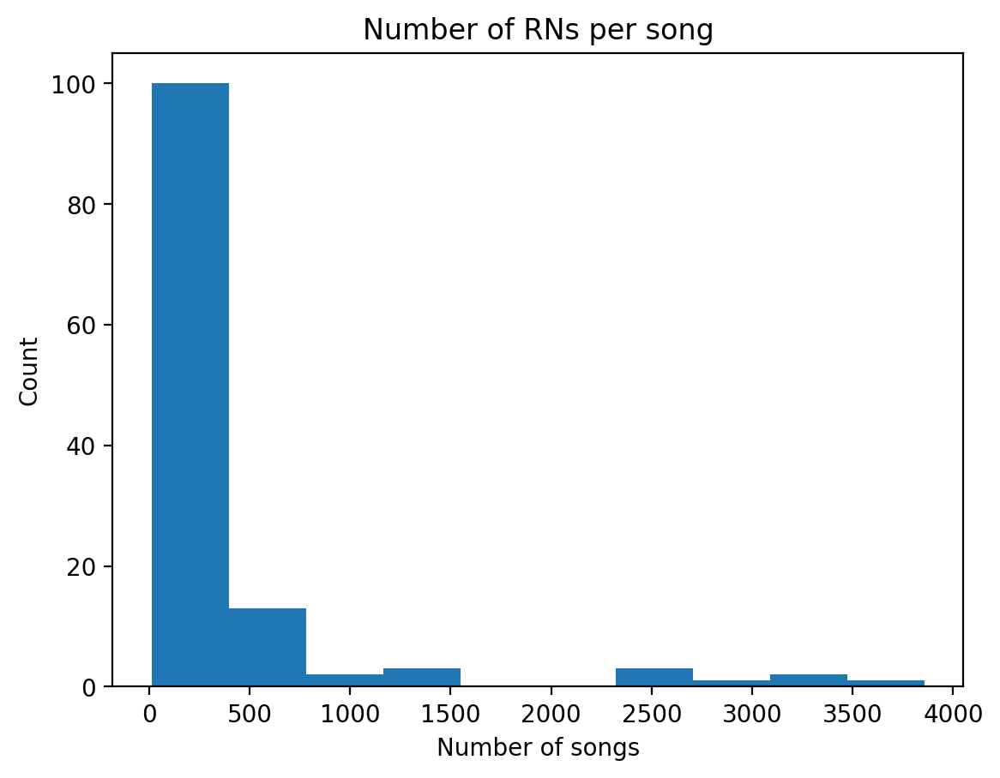

In [24]:
plt.title('Number of RNs per song')

plt.hist(complete_rns_song_count.values())
plt.ylabel('Count')
plt.xlabel('Number of songs')
plt.show()

In [25]:
num_songs_threshold = 20
print(f'RNs with less than {num_songs_threshold} songs:', dict(filter(lambda x: x[1] < num_songs_threshold, complete_rns_song_count.items())))

RNs with less than 20 songs: {'V7::D7:2:': 19, 'V7::D7:1:[bor]': 18, 'V7::D7:1:': 11}


- **Takeaway:** If we stratify the dataset accordingly to the roman numerals of a song, we shouldn't have any problems related with RNs appearing in validation/test and not in training, since the least common RN per song appears in more than 1 song. However, splitting the dataset at song level may cause minor data leakage.

In [26]:
X = list(songname_to_theorytab_ids)
y = []

for theorytab_ids in songname_to_theorytab_ids.values():
    complete_rns = set()

    for theorytab_id in theorytab_ids:
        for chord in theorytab_dataset[theorytab_id]['chords']:
            complete_rns.add(chord['complete_rn'])
            
    y.append(list(complete_rns))

print('Songname:',  X[0])
print('Roman numerals:', y[0])

Songname: Ryuji Sasai -- Final Fantasy Mystic Quest - Battle 3
Roman numerals: ['VI::M:2:', 'iv::m:0:', 'V::M:0:[bor]', 'i::m:2:', 'i::m:1:', 'i::m:0:', 'i::m:0:[bor]', 'v::m:0:', 'III::M:0:', 'VI::M:0:', 'VII::M:2:', 'IV::M:0:[bor]', 'VII::M:0:']


In [27]:
stratification_result = multilabel_stratified_split(X, y, train_size=0.8, val_size=0.1, test_size=0.1)

train_labels = set([rn for rn_list in stratification_result['train']['labels'] for rn in rn_list])
val_labels = set([rn for rn_list in stratification_result['val']['labels'] for rn in rn_list])
test_labels = set([rn for rn_list in stratification_result['test']['labels'] for rn in rn_list])

assert len(val_labels - train_labels) == 0, f'RNs on validation and not on train: {val_labels - train_labels}'
assert len(test_labels - train_labels) == 0, f'RNs on test and not on train: {test_labels - train_labels}'

print(f"Size of train set: {100 * len(stratification_result['train']['X']) / len(songname_to_theorytab_ids):.2f}%")
print(f"Size of validation set: {100 * len(stratification_result['val']['X']) / len(songname_to_theorytab_ids):.2f}%")
print(f"Size of test set: {100 * len(stratification_result['test']['X']) / len(songname_to_theorytab_ids):.2f}%")

Size of train set: 80.11%
Size of validation set: 10.05%
Size of test set: 9.84%


In [28]:
stratification_info['iterstrat']['song'] = {}

for split in ('train', 'val', 'test'):
    split_theorytab_ids = []
    for songname in stratification_result[split]['X']:
        split_theorytab_ids.extend(songname_to_theorytab_ids[songname])
    
    stratification_info['iterstrat']['song'][split] = split_theorytab_ids

### Artist level

In [29]:
complete_rns_artist_count = {rn: 0 for rn in TASK_DOMAINS['complete_rn']}

for theorytab_ids in artist_to_theorytab_ids.values():
    complete_rns = set()

    for theorytab_id in theorytab_ids:
        for chord in theorytab_dataset[theorytab_id]['chords']:
            complete_rns.add(chord['complete_rn'])
            
    for rn in complete_rns:
        complete_rns_artist_count[rn] += 1

complete_rns_artist_count = dict(sorted(complete_rns_artist_count.items(), key=lambda x: x[1], reverse=True))
print('Top5 most common complete RNs (unit = artist):', list(complete_rns_artist_count.items())[:5])
print('Top5 least common complete RNs (unit = artist):', list(complete_rns_artist_count.items())[-5:])

Top5 most common complete RNs (unit = artist): [('I::M:0:', 2068), ('i::m:0:', 1867), ('IV::M:0:', 1862), ('V::M:0:', 1808), ('VI::M:0:', 1532)]
Top5 least common complete RNs (unit = artist): [('i::m:1:[bor]', 23), ('iii::m:0:[bor]', 21), ('V7::D7:2:', 17), ('V7::D7:1:[bor]', 17), ('V7::D7:1:', 11)]


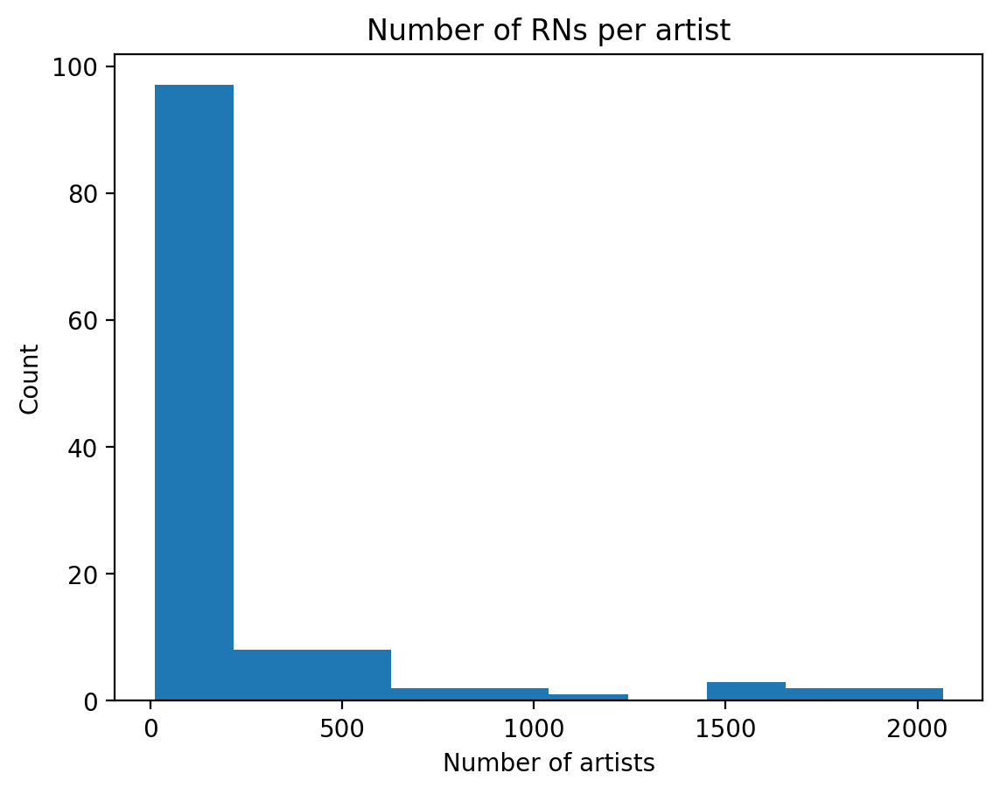

In [30]:
plt.title('Number of RNs per artist')

plt.hist(complete_rns_artist_count.values())
plt.ylabel('Count')
plt.xlabel('Number of artists')
plt.show()

In [31]:
num_artists_threshold = 20
print(f'RNs with less than {num_artists_threshold} artists:', dict(filter(lambda x: x[1] < num_artists_threshold, complete_rns_artist_count.items())))

RNs with less than 20 artists: {'V7::D7:2:': 17, 'V7::D7:1:[bor]': 17, 'V7::D7:1:': 11}


- **Takeaway:** If we stratify the dataset accordingly to the roman numerals of a song, we shouldn't have any problems related with RNs appearing in validation/test and not in training, since the least common RN per artist appears in more than 1 artist. And, this splitting ensures that no data leakage occurs.

In [32]:
X = list(artist_to_theorytab_ids)
y = []

for theorytab_ids in artist_to_theorytab_ids.values():
    complete_rns = set()

    for theorytab_id in theorytab_ids:
        for chord in theorytab_dataset[theorytab_id]['chords']:
            complete_rns.add(chord['complete_rn'])
            
    y.append(list(complete_rns))

print('Artist:',  X[0])
print('Roman numerals:', y[0])

Artist: Ryuji Sasai
Roman numerals: ['VI::M:2:', 'iv::m:0:', 'V::M:0:[bor]', 'i::m:2:', 'i::m:1:', 'i::m:0:', 'i::m:0:[bor]', 'v::m:0:', 'III::M:0:', 'ii::m:0:[bor]', 'I::M:0:[bor]', 'VI::M:0:', 'VII::M:2:', 'IV::M:0:[bor]', 'VII::M:0:']


In [33]:
stratification_result = multilabel_stratified_split(X, y, train_size=0.8, val_size=0.1, test_size=0.1)

train_labels = set([rn for rn_list in stratification_result['train']['labels'] for rn in rn_list])
val_labels = set([rn for rn_list in stratification_result['val']['labels'] for rn in rn_list])
test_labels = set([rn for rn_list in stratification_result['test']['labels'] for rn in rn_list])

assert len(val_labels - train_labels) == 0, f'RNs on validation and not on train: {val_labels - train_labels}'
assert len(test_labels - train_labels) == 0, f'RNs on test and not on train: {test_labels - train_labels}'

print(f"Size of train set: {100 * len(stratification_result['train']['X']) / len(artist_to_theorytab_ids):.2f}%")
print(f"Size of validation set: {100 * len(stratification_result['val']['X']) / len(artist_to_theorytab_ids):.2f}%")
print(f"Size of test set: {100 * len(stratification_result['test']['X']) / len(artist_to_theorytab_ids):.2f}%")

Size of train set: 79.91%
Size of validation set: 10.02%
Size of test set: 10.07%


In [34]:
stratification_info['iterstrat']['artist'] = {}

for split in ('train', 'val', 'test'):
    split_theorytab_ids = []
    for artist in stratification_result[split]['X']:
        split_theorytab_ids.extend(artist_to_theorytab_ids[artist])
    
    stratification_info['iterstrat']['artist'][split] = split_theorytab_ids

## Greedy splits

For the greedy splits we need to get the rarest RN and also the number of segments per level.

### TheoryTab level

In [35]:
rarest_rn_by_theorytab = {}
num_segments_per_theorytab = {}

with h5py.File('/storage/datasets/thiago.poppe/TheoryTabDB/segments/labels.h5', 'r') as h5f:
    for theorytab_id, theorytab in theorytab_dataset.items():
        rarest_rn = -1
    
        for chord in theorytab['chords']:
            rarest_rn = max(rarest_rn, TASK_DOMAINS['complete_rn'].index(chord['complete_rn']))
    
        num_segments_per_theorytab[theorytab_id] = len(h5f[theorytab_id])
        rarest_rn_by_theorytab[theorytab_id] = TASK_DOMAINS['complete_rn'][rarest_rn]

In [36]:
groups = [Group(theorytab_id, rarest_rn_by_theorytab[theorytab_id], num_segments_per_theorytab[theorytab_id]) for theorytab_id in theorytab_dataset]
groups = GroupSet(groups)

greedy_split = GreedySplit()
train_set, val_set, test_set = greedy_split.get_split(groups, [0.8, 0.1, 0.1])

train_ids = [group.uid for group in train_set]
val_ids = [group.uid for group in val_set]
test_ids = [group.uid for group in test_set]

print(f"Size of train set (unit = theorytab): {100 * len(train_ids) / len(theorytab_dataset):.2f}%")
print(f"Size of validation set (unit = theorytab): {100 * len(val_ids) / len(theorytab_dataset):.2f}%")
print(f"Size of test set (unit = theorytab): {100 * len(test_ids) / len(theorytab_dataset):.2f}%")

train_num_segments = sum(num_segments_per_theorytab[theorytab_id] for theorytab_id in train_ids)
val_num_segments = sum(num_segments_per_theorytab[theorytab_id] for theorytab_id in val_ids)
test_num_segments = sum(num_segments_per_theorytab[theorytab_id] for theorytab_id in test_ids)
total_num_segments = train_num_segments + val_num_segments + test_num_segments

print()
print(f"Size of train set (unit = segments): {100 * train_num_segments / total_num_segments:.2f}%")
print(f"Size of validation set (unit = segments): {100 * val_num_segments / total_num_segments:.2f}%")
print(f"Size of test set (unit = segments): {100 * test_num_segments / total_num_segments:.2f}%")

Size of train set (unit = theorytab): 36.52%
Size of validation set (unit = theorytab): 22.74%
Size of test set (unit = theorytab): 40.74%

Size of train set (unit = segments): 80.01%
Size of validation set (unit = segments): 9.99%
Size of test set (unit = segments): 9.99%


In [37]:
train_rn_set = get_rn_set(train_ids)
val_rn_set = get_rn_set(val_ids)
test_rn_set = get_rn_set(test_ids)

print('RNs in validation but not in train:', val_rn_set - train_rn_set)
print('RNs in test but not in train:', test_rn_set - train_rn_set)

RNs in validation but not in train: set()
RNs in test but not in train: set()


In [38]:
stratification_info['greedy'] = {}
stratification_info['greedy']['theorytab'] = {}

stratification_info['greedy']['theorytab']['train'] = train_ids
stratification_info['greedy']['theorytab']['val'] = val_ids
stratification_info['greedy']['theorytab']['test'] = test_ids

### Song level

In [39]:
rarest_rn_by_song = {}
num_segments_per_song = {}

with h5py.File('/storage/datasets/thiago.poppe/TheoryTabDB/segments/labels.h5', 'r') as h5f:
    for songname, theorytab_ids in songname_to_theorytab_ids.items():
        rarest_rn = -1
        num_segments = 0
        
        for theorytab_id in theorytab_ids:
            num_segments += len(h5f[theorytab_id])
            theorytab = theorytab_dataset[theorytab_id]
            
            for chord in theorytab['chords']:
                rarest_rn = max(rarest_rn, TASK_DOMAINS['complete_rn'].index(chord['complete_rn']))
        
        num_segments_per_song[songname] = num_segments
        rarest_rn_by_song[songname] = TASK_DOMAINS['complete_rn'][rarest_rn]

In [40]:
groups = [Group(songname, rarest_rn_by_song[songname], num_segments_per_song[songname]) for songname in songname_to_theorytab_ids]
groups = GroupSet(groups)

greedy_split = GreedySplit()
train_set, val_set, test_set = greedy_split.get_split(groups, [0.8, 0.1, 0.1])

train_songnames = [group.uid for group in train_set]
val_songnames = [group.uid for group in val_set]
test_songnames = [group.uid for group in test_set]

print(f"Size of train set (unit = song): {100 * len(train_songnames) / len(songname_to_theorytab_ids):.2f}%")
print(f"Size of validation set (unit = song): {100 * len(val_songnames) / len(songname_to_theorytab_ids):.2f}%")
print(f"Size of test set (unit = song): {100 * len(test_songnames) / len(songname_to_theorytab_ids):.2f}%")

train_num_segments = sum(num_segments_per_song[songname] for songname in train_songnames)
val_num_segments = sum(num_segments_per_song[songname] for songname in val_songnames)
test_num_segments = sum(num_segments_per_song[songname] for songname in test_songnames)
total_num_segments = train_num_segments + val_num_segments + test_num_segments

print()
print(f"Size of train set (unit = segments): {100 * train_num_segments / total_num_segments:.2f}%")
print(f"Size of validation set (unit = segments): {100 * val_num_segments / total_num_segments:.2f}%")
print(f"Size of test set (unit = segments): {100 * test_num_segments / total_num_segments:.2f}%")

Size of train set (unit = song): 38.50%
Size of validation set (unit = song): 15.82%
Size of test set (unit = song): 45.68%

Size of train set (unit = segments): 80.01%
Size of validation set (unit = segments): 9.99%
Size of test set (unit = segments): 10.00%


In [41]:
train_ids = [theorytab_id for songname in train_songnames for theorytab_id in songname_to_theorytab_ids[songname]]
val_ids = [theorytab_id for songname in val_songnames for theorytab_id in songname_to_theorytab_ids[songname]]
test_ids = [theorytab_id for songname in test_songnames for theorytab_id in songname_to_theorytab_ids[songname]]

train_rn_set = get_rn_set(train_ids)
val_rn_set = get_rn_set(val_ids)
test_rn_set = get_rn_set(test_ids)

print('RNs in validation but not in train:', val_rn_set - train_rn_set)
print('RNs in test but not in train:', test_rn_set - train_rn_set)

RNs in validation but not in train: set()
RNs in test but not in train: set()


In [42]:
stratification_info['greedy']['song'] = {}
stratification_info['greedy']['song']['train'] = train_ids
stratification_info['greedy']['song']['val'] = val_ids
stratification_info['greedy']['song']['test'] = test_ids

### Artist level

In [43]:
rarest_rn_by_artist = {}
num_segments_per_artist = {}

with h5py.File('/storage/datasets/thiago.poppe/TheoryTabDB/segments/labels.h5', 'r') as h5f:
    for artist, theorytab_ids in artist_to_theorytab_ids.items():
        rarest_rn = -1
        num_segments = 0
        
        for theorytab_id in theorytab_ids:
            num_segments += len(h5f[theorytab_id])
            theorytab = theorytab_dataset[theorytab_id]
            
            for chord in theorytab['chords']:
                rarest_rn = max(rarest_rn, TASK_DOMAINS['complete_rn'].index(chord['complete_rn']))
        
        num_segments_per_artist[artist] = num_segments
        rarest_rn_by_artist[artist] = TASK_DOMAINS['complete_rn'][rarest_rn]

In [44]:
groups = [Group(artist, rarest_rn_by_artist[artist], num_segments_per_artist[artist]) for artist in artist_to_theorytab_ids]
groups = GroupSet(groups)

greedy_split = GreedySplit()
train_set, val_set, test_set = greedy_split.get_split(groups, [0.8, 0.1, 0.1])

train_artists = [group.uid for group in train_set]
val_artists = [group.uid for group in val_set]
test_artists = [group.uid for group in test_set]

print(f"Size of train set (unit = artist): {100 * len(train_artists) / len(artist_to_theorytab_ids):.2f}%")
print(f"Size of validation set (unit = artist): {100 * len(val_artists) / len(artist_to_theorytab_ids):.2f}%")
print(f"Size of test set (unit = artist): {100 * len(test_artists) / len(artist_to_theorytab_ids):.2f}%")

train_num_segments = sum(num_segments_per_artist[artist] for artist in train_artists)
val_num_segments = sum(num_segments_per_artist[artist] for artist in val_artists)
test_num_segments = sum(num_segments_per_artist[artist] for artist in test_artists)
total_num_segments = train_num_segments + val_num_segments + test_num_segments

print()
print(f"Size of train set (unit = segments): {100 * train_num_segments / total_num_segments:.2f}%")
print(f"Size of validation set (unit = segments): {100 * val_num_segments / total_num_segments:.2f}%")
print(f"Size of test set (unit = segments): {100 * test_num_segments / total_num_segments:.2f}%")

Size of train set (unit = artist): 39.03%
Size of validation set (unit = artist): 17.16%
Size of test set (unit = artist): 43.82%

Size of train set (unit = segments): 79.95%
Size of validation set (unit = segments): 10.10%
Size of test set (unit = segments): 9.94%


In [45]:
train_ids = [theorytab_id for artist in train_artists for theorytab_id in artist_to_theorytab_ids[artist]]
val_ids = [theorytab_id for artist in val_artists for theorytab_id in artist_to_theorytab_ids[artist]]
test_ids = [theorytab_id for artist in test_artists for theorytab_id in artist_to_theorytab_ids[artist]]

train_rn_set = get_rn_set(train_ids)
val_rn_set = get_rn_set(val_ids)
test_rn_set = get_rn_set(test_ids)

print('RNs in validation but not in train:', val_rn_set - train_rn_set)
print('RNs in test but not in train:', test_rn_set - train_rn_set)

RNs in validation but not in train: set()
RNs in test but not in train: set()


In [46]:
stratification_info['greedy']['artist'] = {}
stratification_info['greedy']['artist']['train'] = train_ids
stratification_info['greedy']['artist']['val'] = val_ids
stratification_info['greedy']['artist']['test'] = test_ids

## Saving overall stratification information

In [47]:
with open(STRATIFICATION_INFO_FILEPATH, 'w') as fp:
    json.dump(stratification_info, fp, indent=4)

# Analysing stratification quality

## TheoryTab complexities distribution

In [83]:
stratification_complexity_proportion = {}
get_theorytab_complexity = lambda theorytab_id: theorytab_dataset[theorytab_id]['theorytab_complexity']

for strategy in stratification_info:
    stratification_complexity_proportion[strategy] = {}

    for level in stratification_info[strategy]:
        stratification_complexity_proportion[strategy][level] = {}
    
        for split, theorytab_ids in stratification_info[strategy][level].items():
            complexities = list(map(get_theorytab_complexity, theorytab_ids))
            
            complexities, complexities_count = np.unique(complexities, return_counts=True)
            complexities_proportion = complexities_count / np.sum(complexities_count)
    
            temp_dict = dict(zip(complexities, complexities_proportion))
            temp_dict = {complexity: temp_dict[complexity] for complexity in COMPLEXITIES}
            
            stratification_complexity_proportion[strategy][level][split] = list(temp_dict.values())

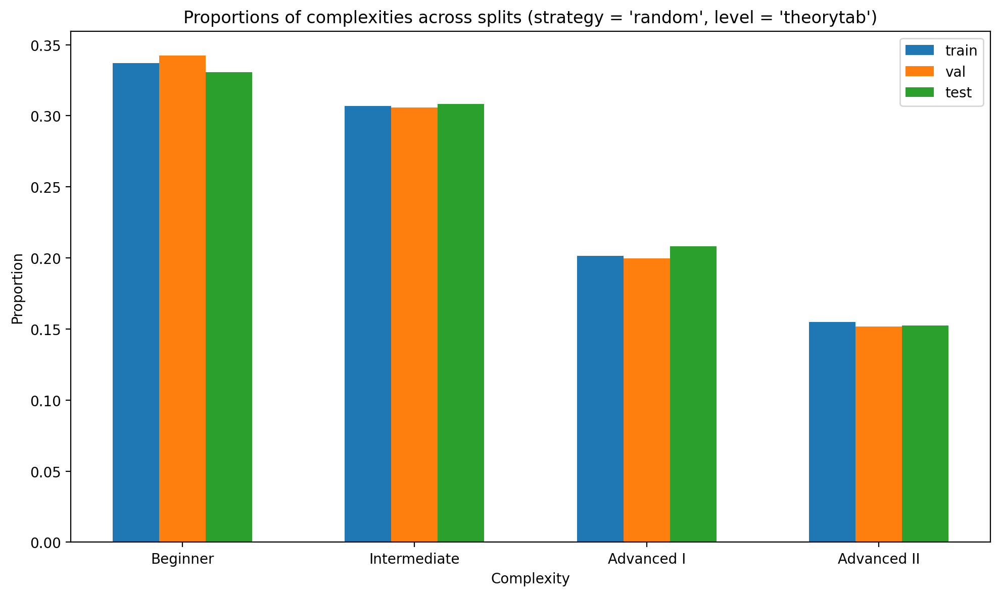

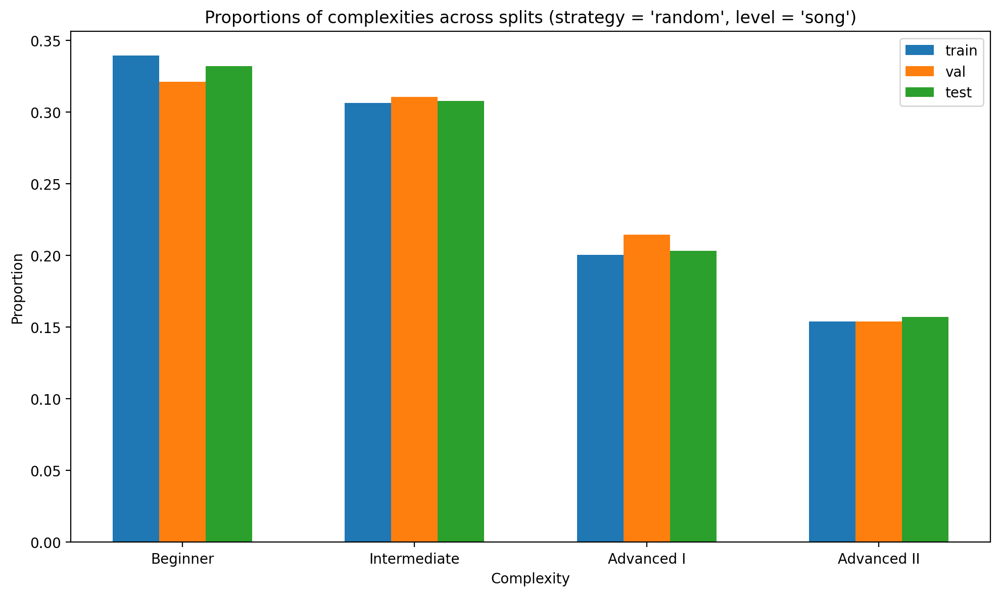

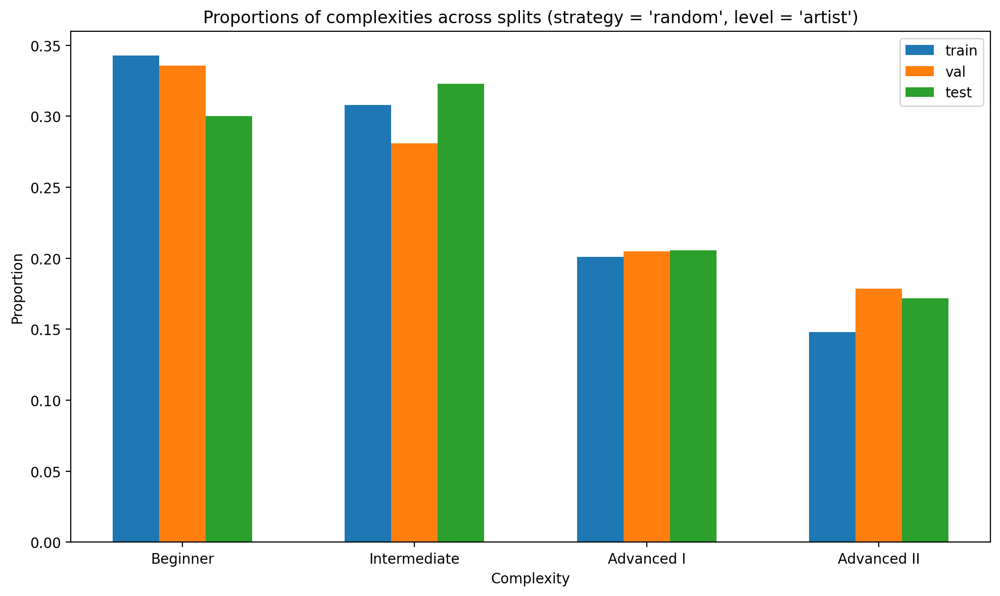

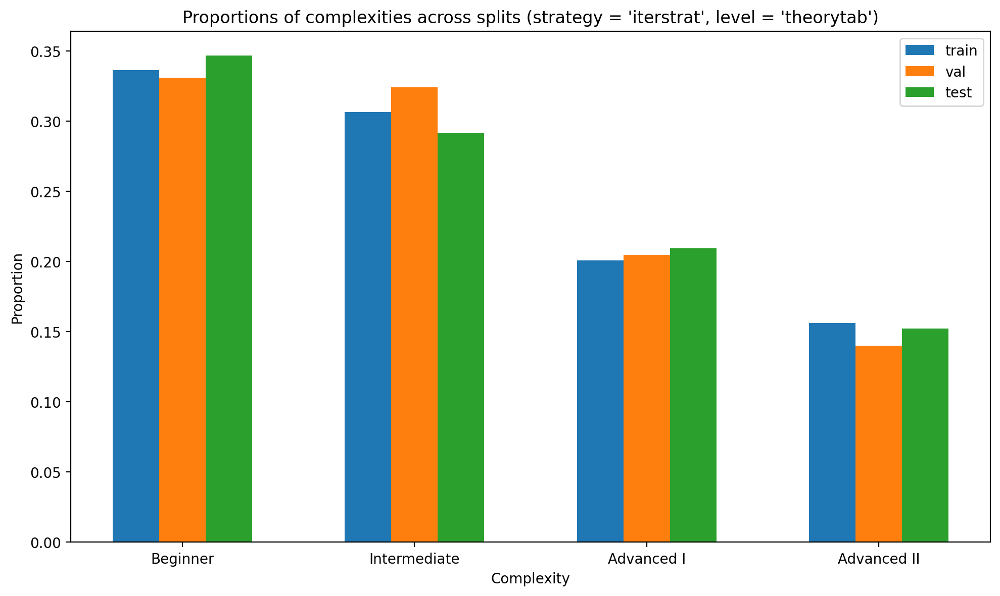

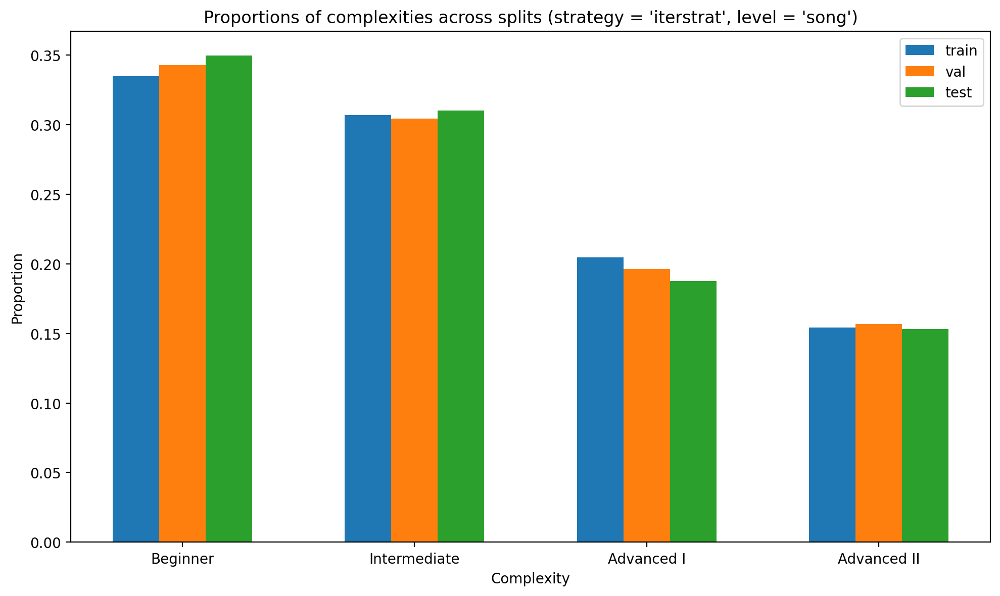

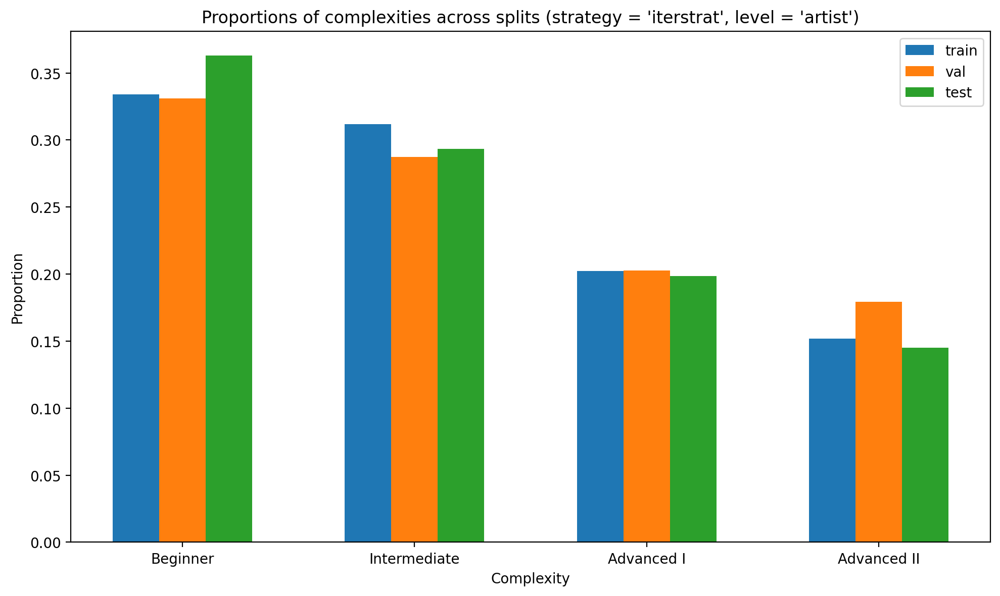

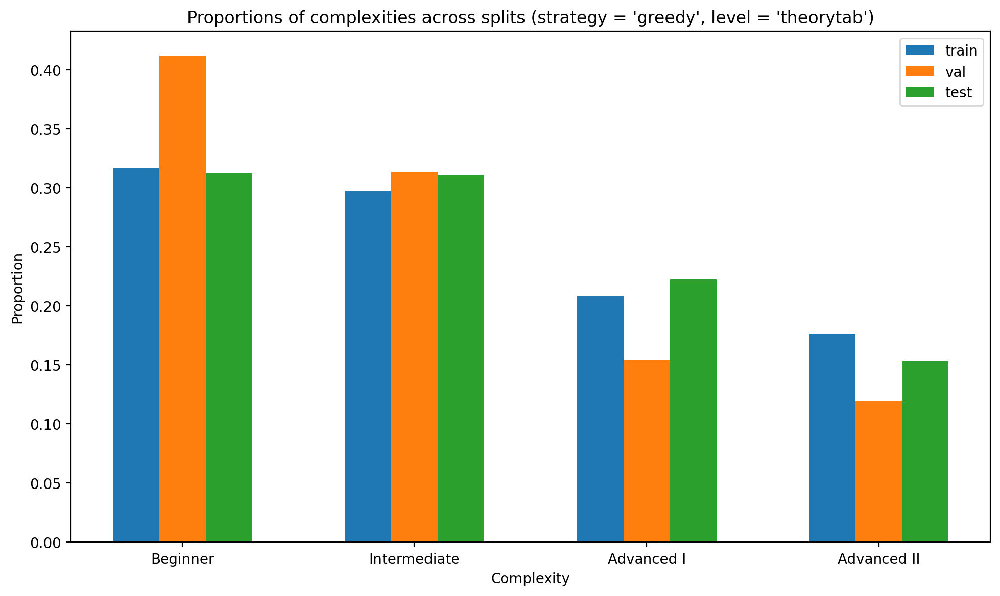

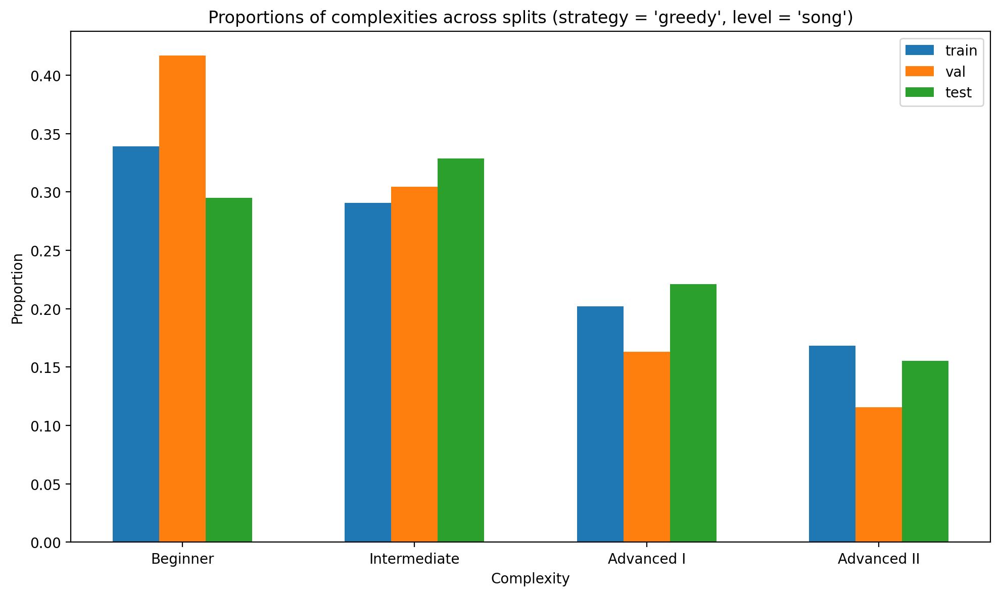

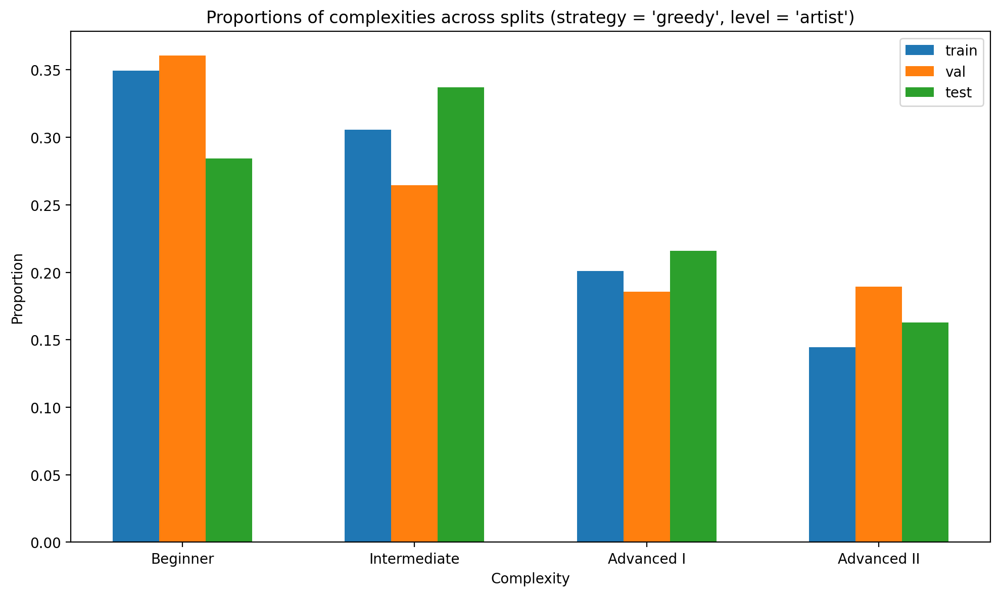

In [84]:
for strategy in stratification_complexity_proportion:
    for level in stratification_complexity_proportion[strategy]:
        sets = ['train', 'val', 'test']
        
        to_plot = [
            list(zip(COMPLEXITIES, stratification_complexity_proportion[strategy][level]['train'])),
            list(zip(COMPLEXITIES, stratification_complexity_proportion[strategy][level]['val'])),
            list(zip(COMPLEXITIES, stratification_complexity_proportion[strategy][level]['test']))
        ]
        
        # Rearranging the data to group by set (Train, Validation, Test) instead of level
        grouped_values = {set_name: [group[i][1] for i in range(len(COMPLEXITIES))] for set_name, group in zip(sets, to_plot)}
        
        # Bar plot parameters
        x = np.arange(len(COMPLEXITIES))
        width = 0.2
        
        # Plotting
        fig, ax = plt.subplots(figsize=(10, 6))
        for i, (set_name, value) in enumerate(grouped_values.items()):
            ax.bar(x + i*width - width, value, width, label=set_name)
        
        ax.set_xlabel('Complexity')
        ax.set_ylabel('Proportion')
        ax.set_title(f'Proportions of complexities across splits ({strategy = }, {level = })')
        ax.set_xticks(x)
        ax.set_xticklabels(COMPLEXITIES)
        ax.legend()
        plt.tight_layout()
        plt.show()

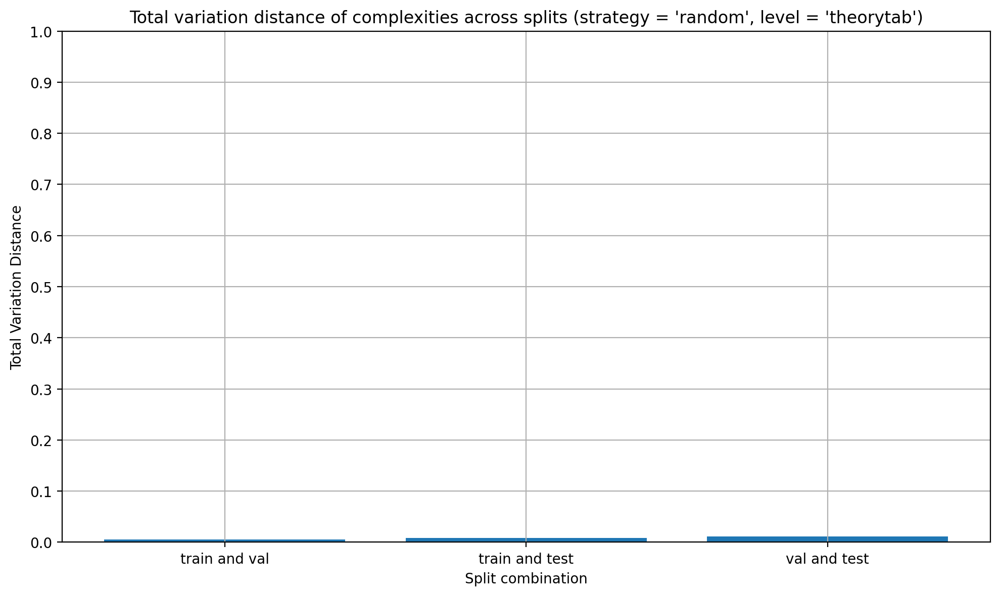

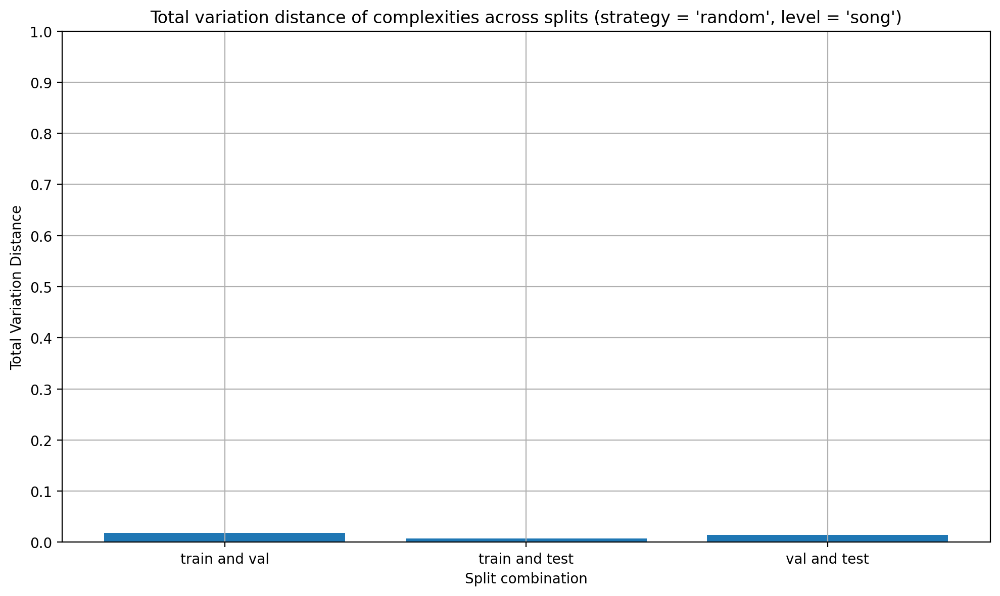

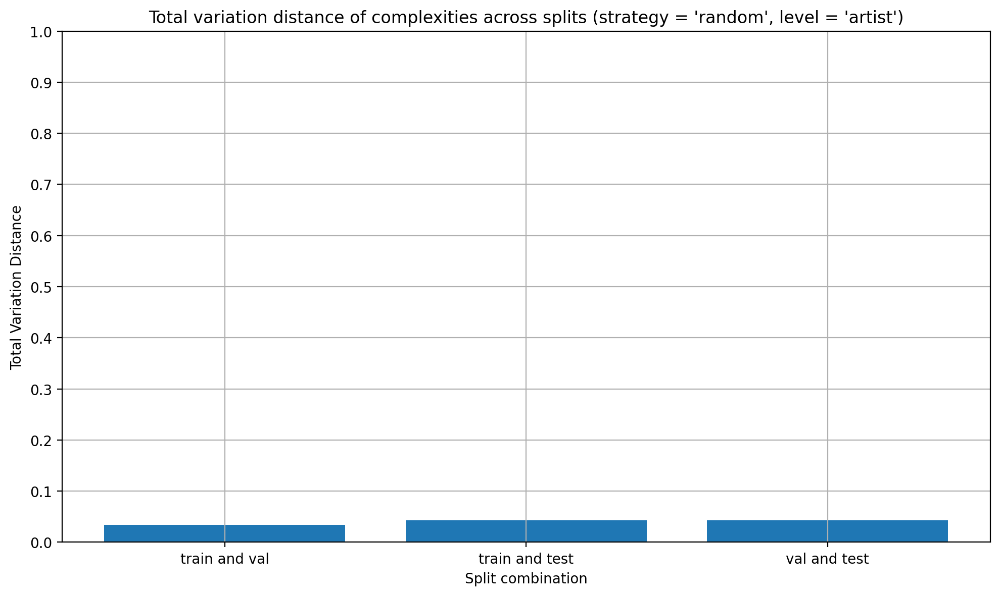

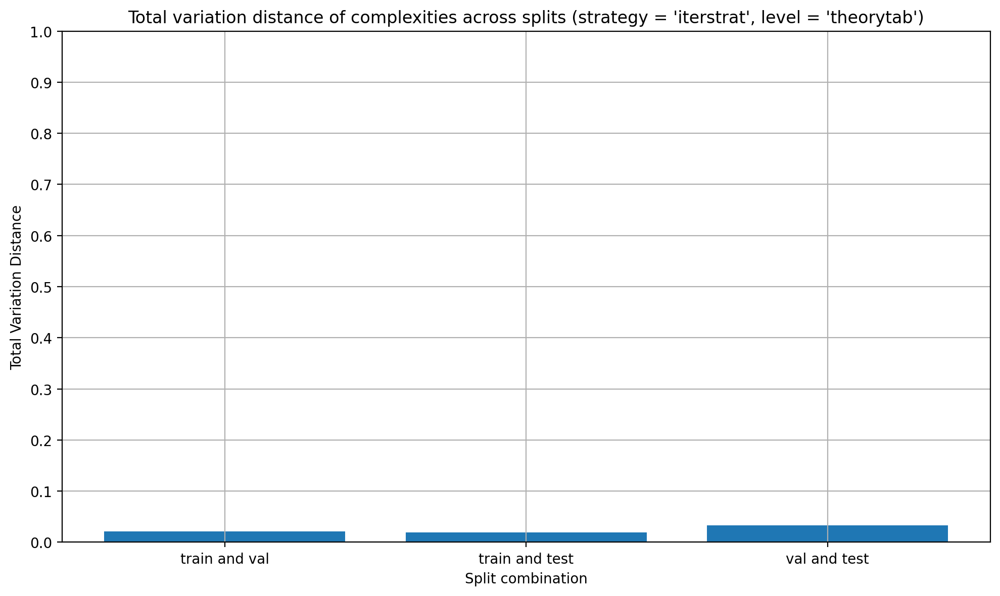

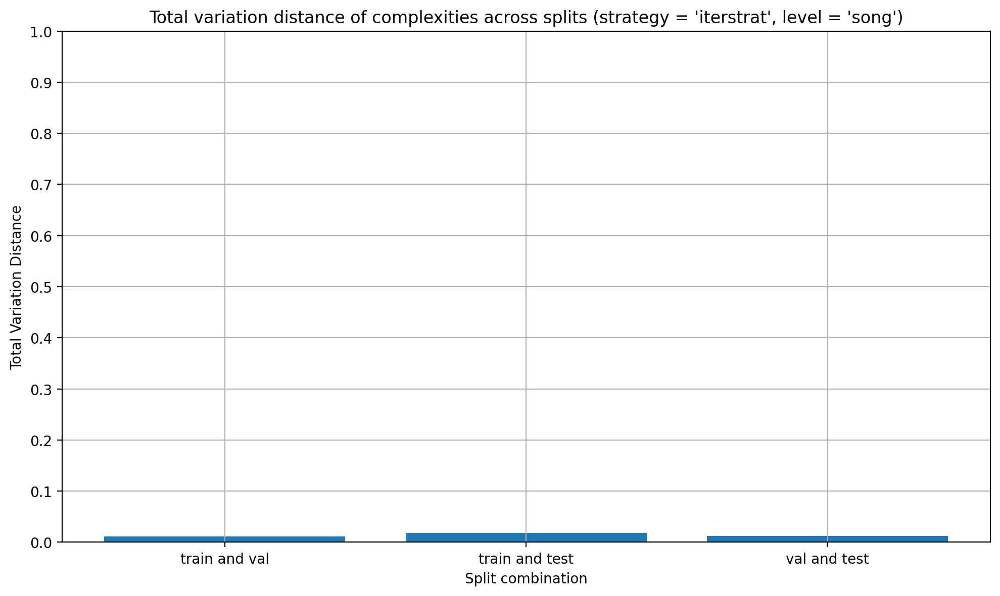

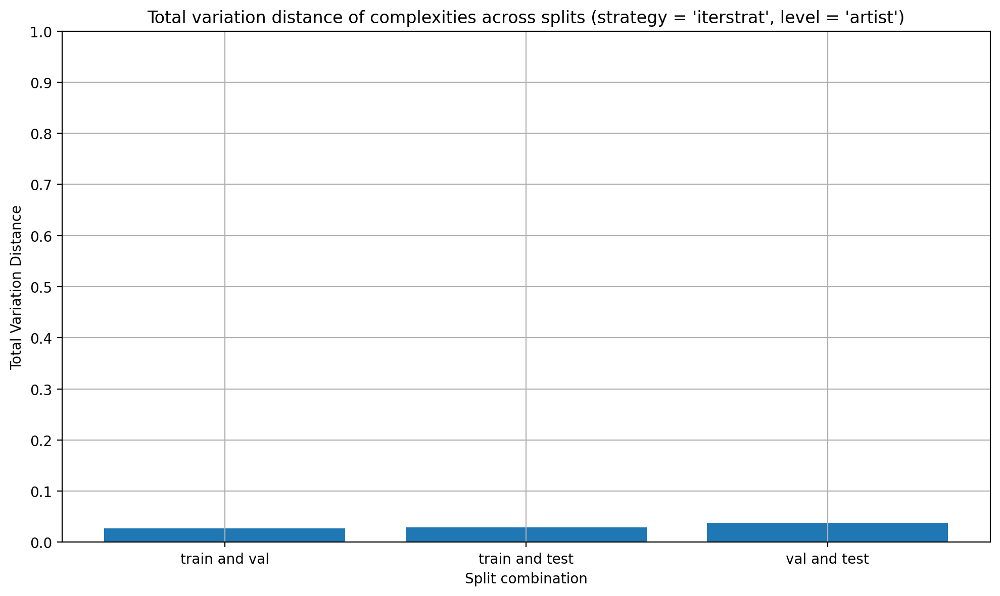

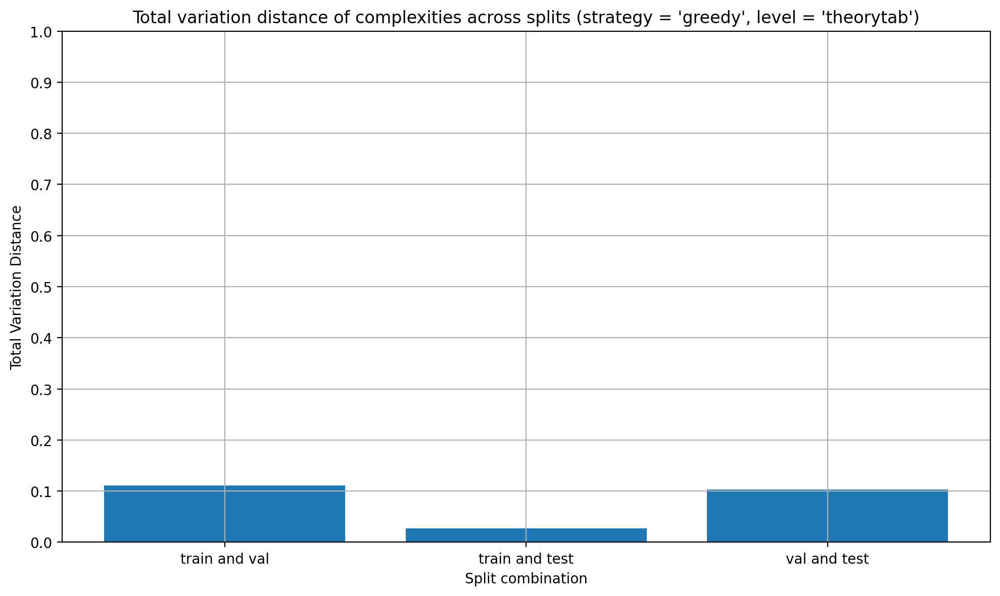

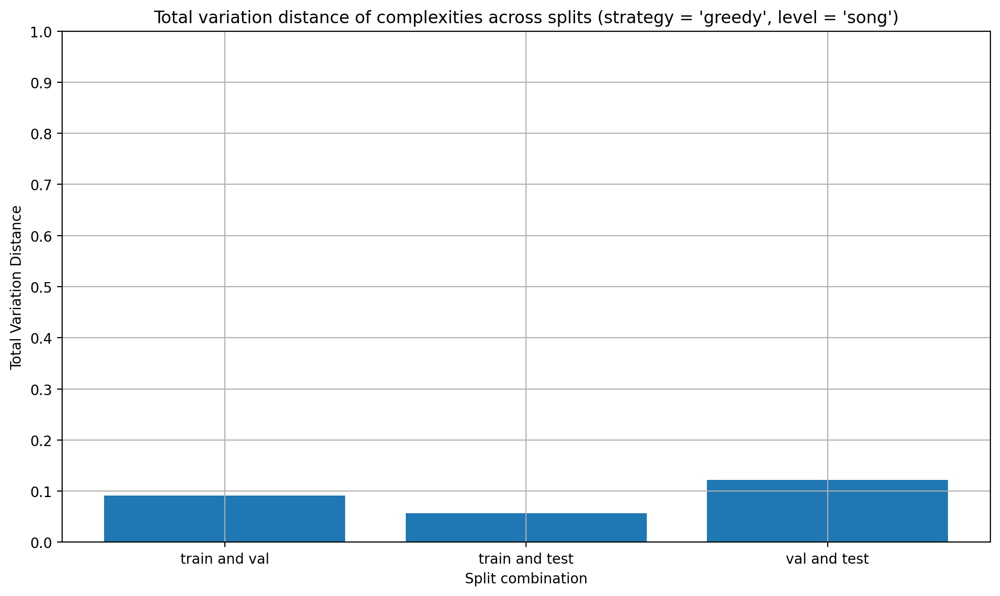

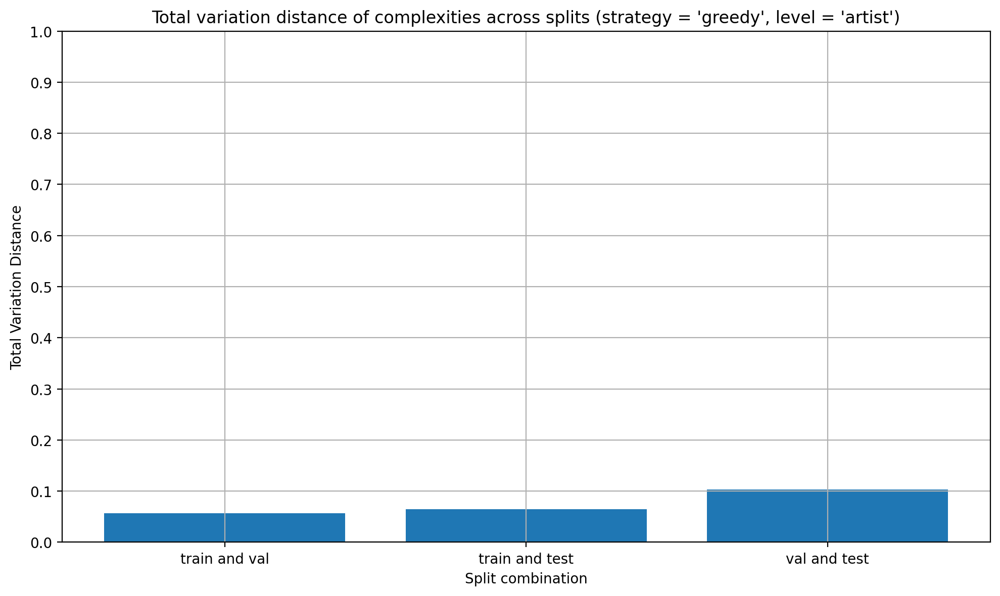

In [85]:
def total_variation_distance(p, q):
    return 0.5 * np.sum(np.abs(p - q))

for strategy in stratification_complexity_proportion:
    for level in stratification_complexity_proportion[strategy]:
        tvds = {}
        
        for (split_x, split_y) in [['train', 'val'], ['train', 'test'], ['val', 'test']]:
            p = np.array(stratification_complexity_proportion[strategy][level][split_x])
            q = np.array(stratification_complexity_proportion[strategy][level][split_y])

            tvds[f'{split_x} and {split_y}'] = total_variation_distance(p, q)
        
        # Plotting
        fig, ax = plt.subplots(figsize=(10, 6))
        ax.bar(tvds.keys(), tvds.values())
        
        ax.set_xlabel('Split combination')
        ax.set_ylabel('Total Variation Distance')
        ax.set_title(f'Total variation distance of complexities across splits ({strategy = }, {level = })')
        ax.set_ylim(0, 1)
        ax.set_yticks(np.arange(0, 1.1, 0.1))
        plt.grid(True)
        plt.tight_layout()
        plt.show()

- **Question:** should the count be considered per segment?

## Genre distribution

In [86]:
all_genres = set()
get_theorytab_genres = lambda theorytab_id: theorytab_dataset[theorytab_id]['hooktheory']['genres']

for theorytab_id in theorytab_dataset:
    for genre in get_theorytab_genres(theorytab_id):
        all_genres.add(genre)

all_genres = sorted(all_genres)
print('TheoryTab Dataset genres:', all_genres)

TheoryTab Dataset genres: ['Alt-Country', 'Alternative', 'Blues', "Children's", 'Classical', 'Country', 'Dance', 'Disney', 'Electronic', 'Experimental', 'Folk', 'Hip-Hop/Rap', 'Holiday', 'House', 'Indie', 'J-Pop', 'Jazz', 'K-pop', 'Latin', 'Metal', 'Pop', 'Punk', 'R & B', 'Reggae', 'Rock', 'Singer-Songwriter', 'Soul', 'Soundtrack', 'Techno', 'Video Game', 'Vocal', 'World', 'Worship']


In [87]:
stratification_genre_proportion = {}

for strategy in stratification_info:
    stratification_genre_proportion[strategy] = {}
    
    for level in stratification_info[strategy]:
        stratification_genre_proportion[strategy][level] = {}
        
        for split, theorytab_ids in stratification_info[strategy][level].items():
            genres = list(map(get_theorytab_genres, theorytab_ids))
            genres = [genre for genre_list in genres for genre in genre_list]
            
            genres, genres_count = np.unique(genres, return_counts=True)
            genres_proportion = genres_count / np.sum(genres_count)
    
            temp_dict = dict(zip(genres, genres_proportion))
            temp_dict = {genre: temp_dict.get(genre, 0) for genre in all_genres}
            
            stratification_genre_proportion[strategy][level][split] = list(temp_dict.values())

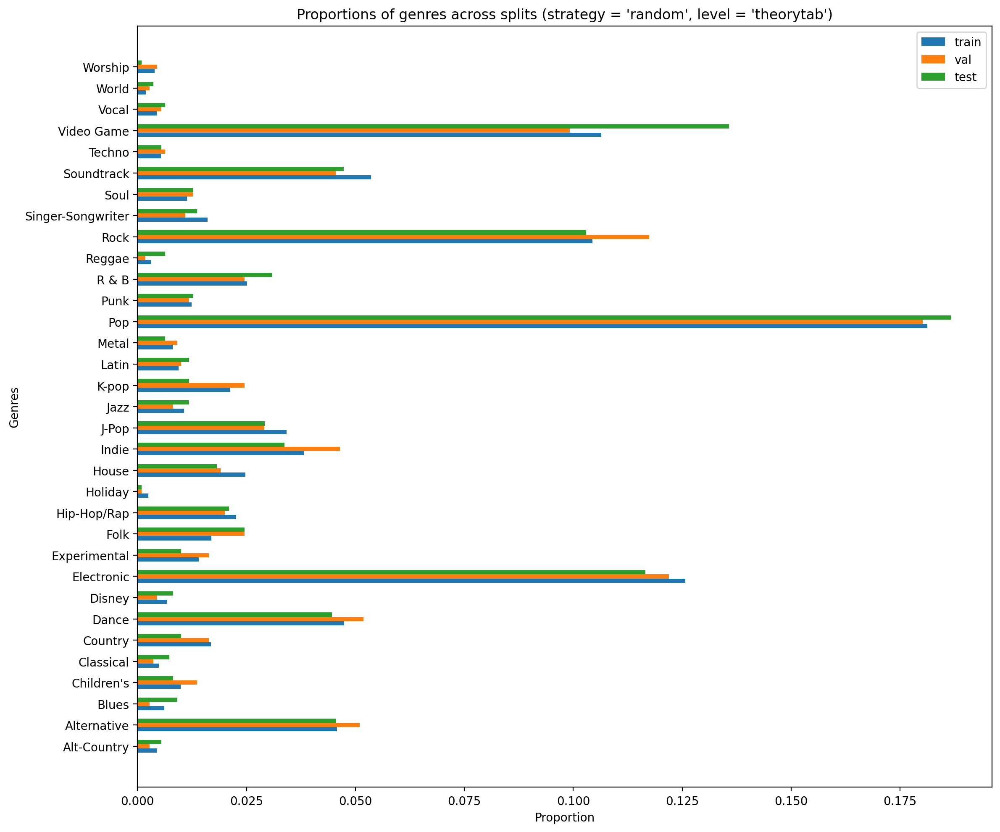

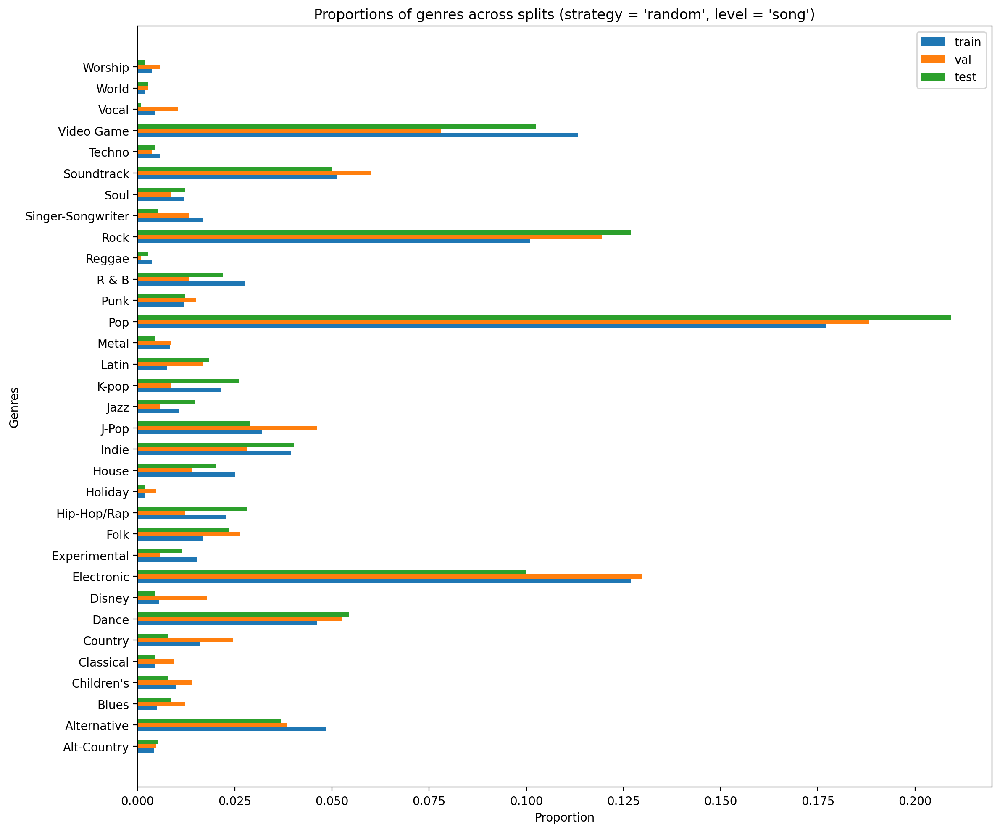

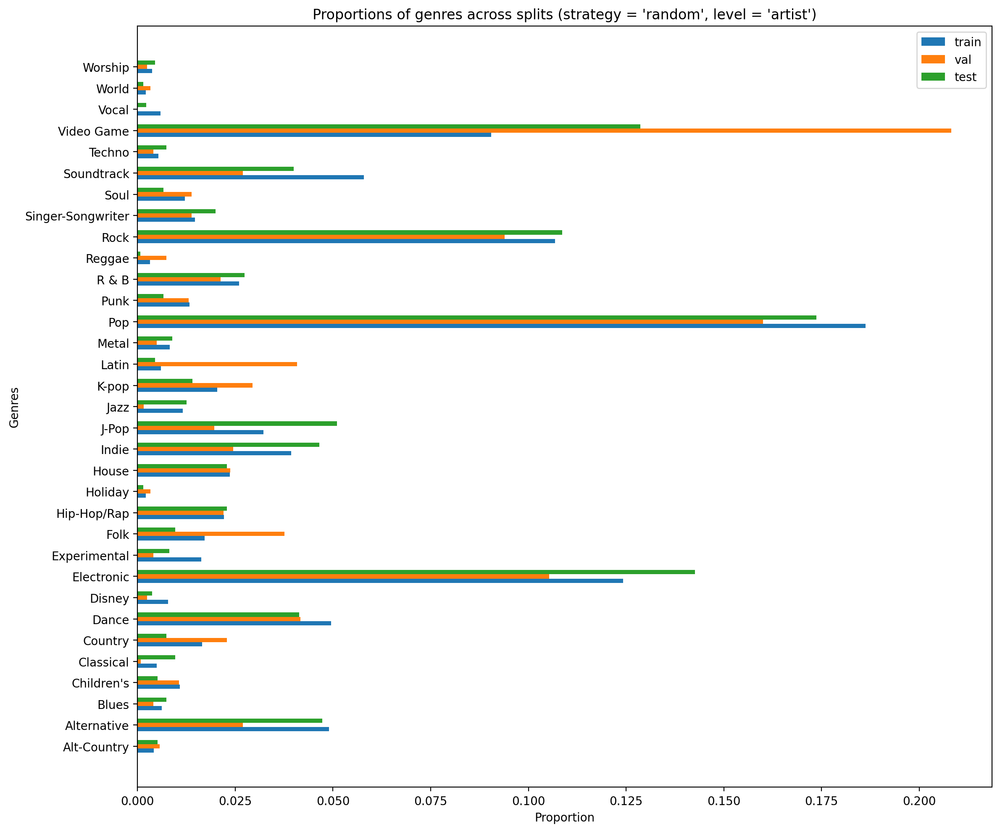

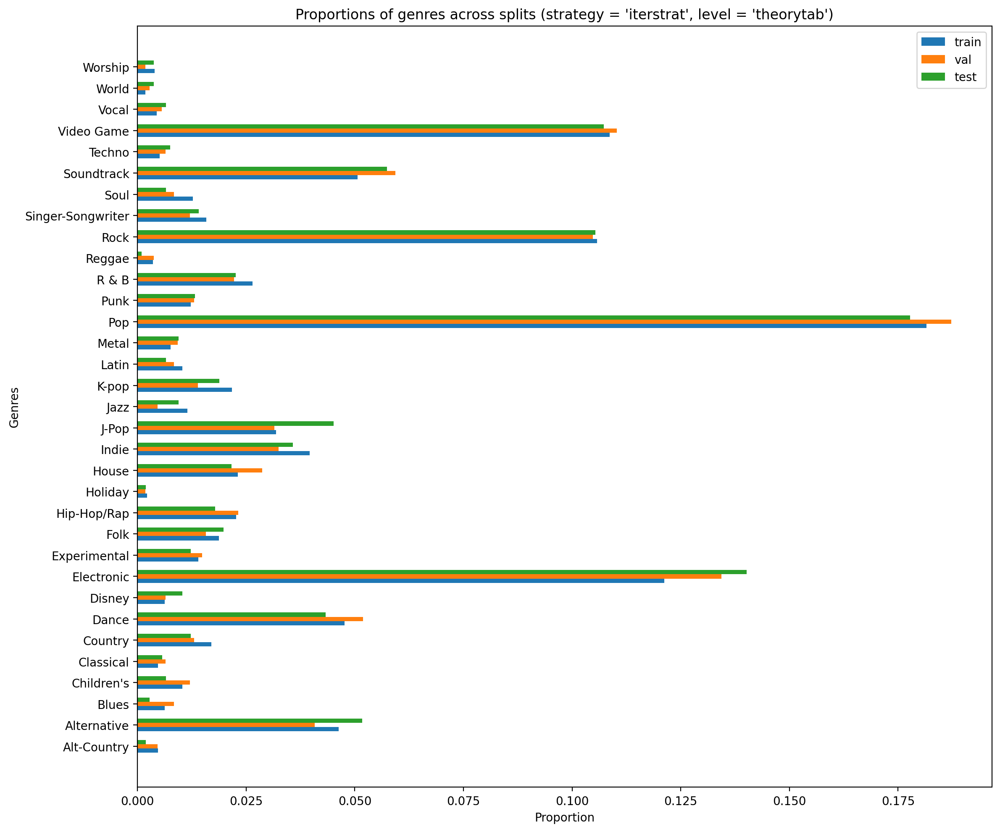

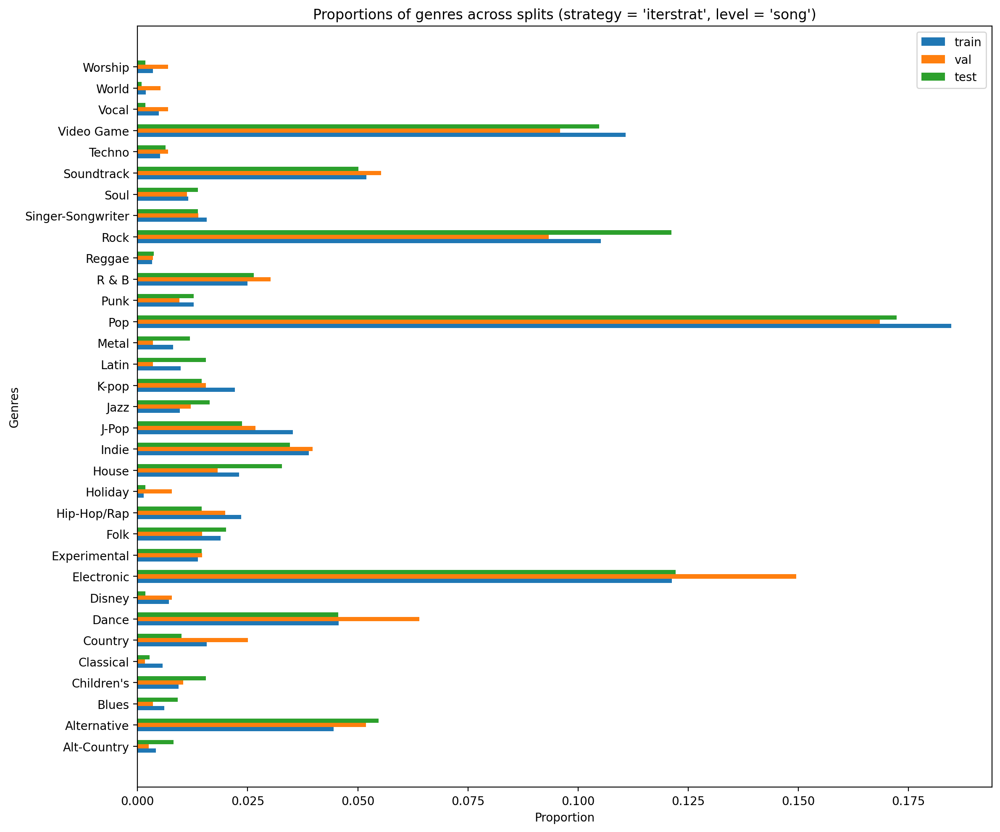

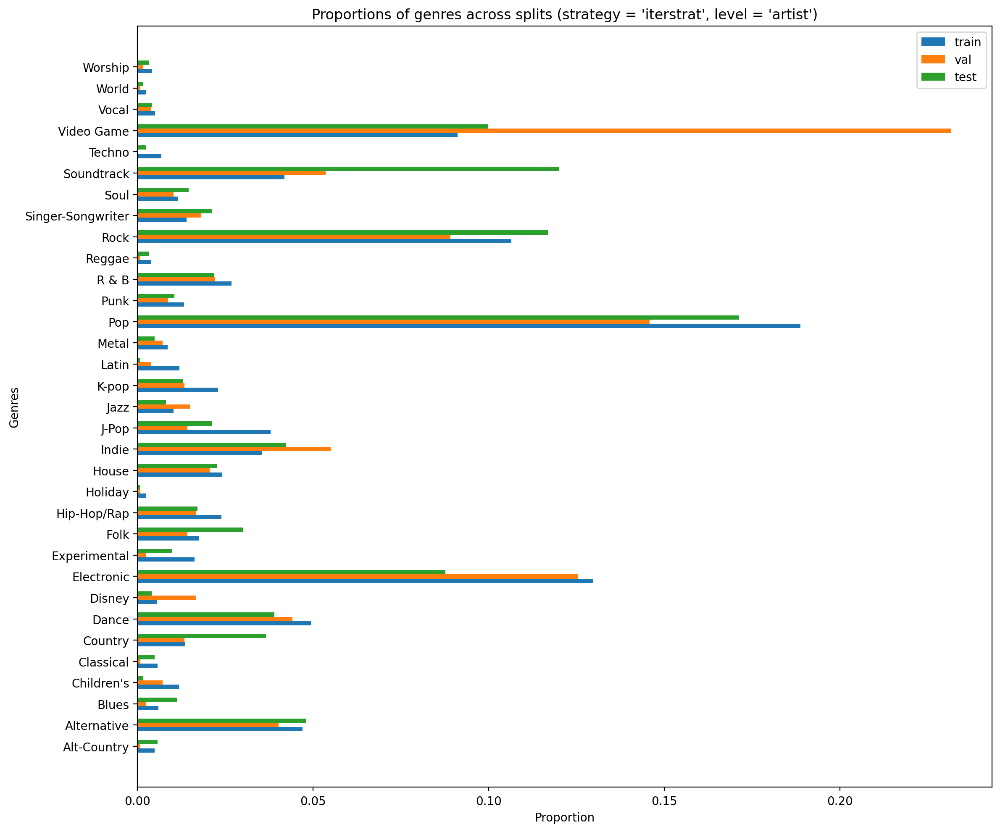

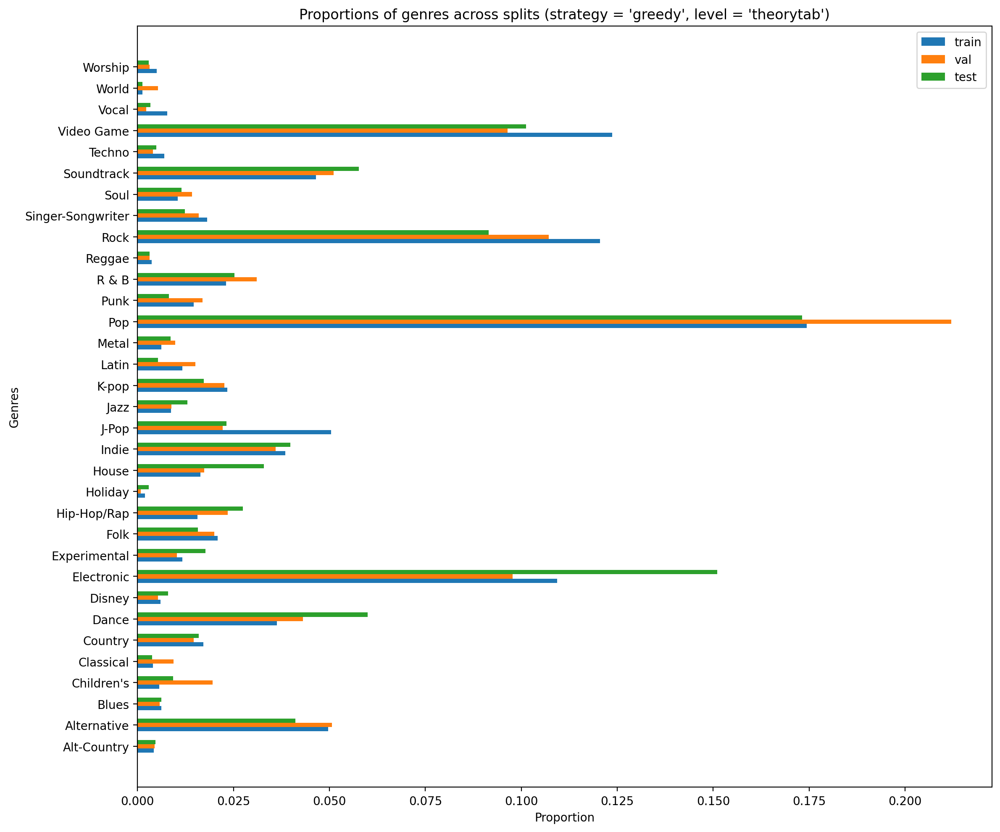

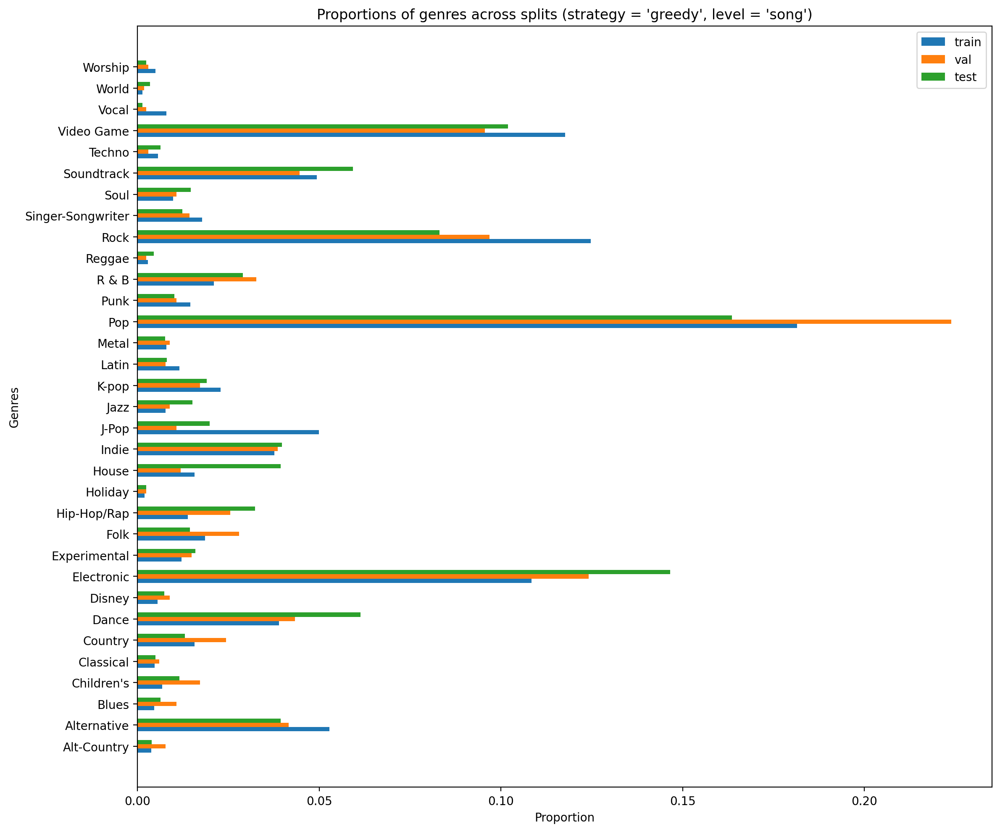

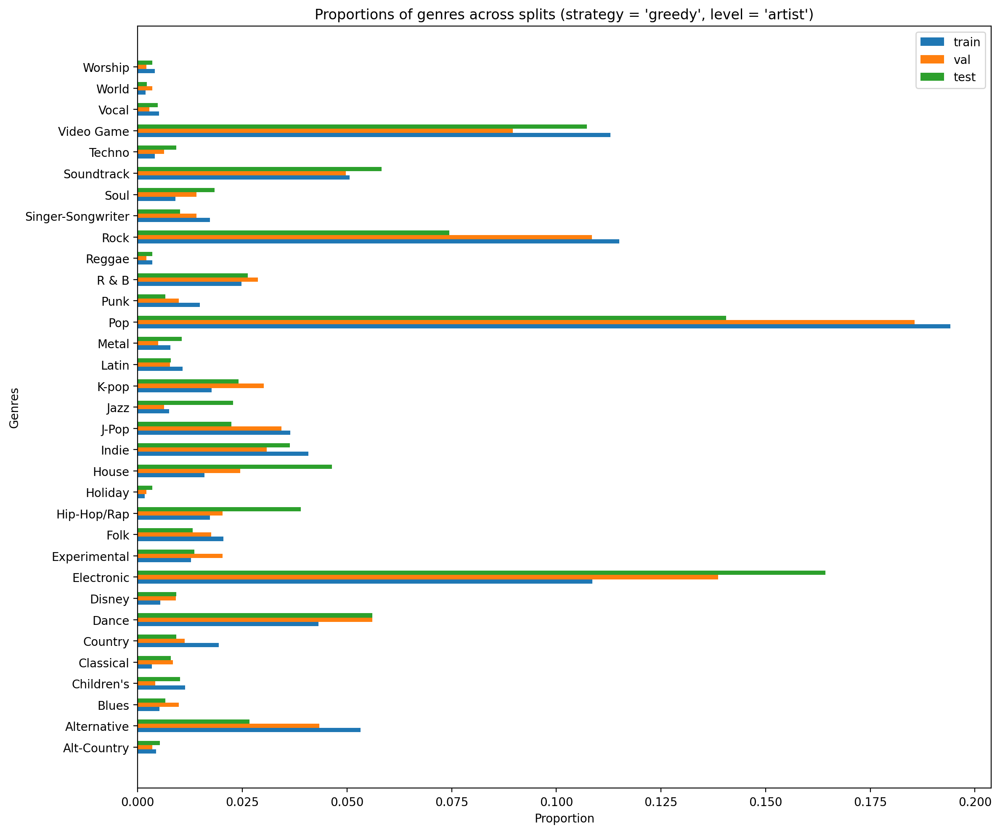

In [89]:
for strategy in stratification_genre_proportion:
    for level in stratification_genre_proportion[strategy]:
        sets = ['train', 'val', 'test']
        
        to_plot = [
            list(zip(all_genres, stratification_genre_proportion[strategy][level]['train'])),
            list(zip(all_genres, stratification_genre_proportion[strategy][level]['val'])),
            list(zip(all_genres, stratification_genre_proportion[strategy][level]['test']))
        ]
        
        # Rearranging the data to group by set (Train, Validation, Test) instead of level
        grouped_values = {set_name: [group[i][1] for i in range(len(all_genres))] for set_name, group in zip(sets, to_plot)}
        
        # Bar plot parameters
        x = np.arange(len(all_genres))
        height = 0.2
        
        # Plotting
        fig, ax = plt.subplots(figsize=(12, 10))
        for i, (set_name, value) in enumerate(grouped_values.items()):
            ax.barh(x + i*height - height, value, height, label=set_name)
        
        ax.set_xlabel('Proportion')
        ax.set_ylabel('Genres')
        ax.set_title(f'Proportions of genres across splits ({strategy = }, {level = })')
        ax.set_yticks(x)
        ax.set_yticklabels(all_genres)
        ax.legend()
        plt.tight_layout()
        plt.show()

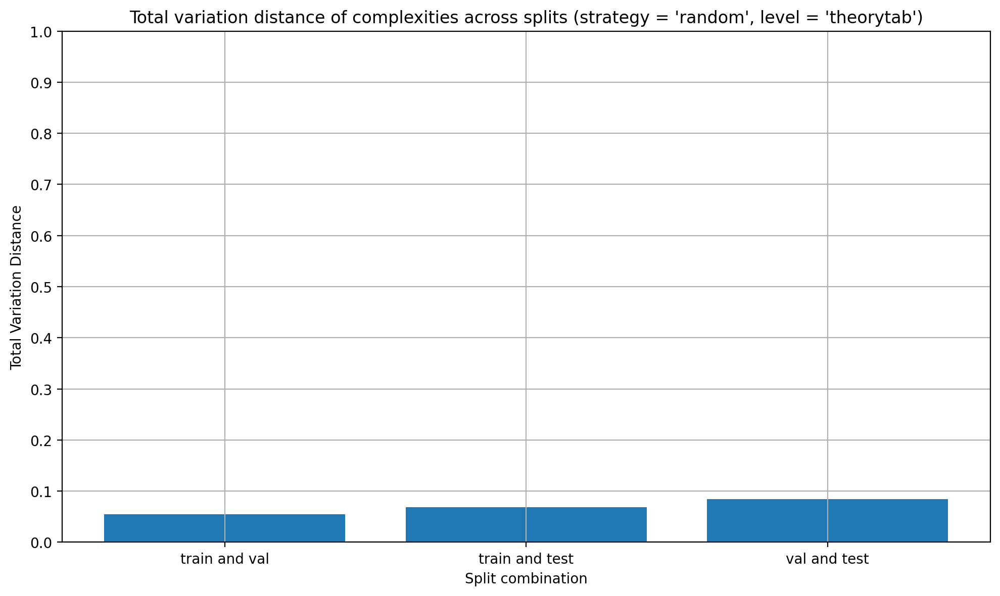

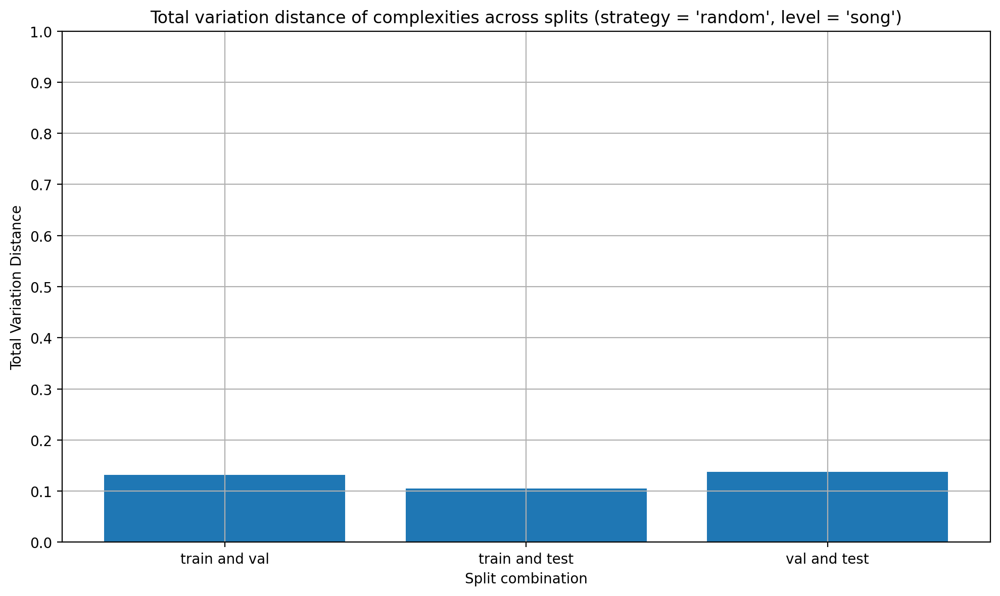

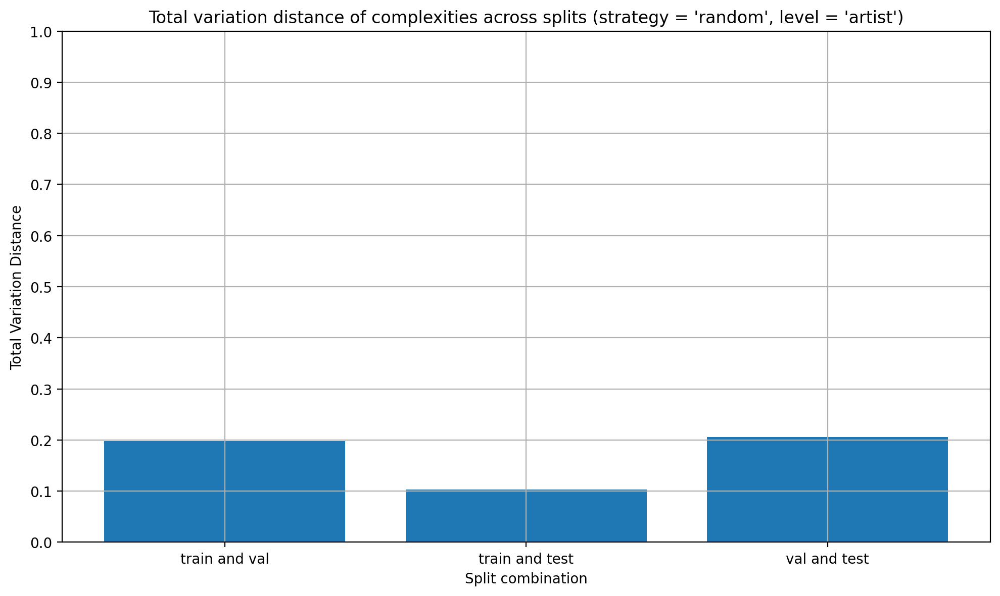

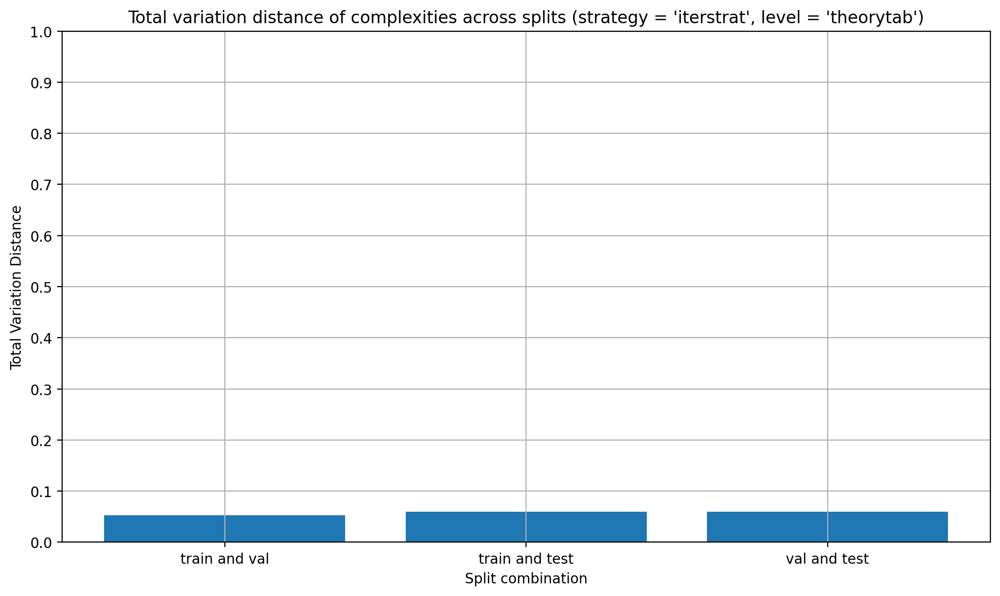

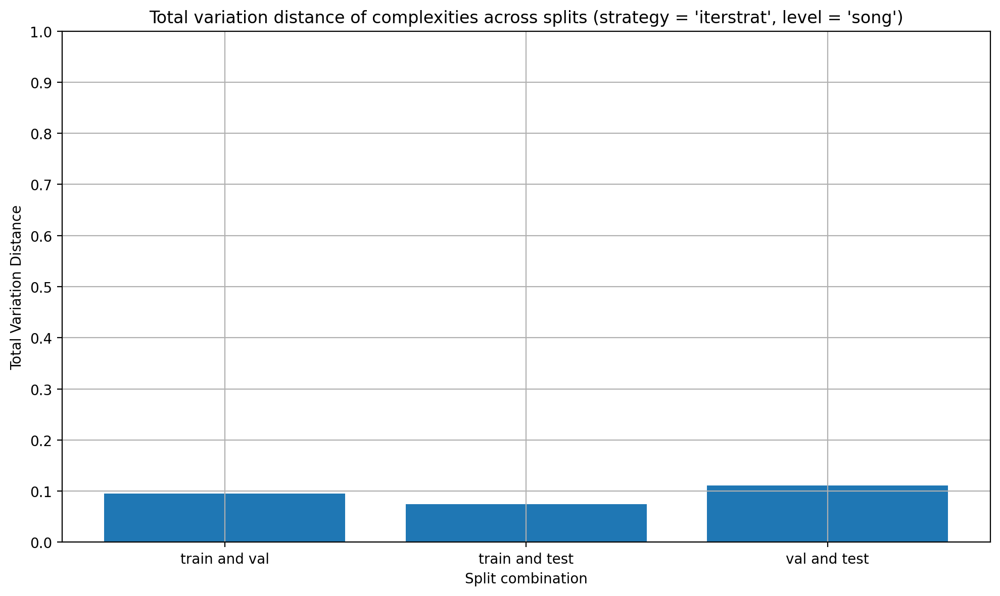

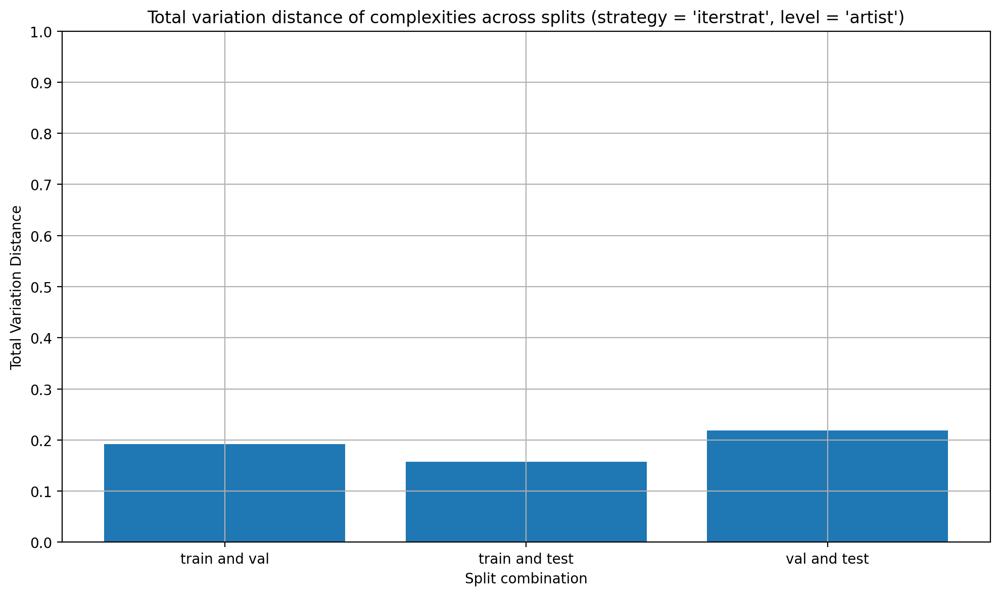

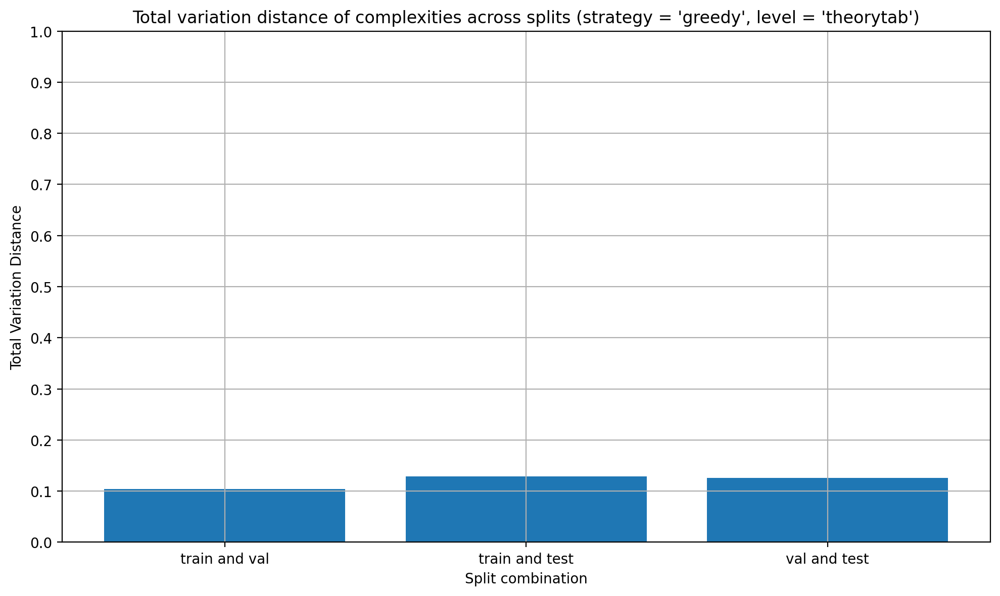

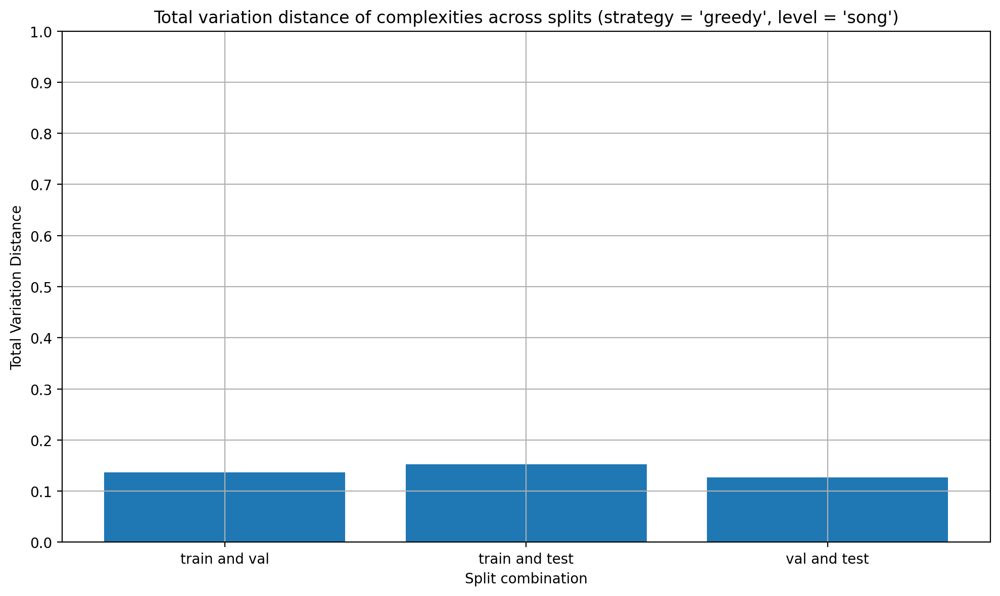

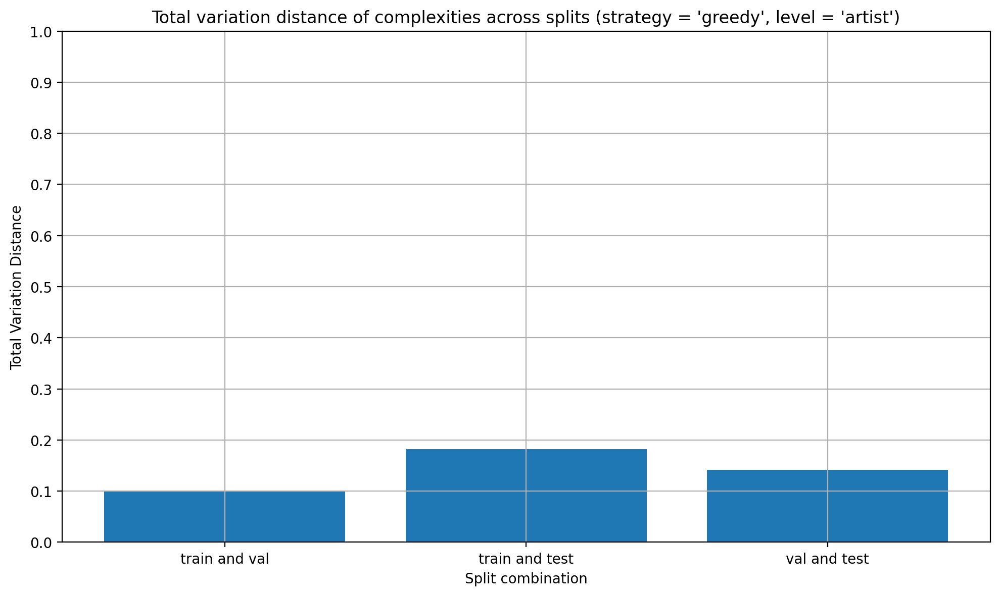

In [91]:
for strategy in stratification_genre_proportion:
    for level in stratification_genre_proportion[strategy]:
        tvds = {}
        
        for (split_x, split_y) in [['train', 'val'], ['train', 'test'], ['val', 'test']]:
            p = np.array(stratification_genre_proportion[strategy][level][split_x])
            q = np.array(stratification_genre_proportion[strategy][level][split_y])

            tvds[f'{split_x} and {split_y}'] = total_variation_distance(p, q)
        
        # Plotting
        fig, ax = plt.subplots(figsize=(10, 6))
        ax.bar(tvds.keys(), tvds.values())
        
        ax.set_xlabel('Split combination')
        ax.set_ylabel('Total Variation Distance')
        ax.set_title(f'Total variation distance of genres across splits ({strategy = }, {level = })')
        ax.set_ylim(0, 1)
        ax.set_yticks(np.arange(0, 1.1, 0.1))
        plt.grid(True)
        plt.tight_layout()
        plt.show()

## Roman numeral distribution

In [93]:
def get_theorytab_rns(theorytab_id):
    rns = []

    for chord in theorytab_dataset[theorytab_id]['chords']:
        onset = chord['onset']
        offset = chord['offset']
        rns.extend((offset - onset) * [chord['simple_rn']])

    return rns

In [94]:
stratification_rn_proportion = {}

for strategy in stratification_info:
    stratification_rn_proportion[strategy] = {}
    
    for level in stratification_info[strategy]:
        stratification_rn_proportion[strategy][level] = {}
        
        for split, theorytab_ids in stratification_info[strategy][level].items():
            rns = list(map(get_theorytab_rns, theorytab_ids))
            rns = [rn for rn_list in rns for rn in rn_list]
            
            rns, rns_count = np.unique(rns, return_counts=True)
            rns_proportion = rns_count / np.sum(rns_count)
    
            temp_dict = dict(zip(rns, rns_proportion))
            temp_dict = {rn: temp_dict.get(rn, 0) for rn in TASK_DOMAINS['simple_rn']}
            
            stratification_rn_proportion[strategy][level][split] = list(temp_dict.values())

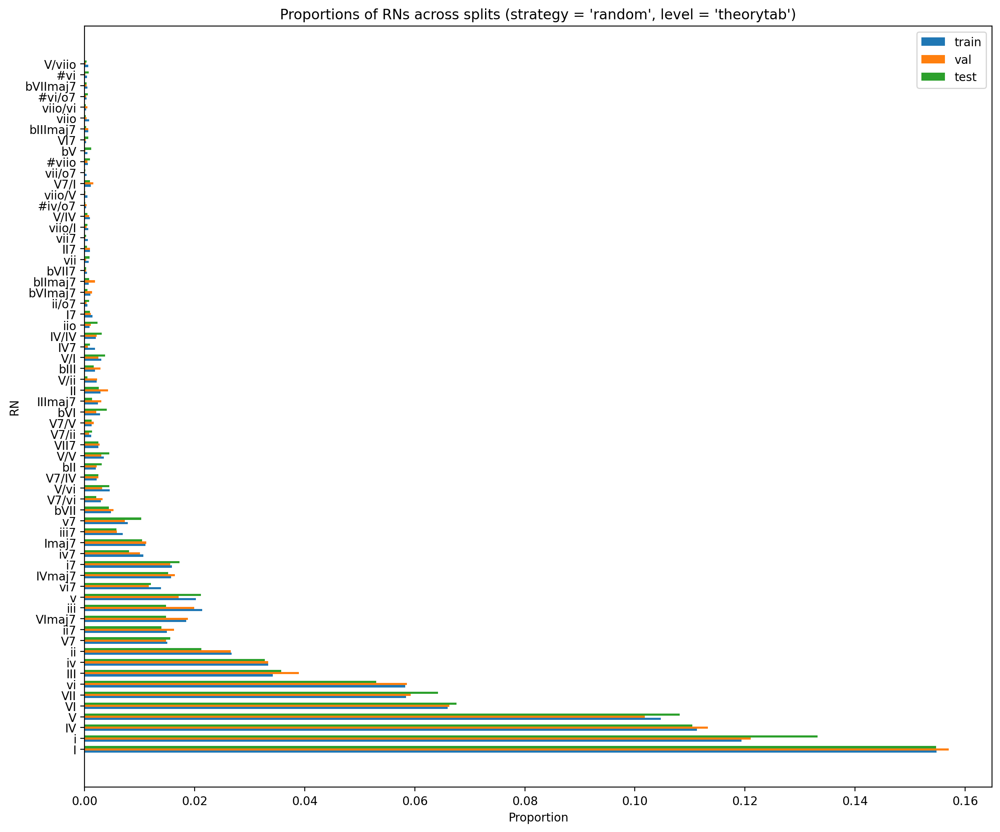

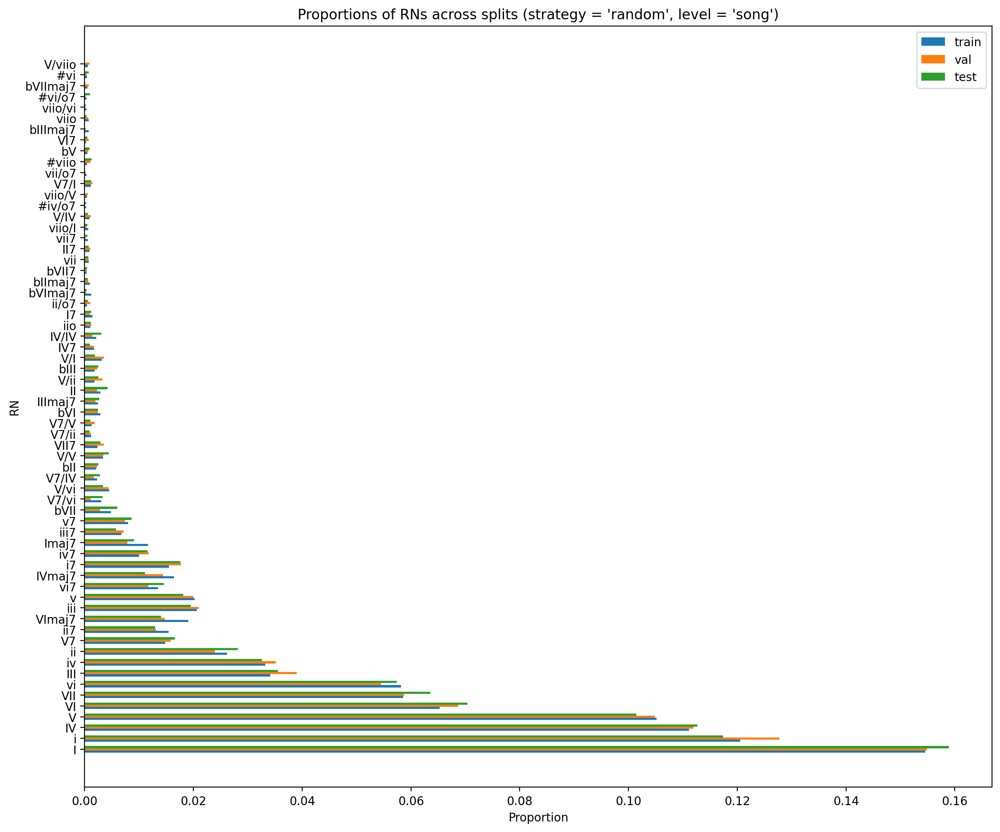

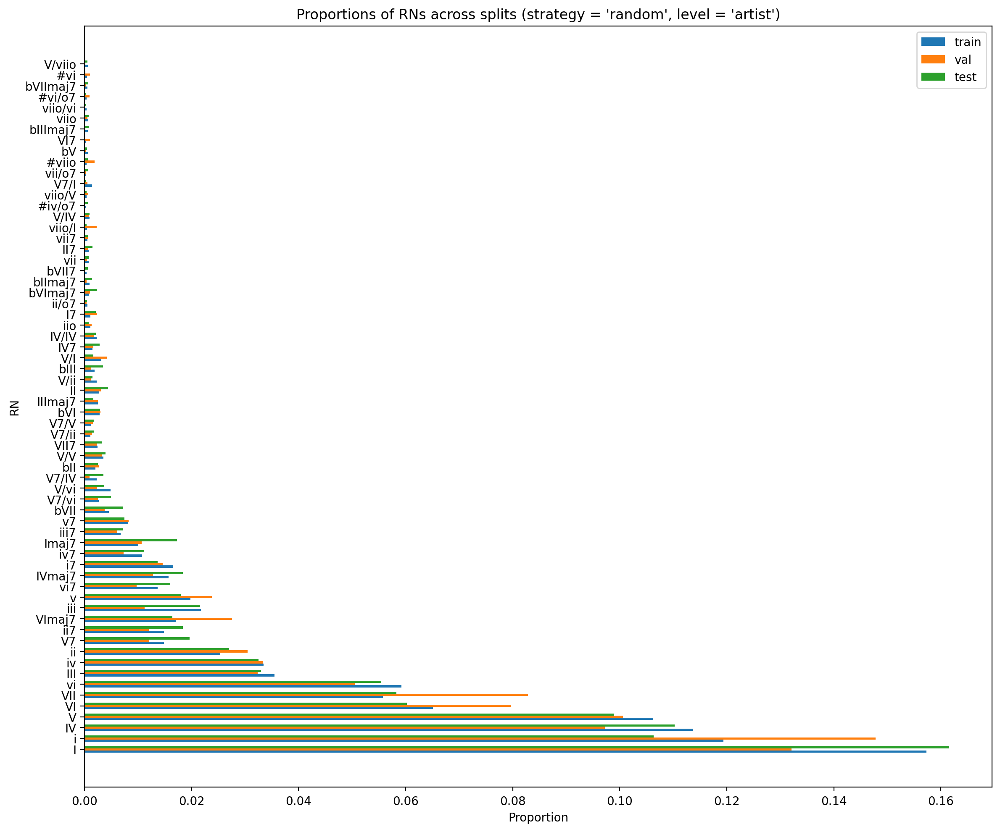

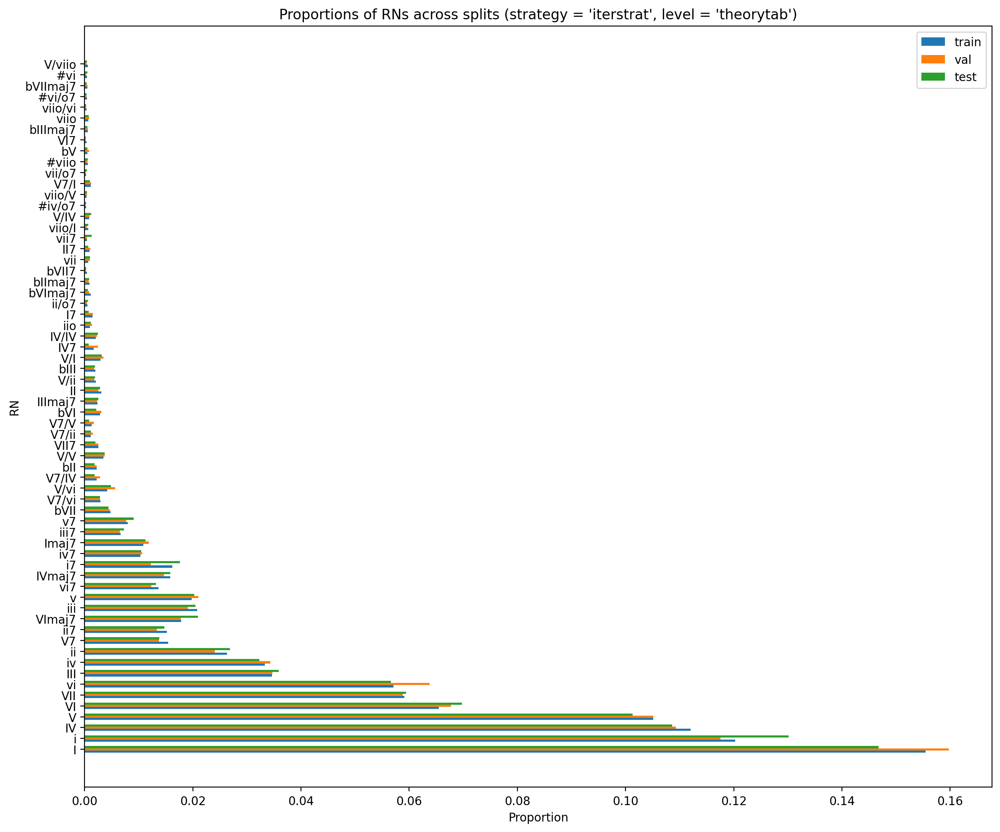

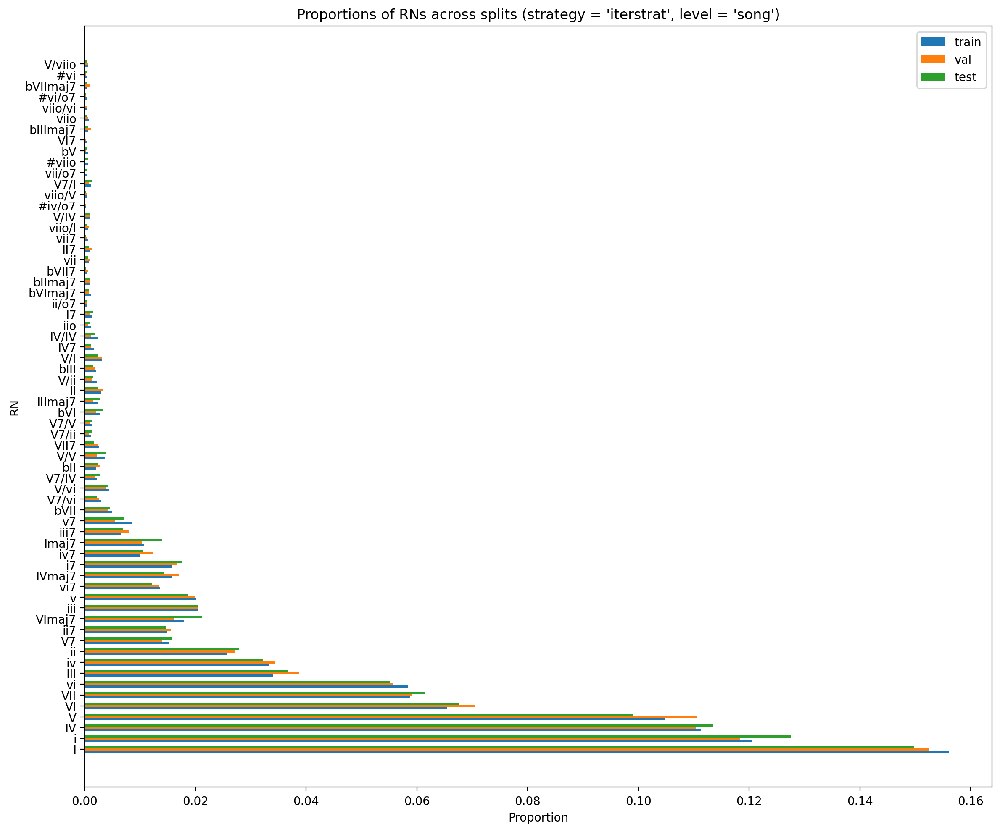

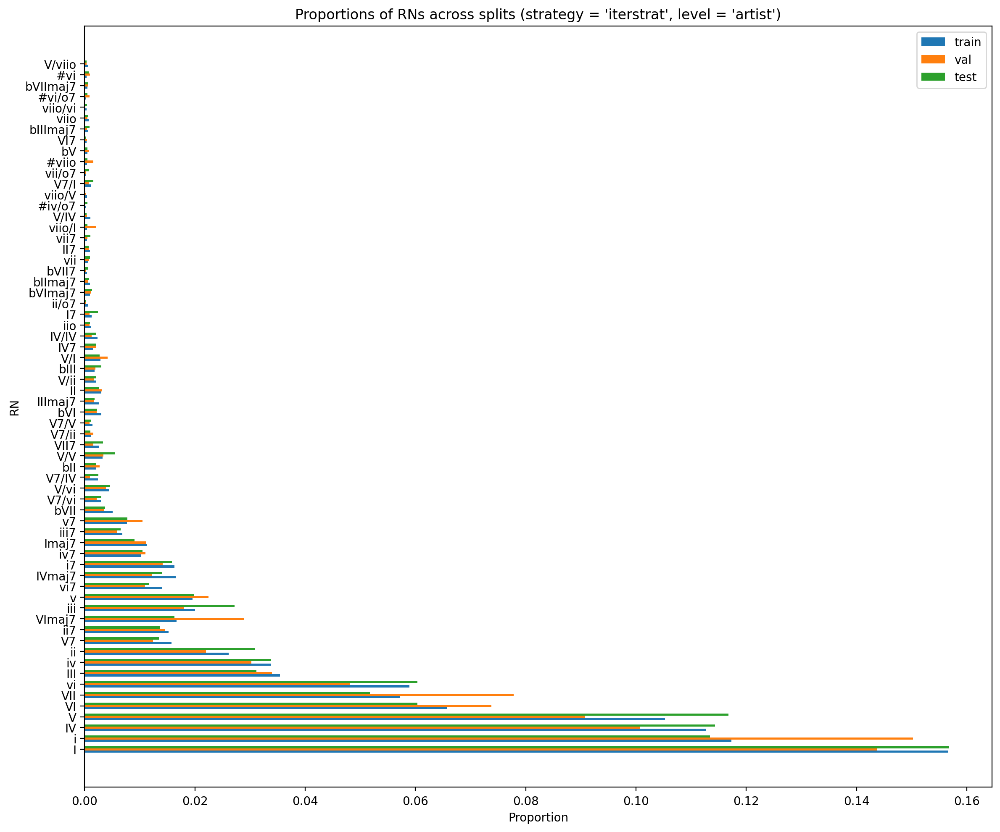

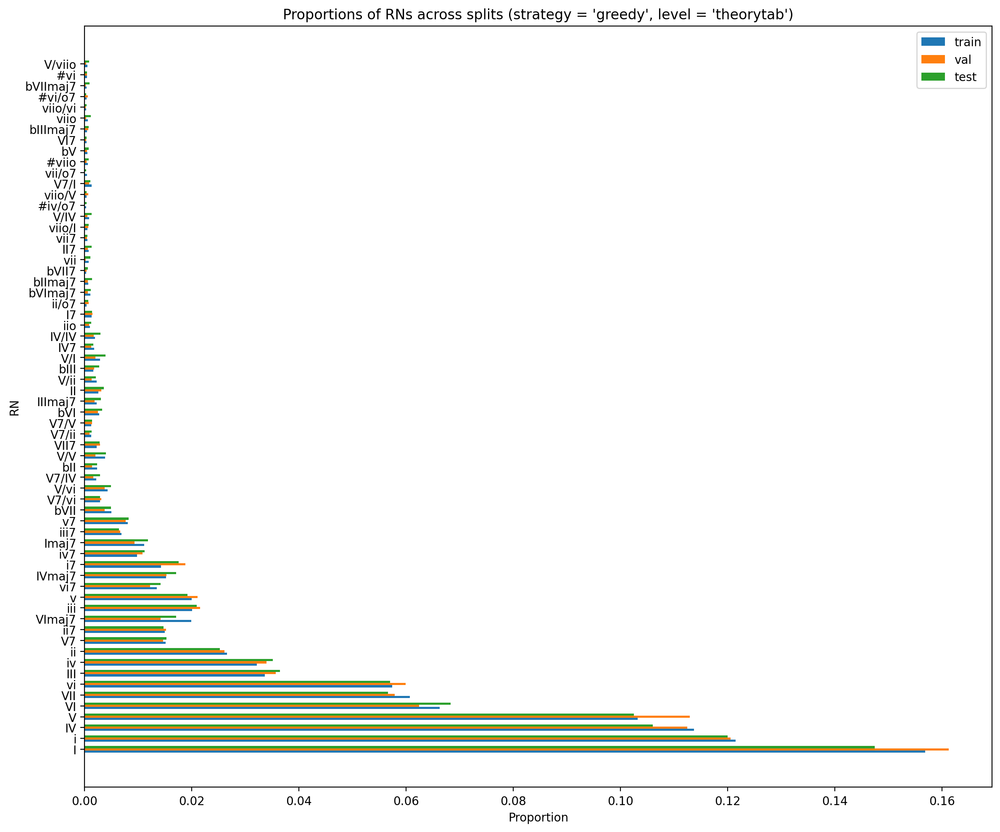

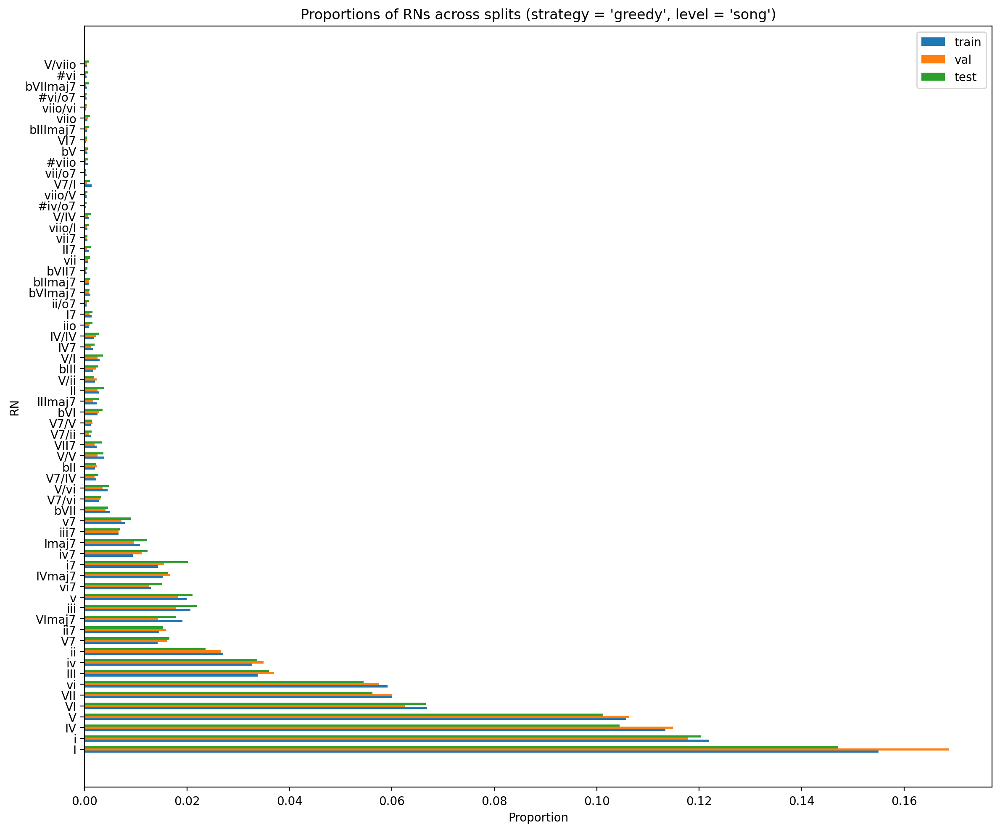

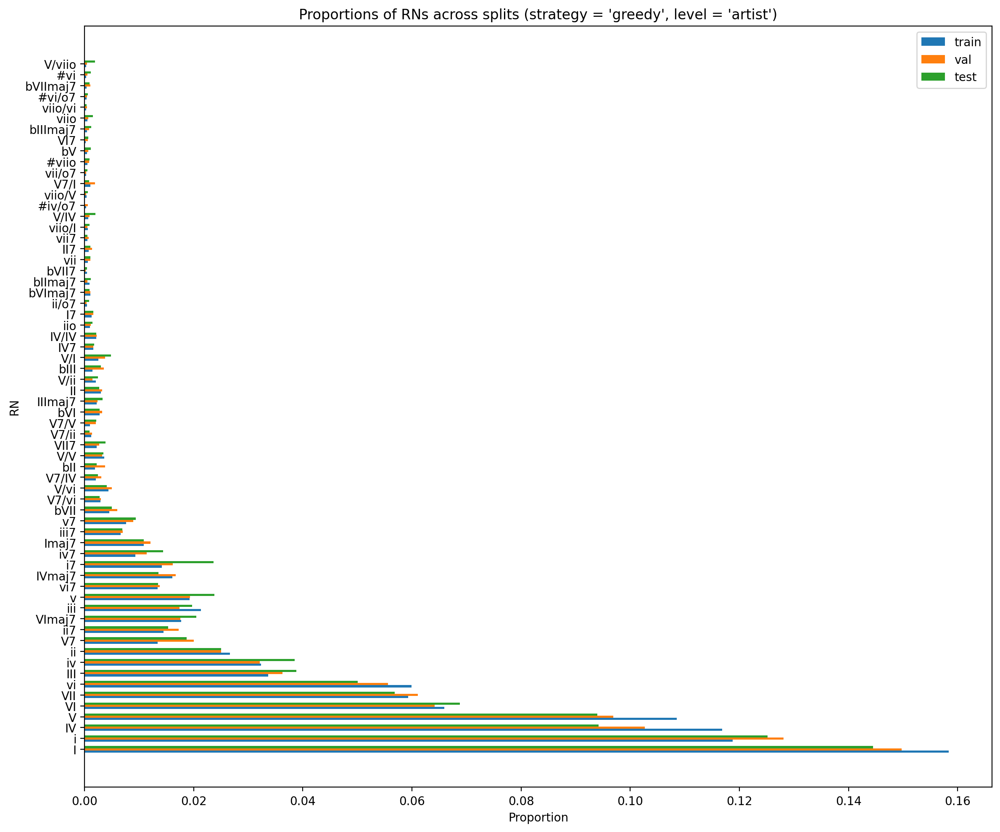

In [95]:
for strategy in stratification_rn_proportion:
    for level in stratification_rn_proportion[strategy]:
        sets = ['train', 'val', 'test']
        
        to_plot = [
            list(zip(TASK_DOMAINS['simple_rn'], stratification_rn_proportion[strategy][level]['train'])),
            list(zip(TASK_DOMAINS['simple_rn'], stratification_rn_proportion[strategy][level]['val'])),
            list(zip(TASK_DOMAINS['simple_rn'], stratification_rn_proportion[strategy][level]['test']))
        ]
        
        # Rearranging the data to group by set (Train, Validation, Test) instead of level
        grouped_values = {set_name: [group[i][1] for i in range(len(TASK_DOMAINS['simple_rn']))] for set_name, group in zip(sets, to_plot)}
        
        # Bar plot parameters
        x = np.arange(len(TASK_DOMAINS['simple_rn']))
        height = 0.2
        
        # Plotting
        fig, ax = plt.subplots(figsize=(12, 10))
        for i, (set_name, value) in enumerate(grouped_values.items()):
            ax.barh(x + i*height - height, value, height, label=set_name)
        
        ax.set_xlabel('Proportion')
        ax.set_ylabel('RN')
        ax.set_title(f'Proportions of RNs across splits ({strategy = }, {level = })')
        ax.set_yticks(x)
        ax.set_yticklabels(TASK_DOMAINS['simple_rn'])
        ax.legend()
        plt.tight_layout()
        plt.show()

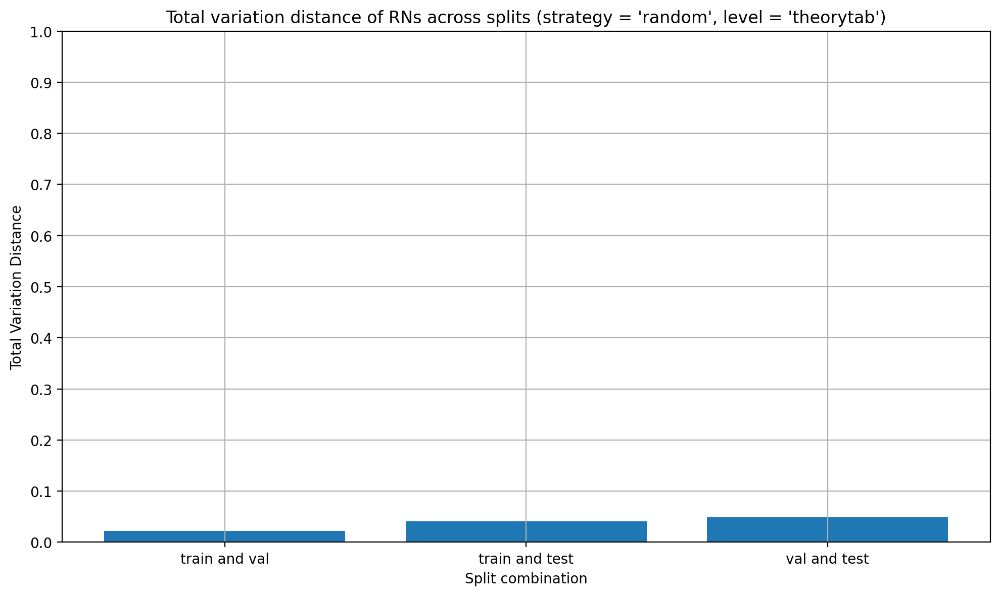

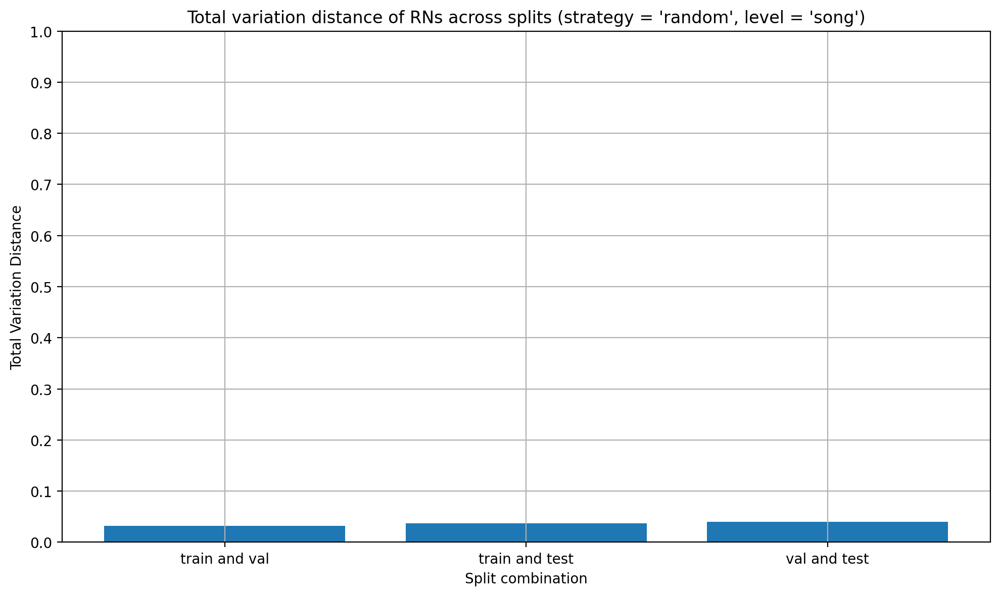

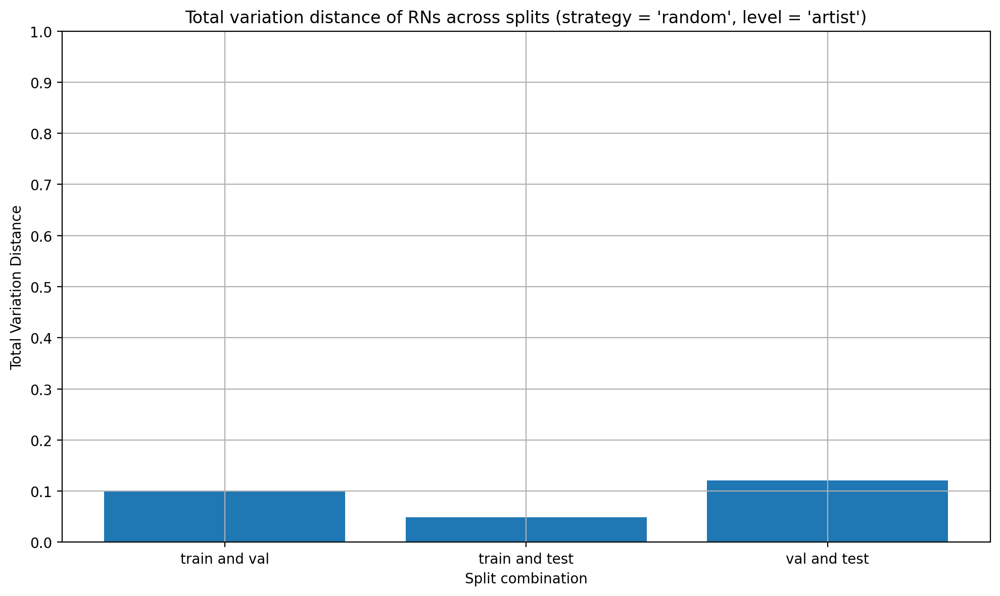

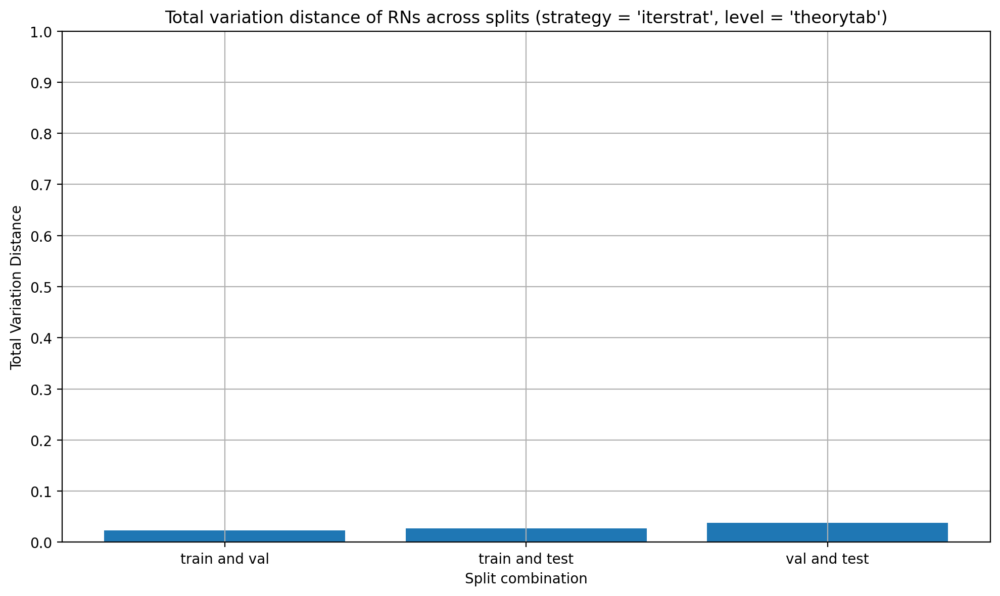

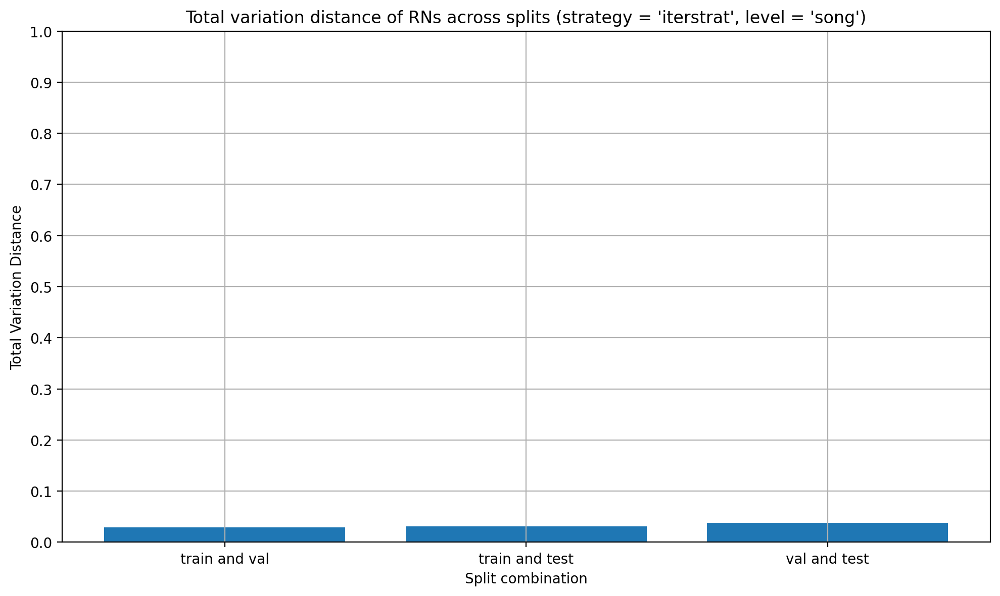

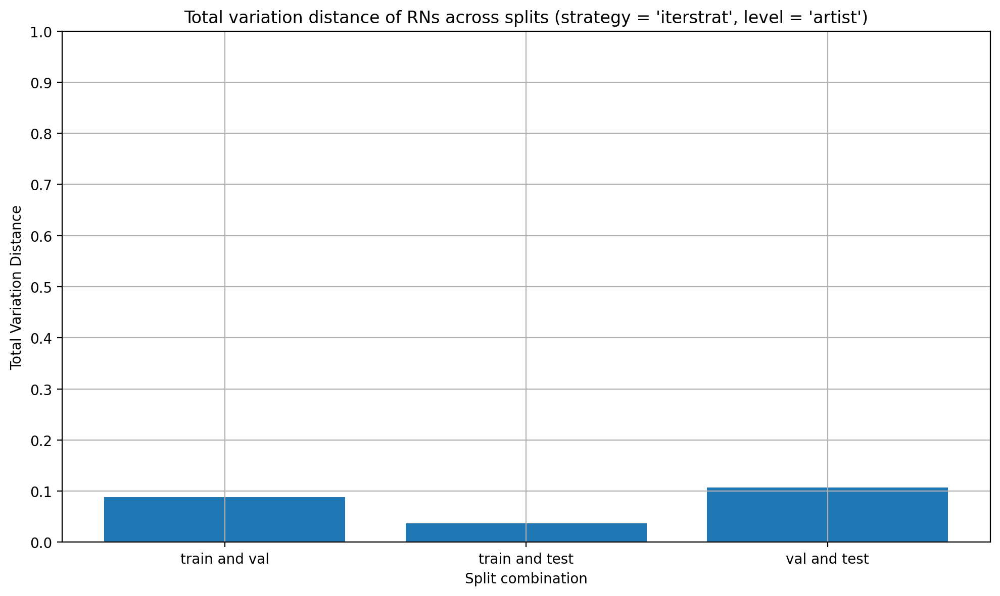

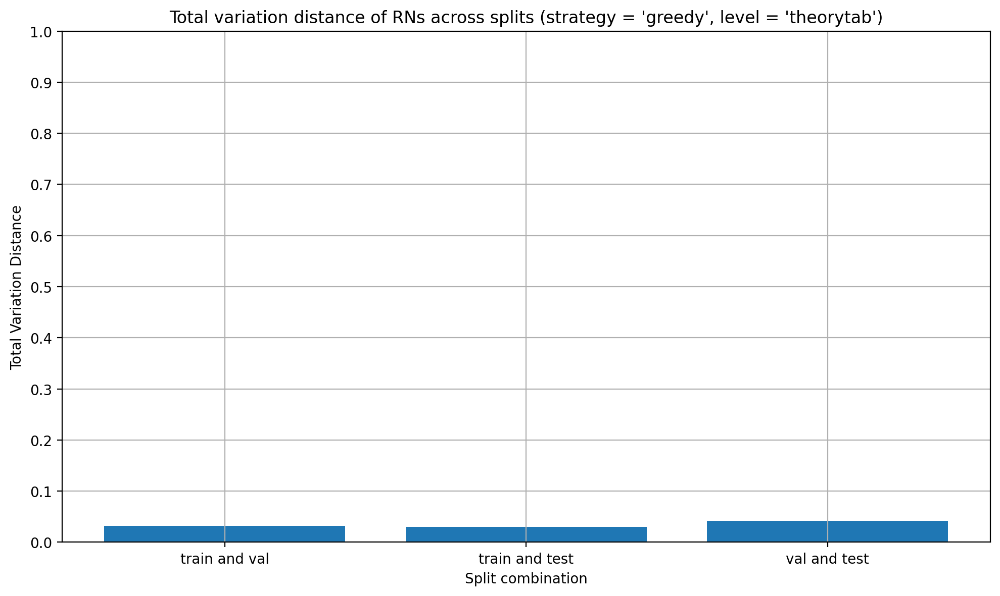

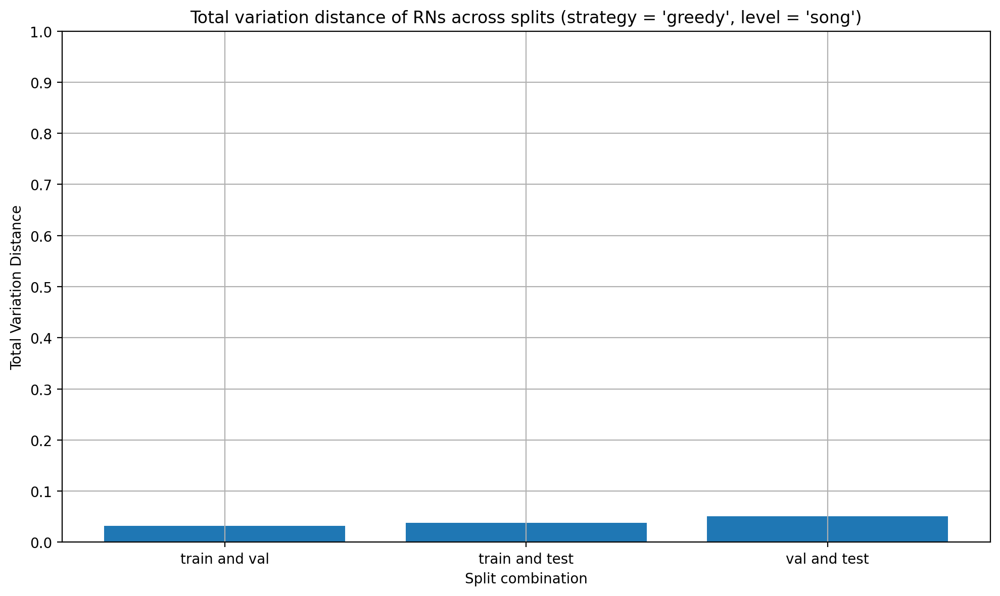

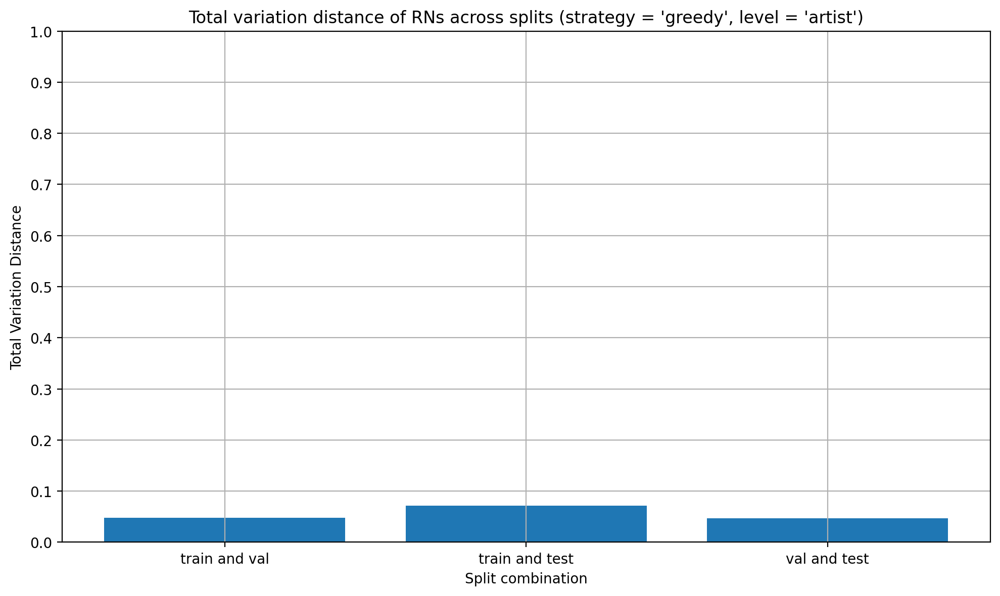

In [97]:
for strategy in stratification_rn_proportion:
    for level in stratification_rn_proportion[strategy]:
        tvds = {}
        
        for (split_x, split_y) in [['train', 'val'], ['train', 'test'], ['val', 'test']]:
            p = np.array(stratification_rn_proportion[strategy][level][split_x])
            q = np.array(stratification_rn_proportion[strategy][level][split_y])

            tvds[f'{split_x} and {split_y}'] = total_variation_distance(p, q)
        
        # Plotting
        fig, ax = plt.subplots(figsize=(10, 6))
        ax.bar(tvds.keys(), tvds.values())
        
        ax.set_xlabel('Split combination')
        ax.set_ylabel('Total Variation Distance')
        ax.set_title(f'Total variation distance of RNs across splits ({strategy = }, {level = })')
        ax.set_ylim(0, 1)
        ax.set_yticks(np.arange(0, 1.1, 0.1))
        plt.grid(True)
        plt.tight_layout()
        plt.show()

## Chord inversion distribution

In [98]:
def get_theorytab_inversions(theorytab_id):
    inversions = []

    for chord in theorytab_dataset[theorytab_id]['chords']:
        onset = chord['onset']
        offset = chord['offset']
        inversions.extend((offset - onset) * [chord['inversion']])

    return inversions

In [99]:
stratification_inversion_proportion = {}

for strategy in stratification_info:
    stratification_inversion_proportion[strategy] = {}
    
    for level in stratification_info[strategy]:
        stratification_inversion_proportion[strategy][level] = {}
        
        for split, theorytab_ids in stratification_info[strategy][level].items():
            inversions = list(map(get_theorytab_inversions, theorytab_ids))
            inversions = [inversion for inversion_list in inversions for inversion in inversion_list]
            
            inversions, inversion_count = np.unique(inversions, return_counts=True)
            inversion_proportion = inversion_count / np.sum(inversion_count)
    
            temp_dict = dict(zip(inversions, inversion_proportion))
            temp_dict = {inversion: temp_dict.get(inversion, 0) for inversion in TASK_DOMAINS['inversion']}
            
            stratification_inversion_proportion[strategy][level][split] = list(temp_dict.values())

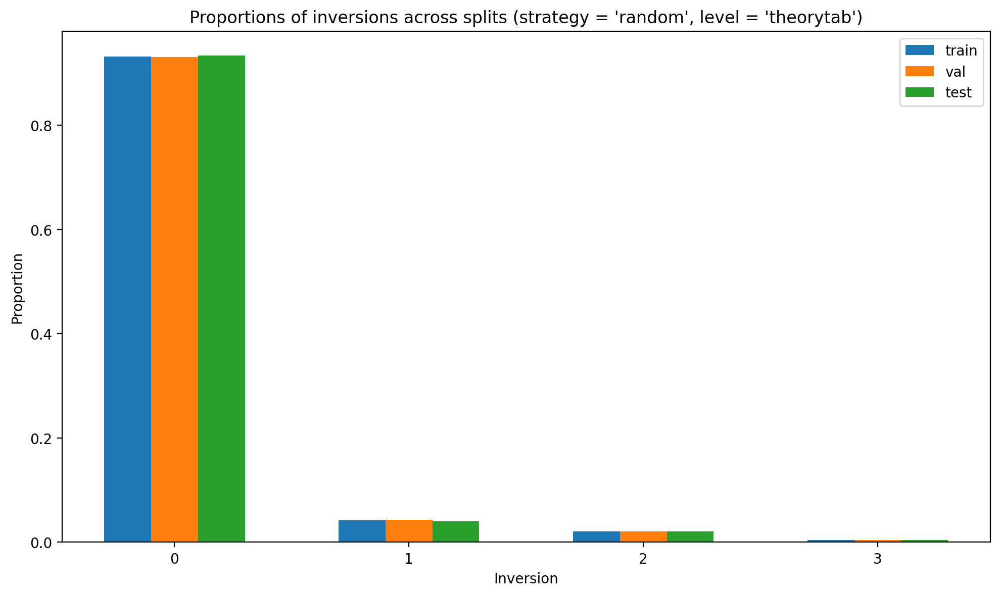

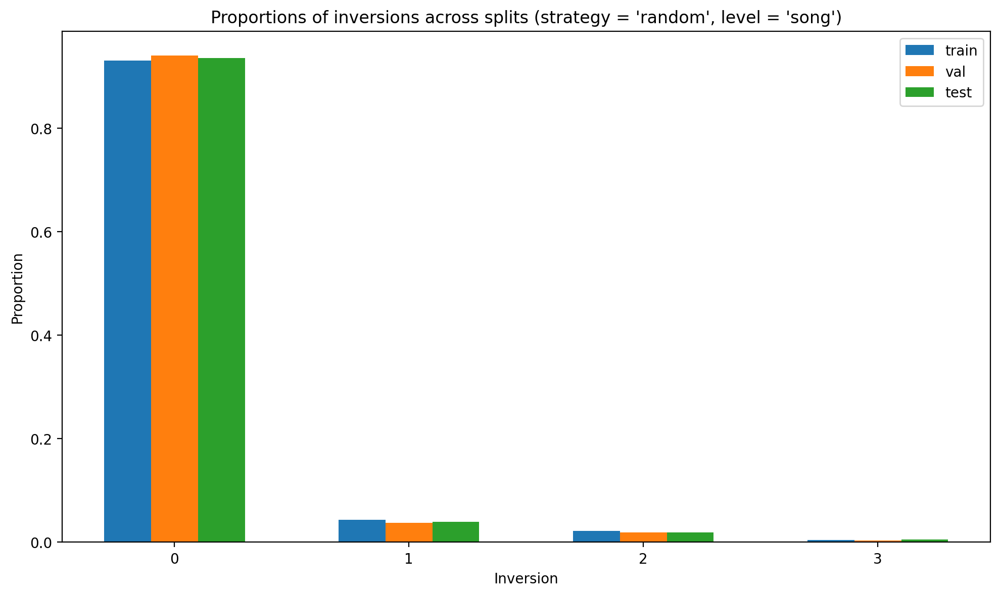

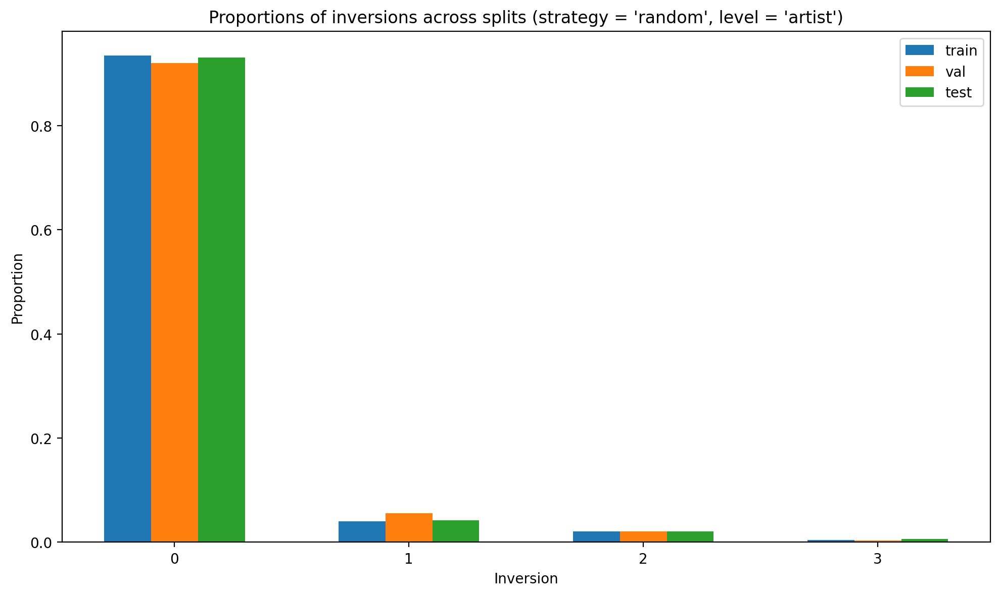

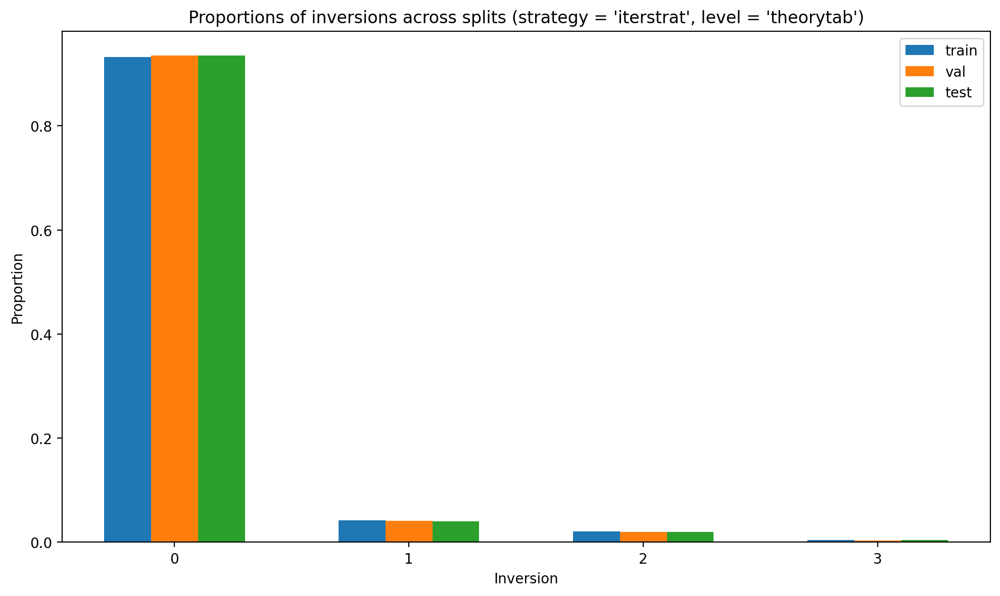

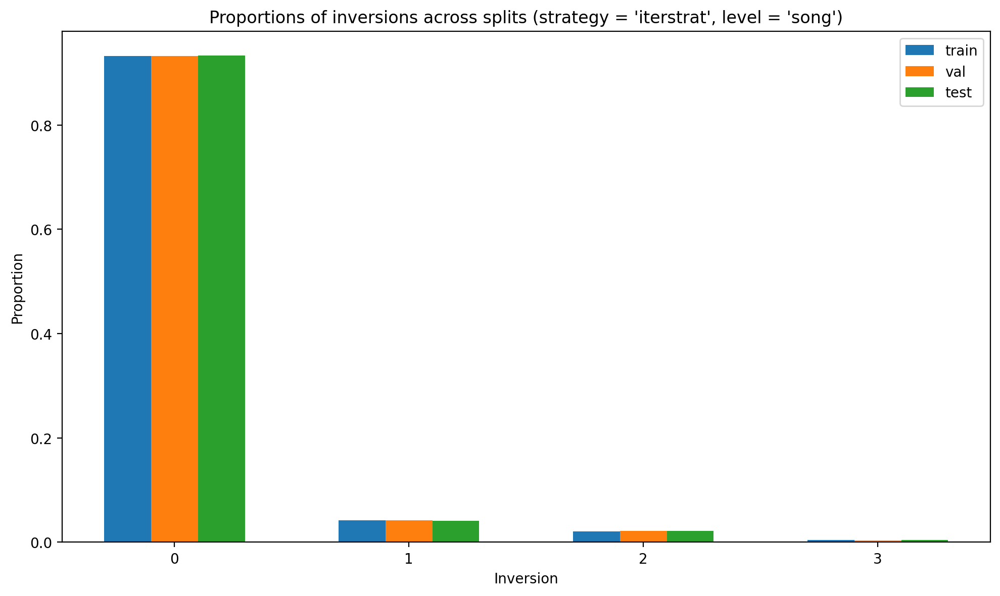

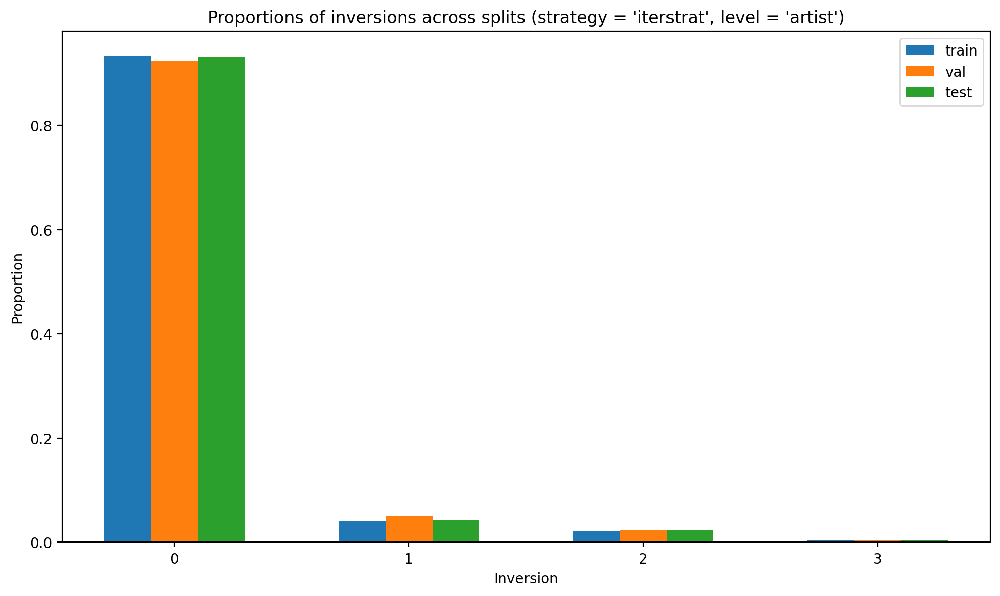

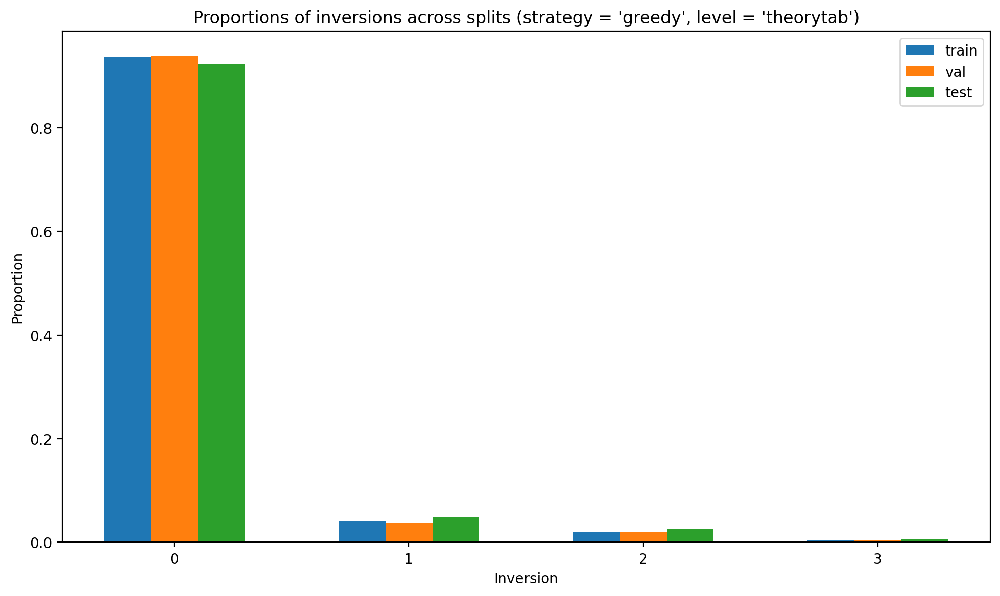

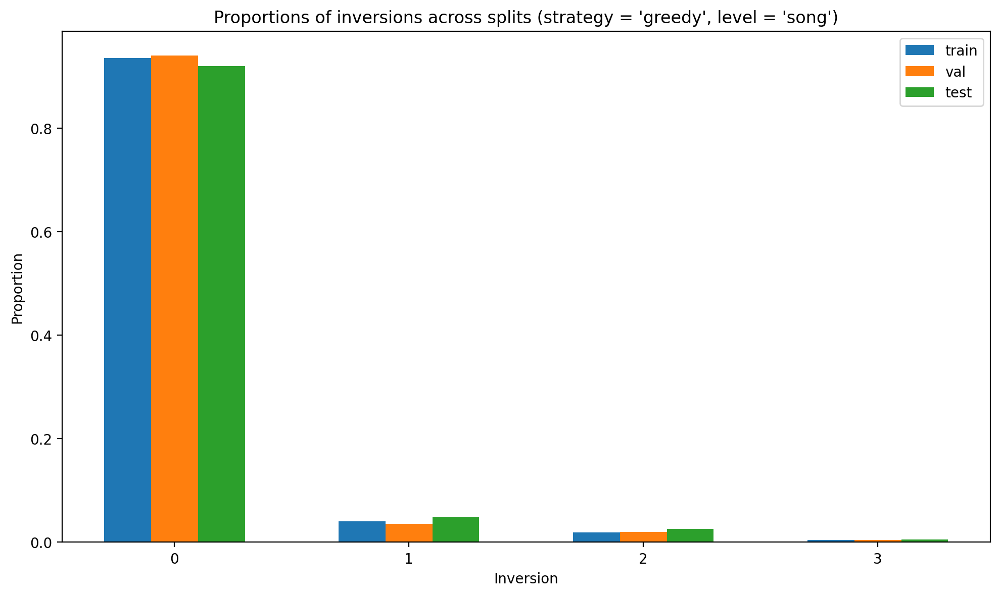

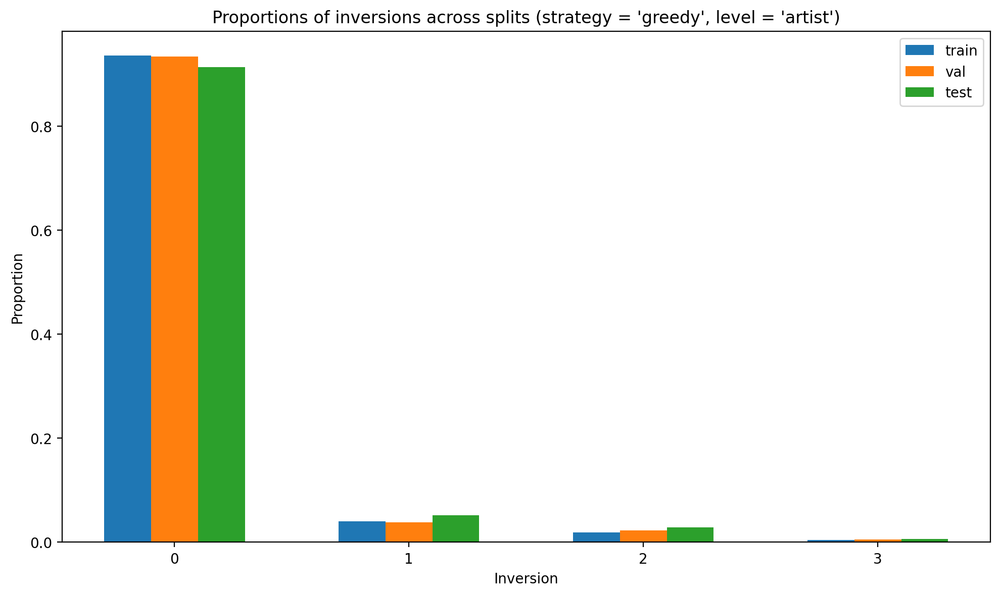

In [100]:
for strategy in stratification_inversion_proportion:
    for level in stratification_inversion_proportion[strategy]:
        sets = ['train', 'val', 'test']
        
        to_plot = [
            list(zip(TASK_DOMAINS['inversion'], stratification_inversion_proportion[strategy][level]['train'])),
            list(zip(TASK_DOMAINS['inversion'], stratification_inversion_proportion[strategy][level]['val'])),
            list(zip(TASK_DOMAINS['inversion'], stratification_inversion_proportion[strategy][level]['test']))
        ]
        
        # Rearranging the data to group by set (Train, Validation, Test) instead of level
        grouped_values = {set_name: [group[i][1] for i in range(len(TASK_DOMAINS['inversion']))] for set_name, group in zip(sets, to_plot)}
        
        # Bar plot parameters
        x = np.arange(len(TASK_DOMAINS['inversion']))
        height = 0.2
        
        # Plotting
        fig, ax = plt.subplots(figsize=(10, 6))
        for i, (set_name, value) in enumerate(grouped_values.items()):
            ax.bar(x + i*height - height, value, height, label=set_name)
        
        ax.set_xlabel('Inversion')
        ax.set_ylabel('Proportion')
        ax.set_title(f'Proportions of inversions across splits ({strategy = }, {level = })')
        ax.set_xticks(x)
        ax.set_xticklabels(TASK_DOMAINS['inversion'])
        ax.legend()
        plt.tight_layout()
        plt.show()

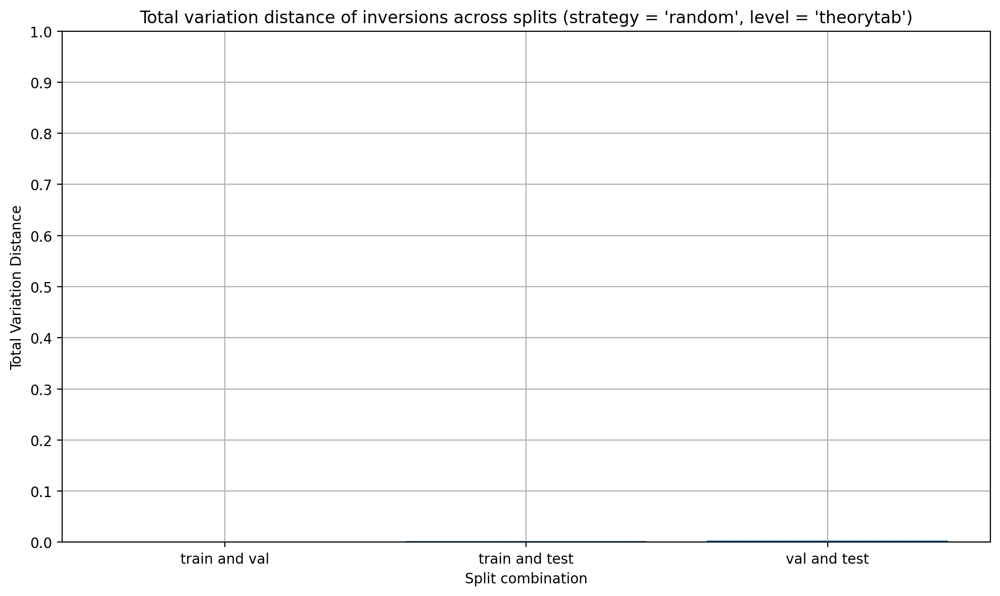

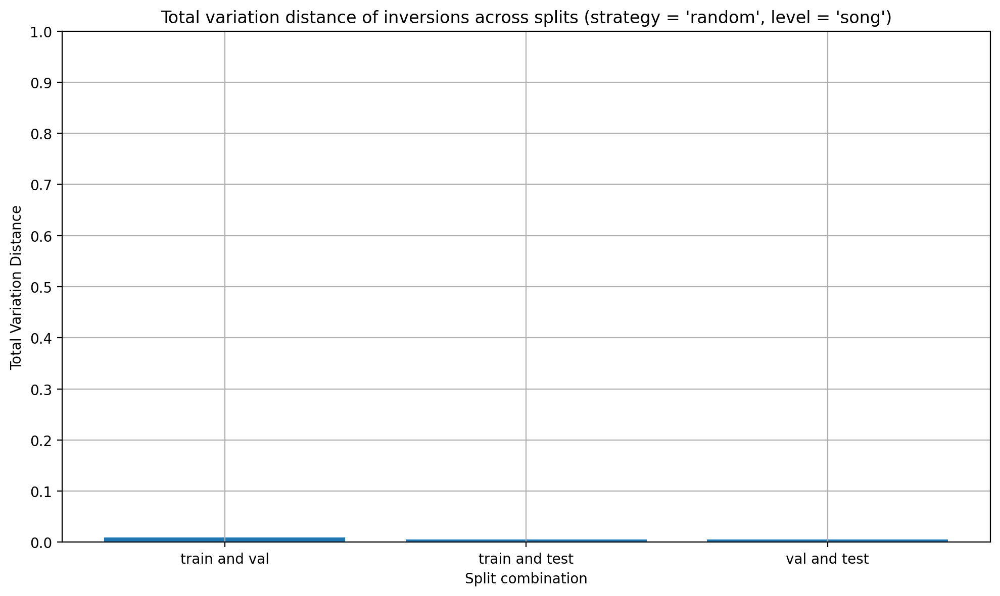

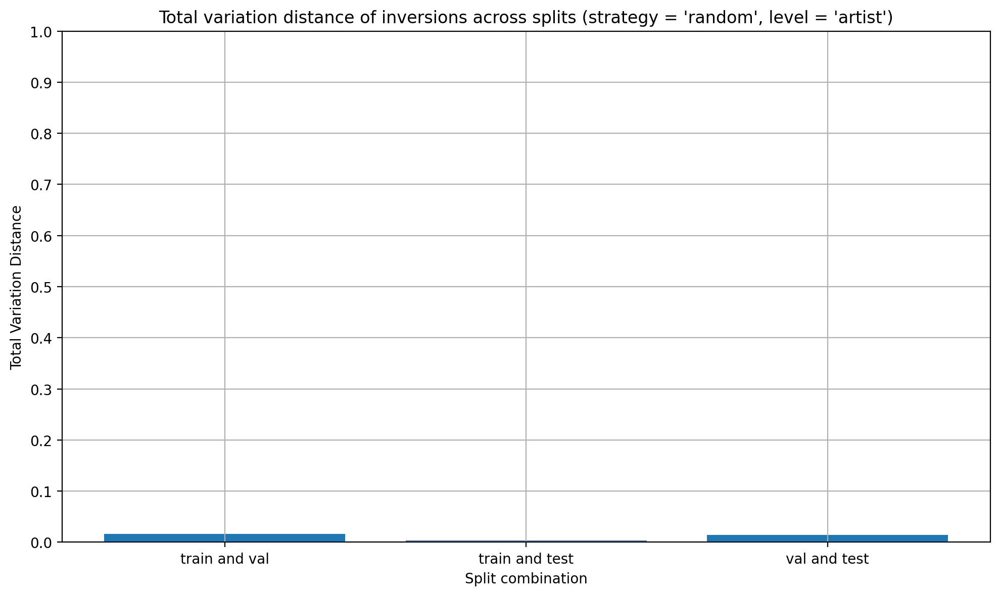

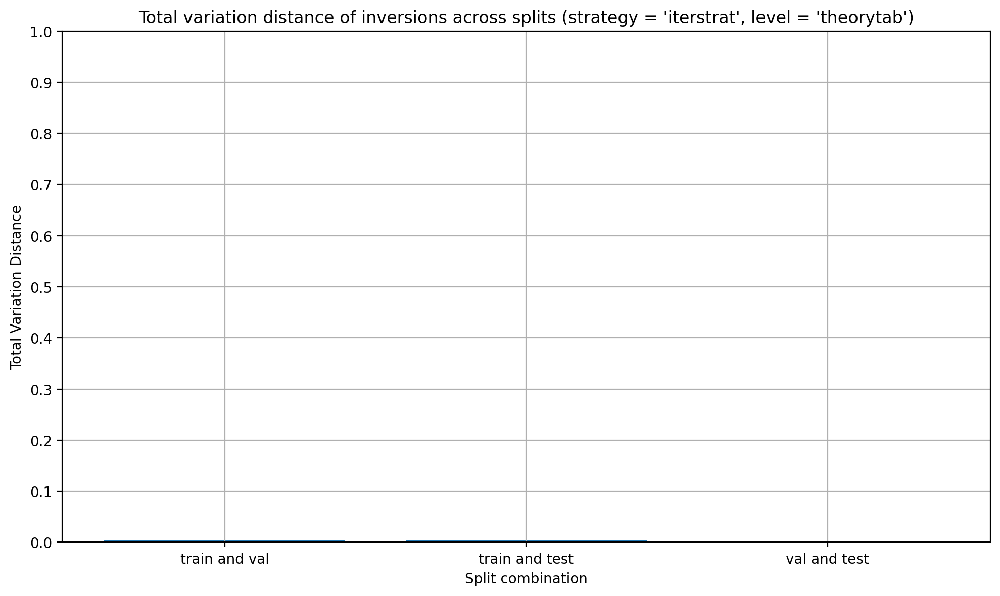

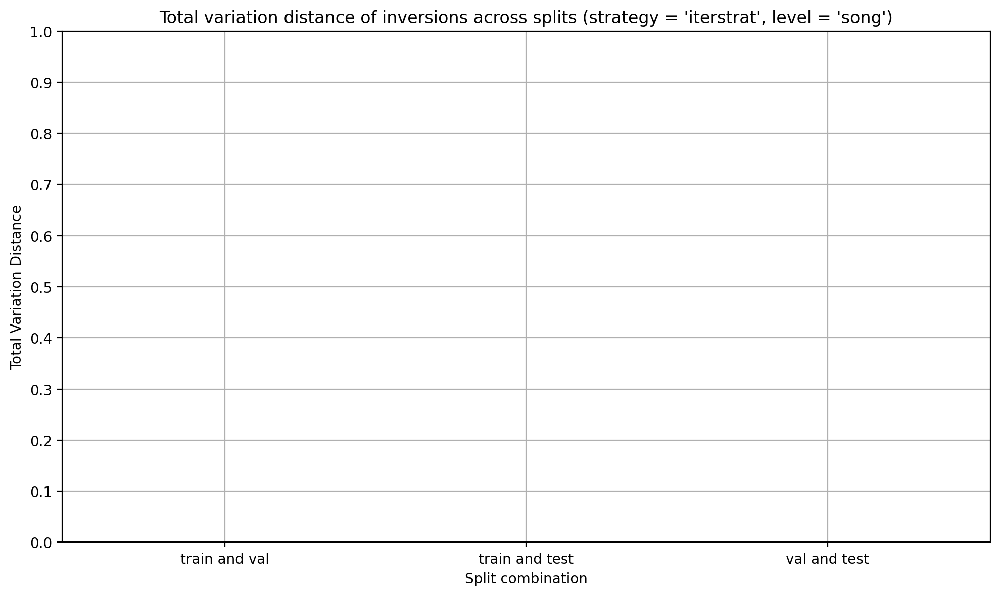

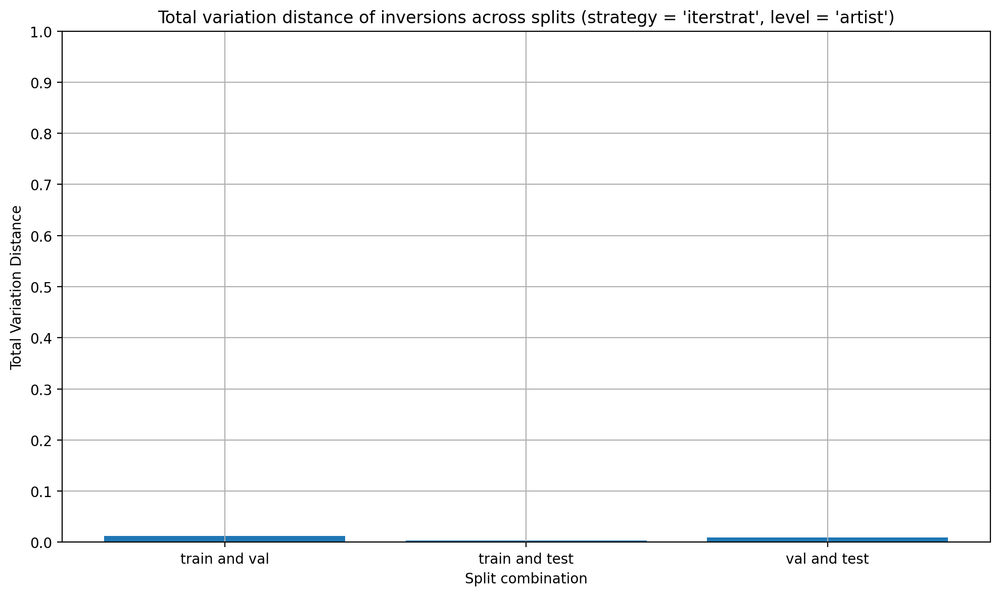

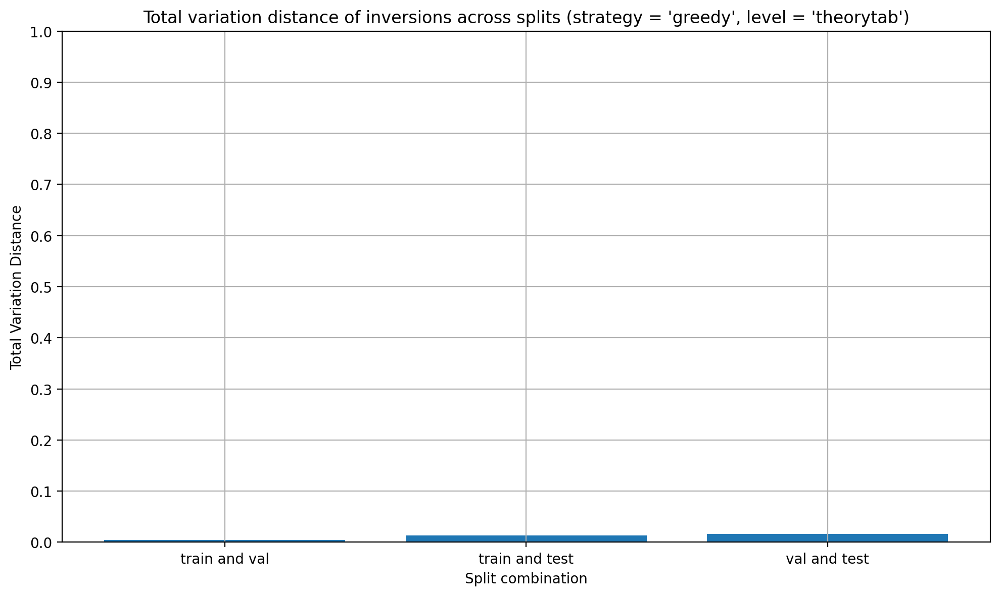

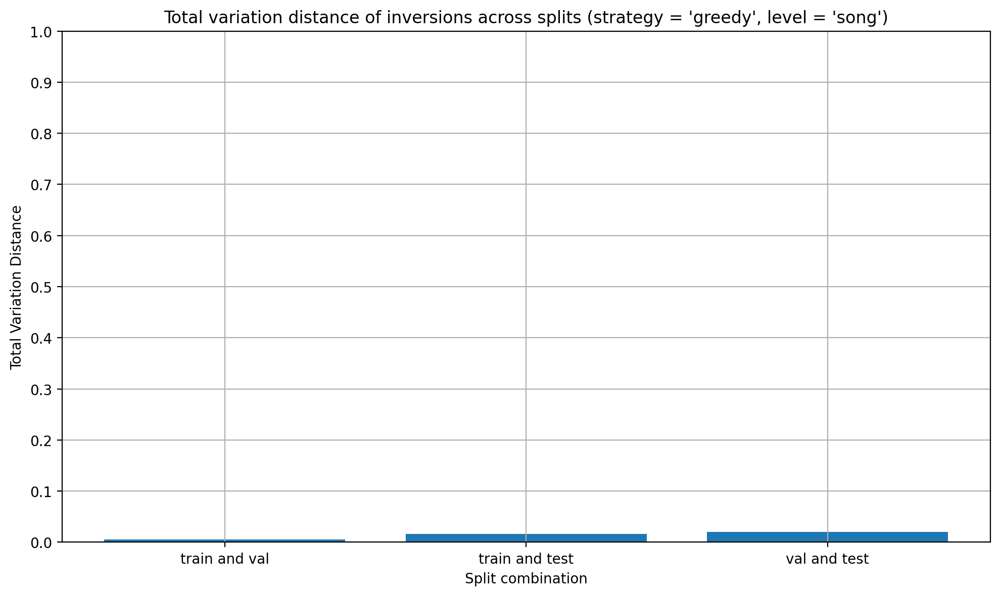

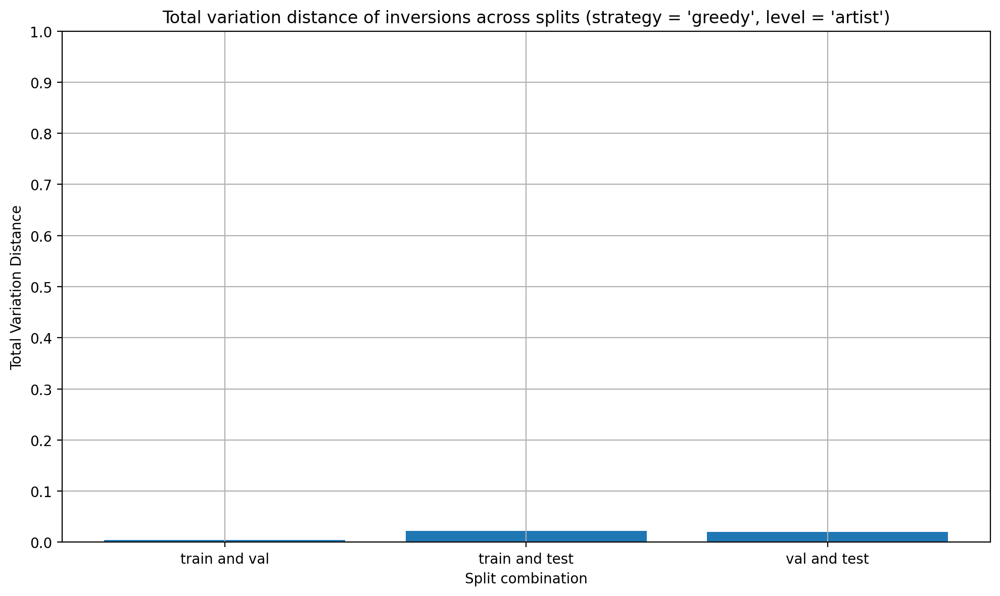

In [101]:
for strategy in stratification_inversion_proportion:
    for level in stratification_inversion_proportion[strategy]:
        tvds = {}
        
        for (split_x, split_y) in [['train', 'val'], ['train', 'test'], ['val', 'test']]:
            p = np.array(stratification_inversion_proportion[strategy][level][split_x])
            q = np.array(stratification_inversion_proportion[strategy][level][split_y])

            tvds[f'{split_x} and {split_y}'] = total_variation_distance(p, q)
        
        # Plotting
        fig, ax = plt.subplots(figsize=(10, 6))
        ax.bar(tvds.keys(), tvds.values())
        
        ax.set_xlabel('Split combination')
        ax.set_ylabel('Total Variation Distance')
        ax.set_title(f'Total variation distance of inversions across splits ({strategy = }, {level = })')
        ax.set_ylim(0, 1)
        ax.set_yticks(np.arange(0, 1.1, 0.1))
        plt.grid(True)
        plt.tight_layout()
        plt.show()

## Local key distribution

In [109]:
def get_theorytab_keys(theorytab_id):
    keys = []

    for key in theorytab_dataset[theorytab_id]['keys']:
        onset = key['onset']
        offset = key['offset']
        
        tonic = CHROMATIC_SCALE[key['tonic_pitch_class']]
        key_name = f"{tonic} {key['scale']}"

        keys.extend((offset - onset) * [key_name])

    return keys

In [111]:
stratification_key_proportion = {}

for strategy in stratification_info:
    stratification_key_proportion[strategy] = {}
    
    for level in stratification_info[strategy]:
        stratification_key_proportion[strategy][level] = {}
        
        for split, theorytab_ids in stratification_info[strategy][level].items():
            keys = list(map(get_theorytab_keys, theorytab_ids))
            keys = [key for key_list in keys for key in key_list]
            
            keys, key_count = np.unique(keys, return_counts=True)
            key_proportion = key_count / np.sum(key_count)
    
            temp_dict = dict(zip(keys, key_proportion))
            temp_dict = {key: temp_dict.get(key, 0) for key in TASK_DOMAINS['local_key']}
            
            stratification_key_proportion[strategy][level][split] = list(temp_dict.values())

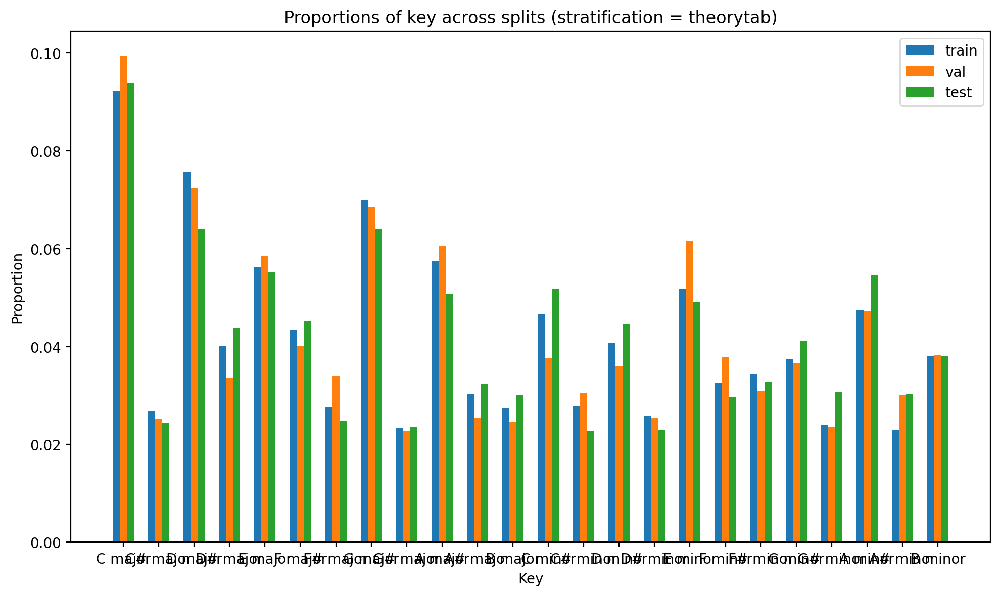

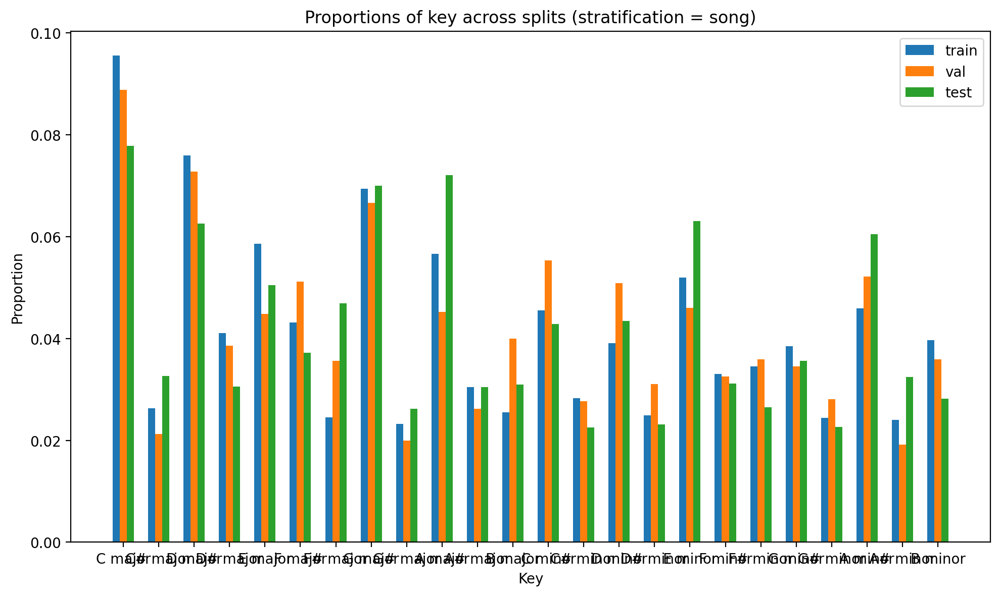

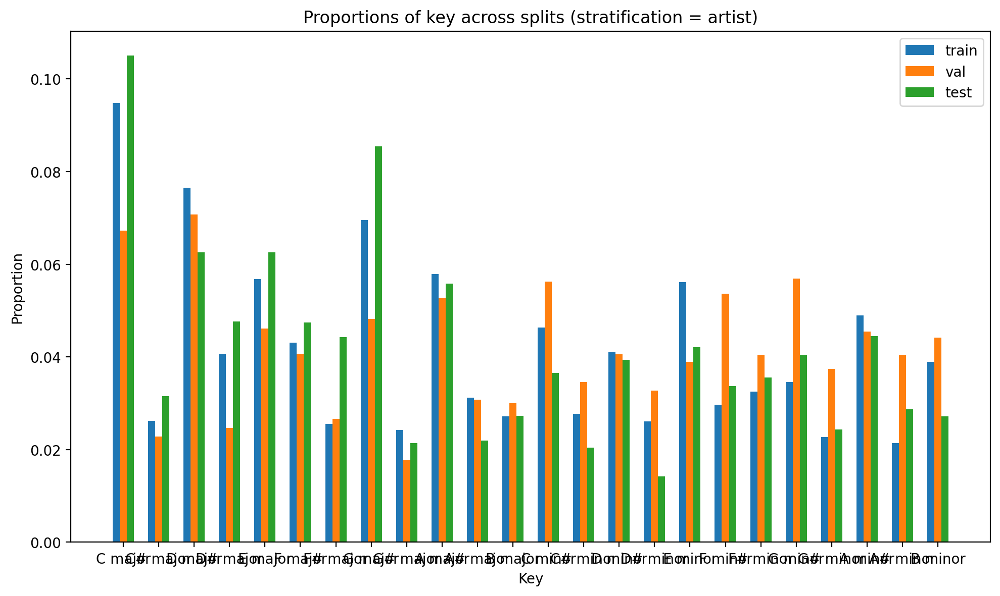

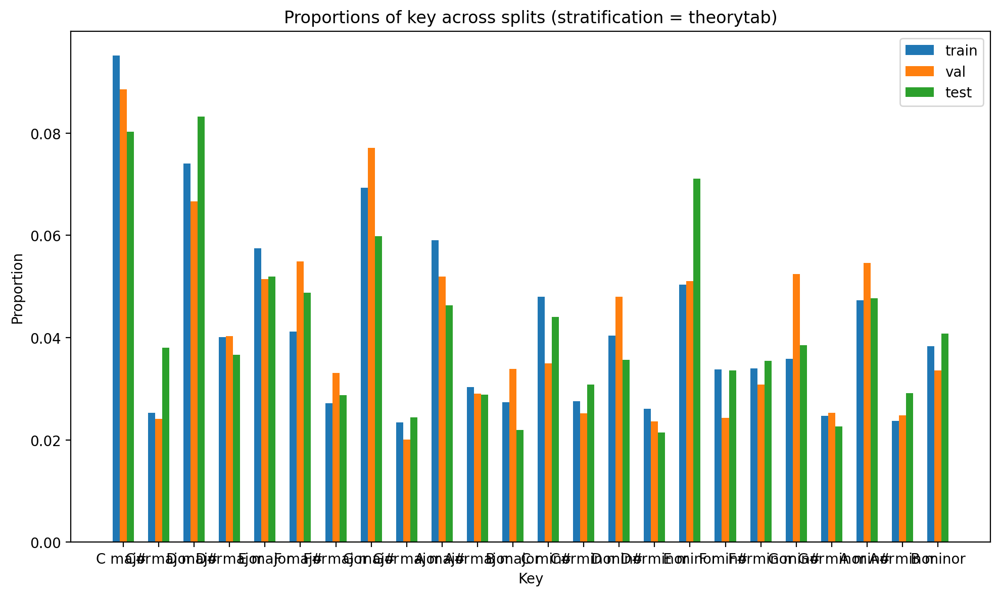

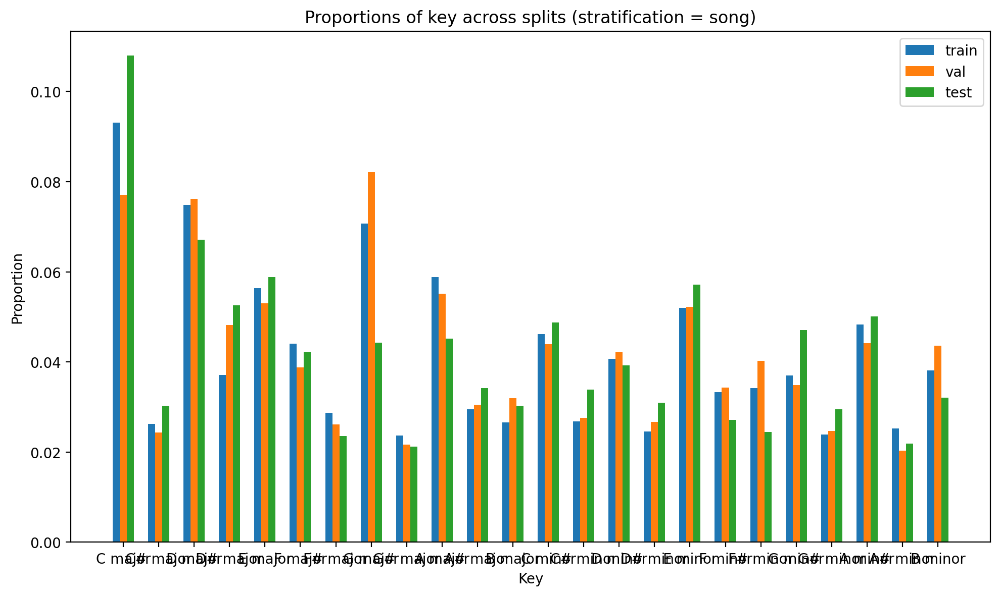

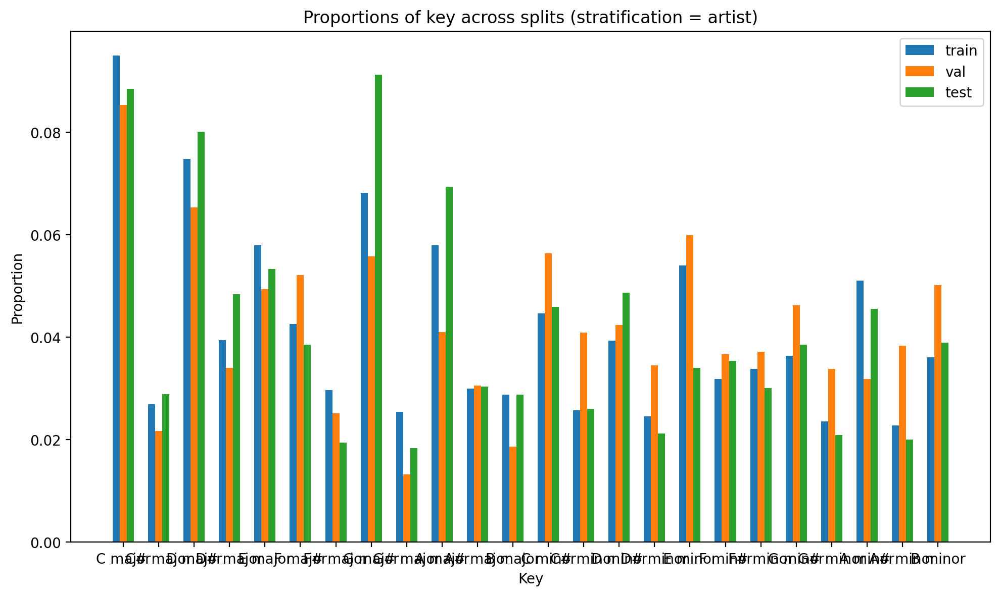

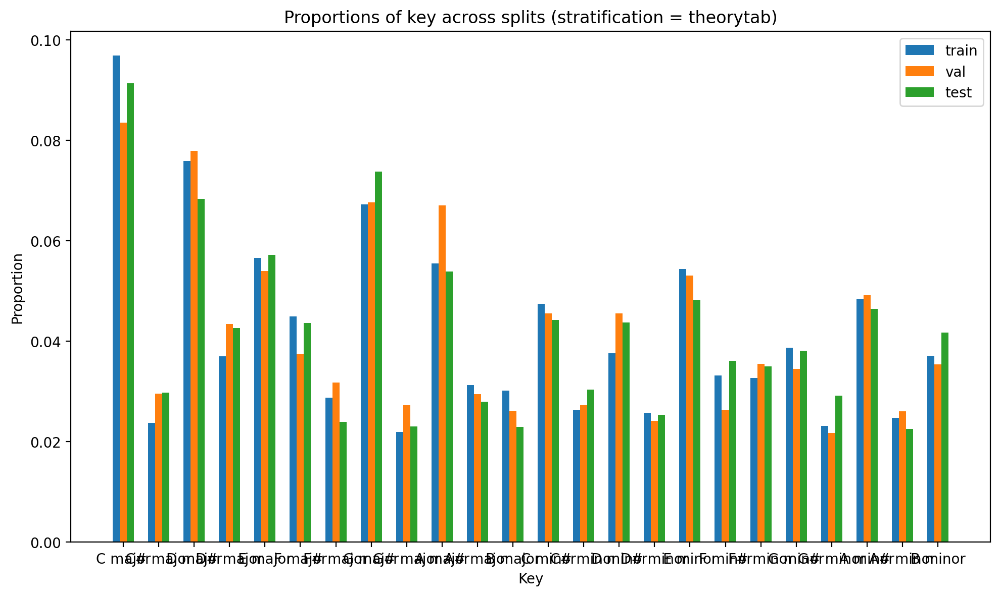

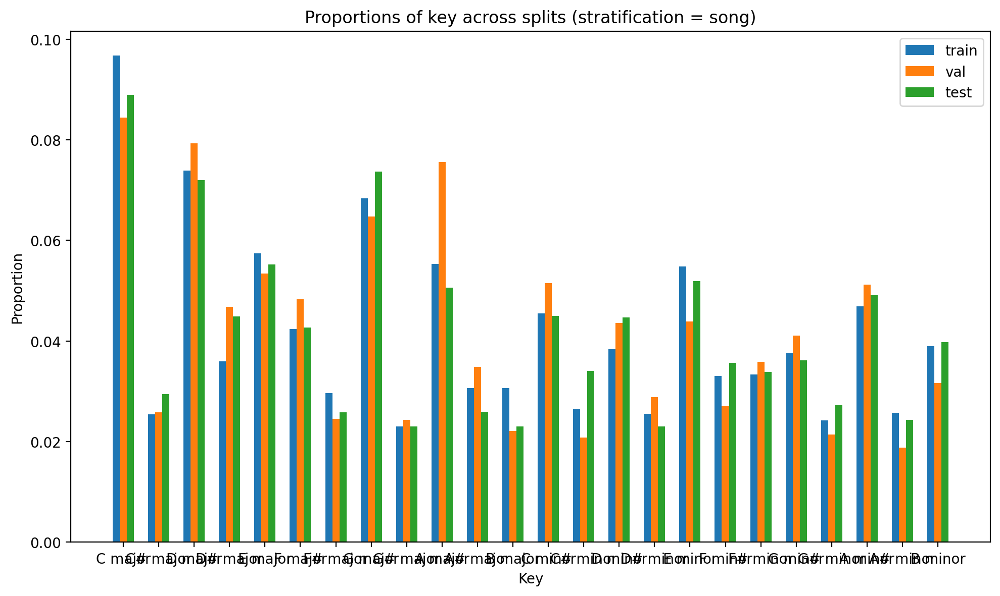

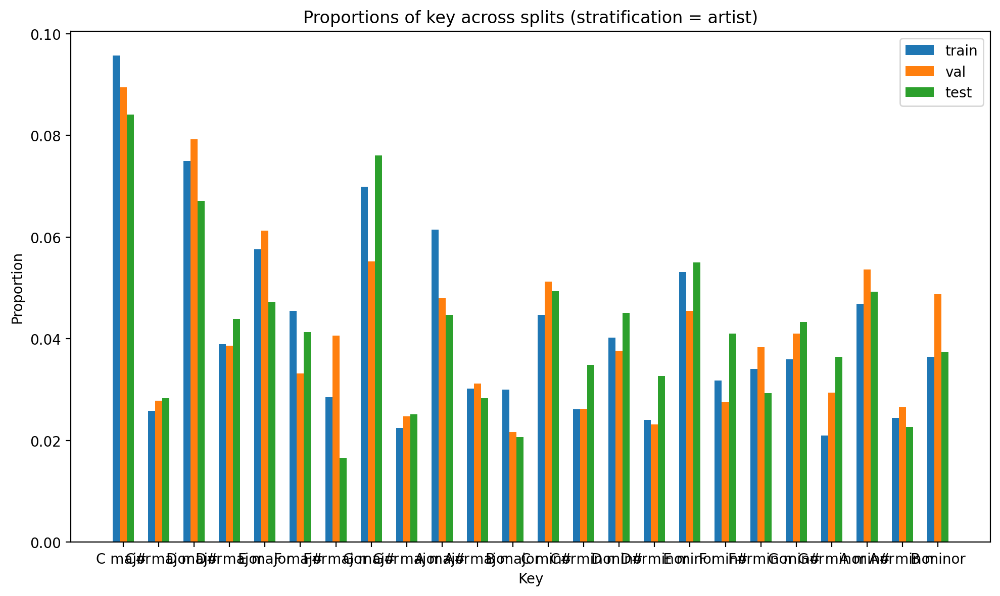

In [113]:
for strategy in stratification_key_proportion:
    for level in stratification_key_proportion[strategy]:
        sets = ['train', 'val', 'test']
        
        to_plot = [
            list(zip(TASK_DOMAINS['local_key'], stratification_key_proportion[strategy][level]['train'])),
            list(zip(TASK_DOMAINS['local_key'], stratification_key_proportion[strategy][level]['val'])),
            list(zip(TASK_DOMAINS['local_key'], stratification_key_proportion[strategy][level]['test']))
        ]
        
        # Rearranging the data to group by set (Train, Validation, Test) instead of level
        grouped_values = {set_name: [group[i][1] for i in range(len(TASK_DOMAINS['local_key']))] for set_name, group in zip(sets, to_plot)}
        
        # Bar plot parameters
        x = np.arange(len(TASK_DOMAINS['local_key']))
        height = 0.2
        
        # Plotting
        fig, ax = plt.subplots(figsize=(10, 6))
        for i, (set_name, value) in enumerate(grouped_values.items()):
            ax.bar(x + i*height - height, value, height, label=set_name)
        
        ax.set_xlabel('Key')
        ax.set_ylabel('Proportion')
        ax.set_title(f'Proportions of key across splits (stratification = {level})')
        ax.set_xticks(x)
        ax.set_xticklabels(TASK_DOMAINS['local_key'])
        ax.legend()
        plt.tight_layout()
        plt.show()

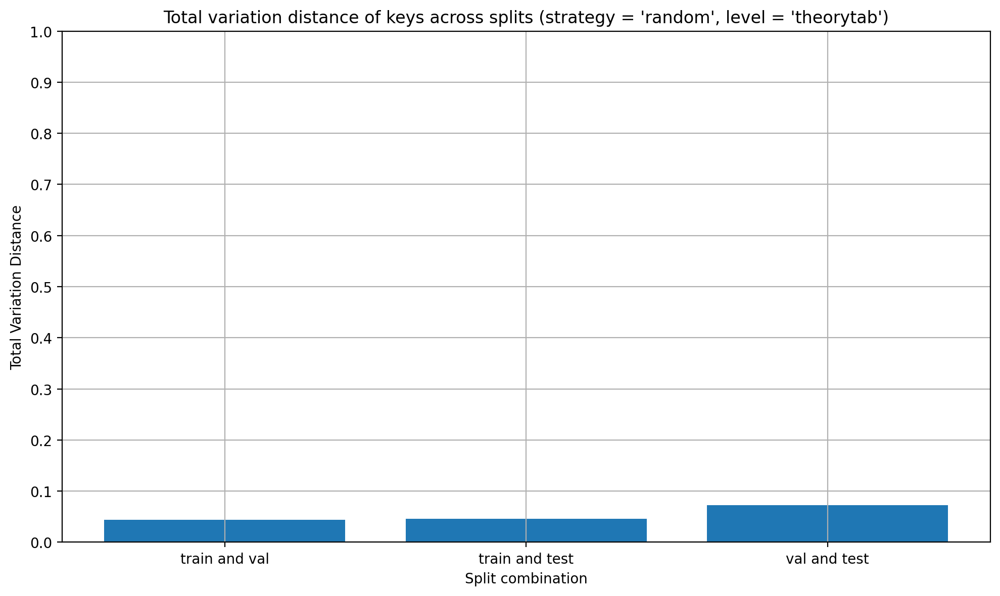

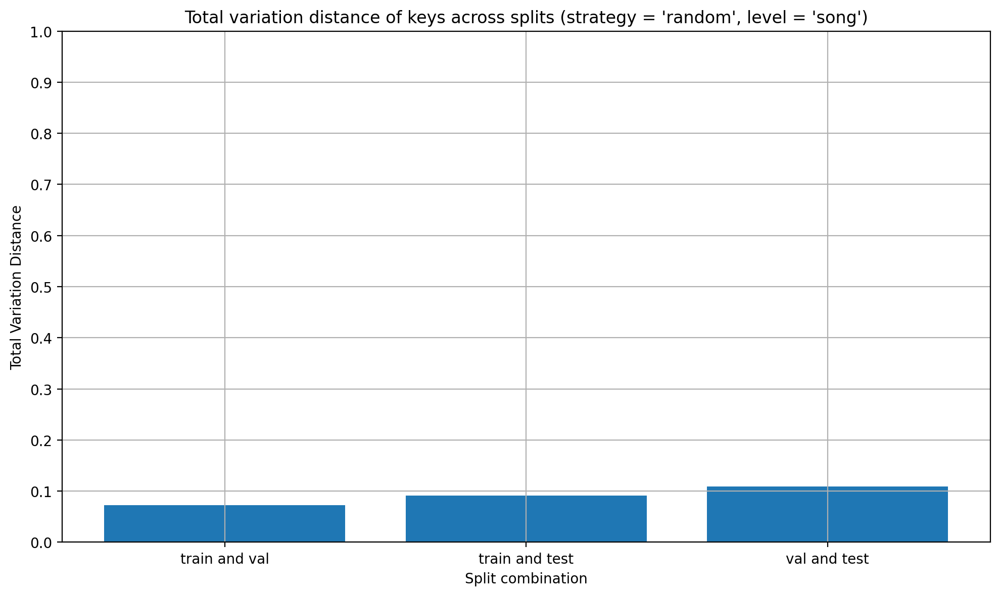

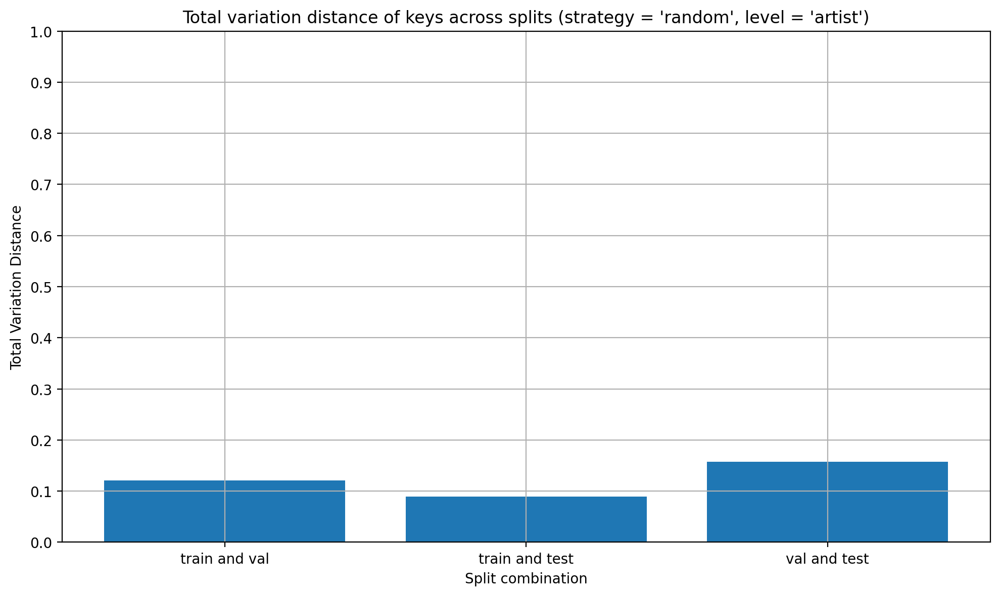

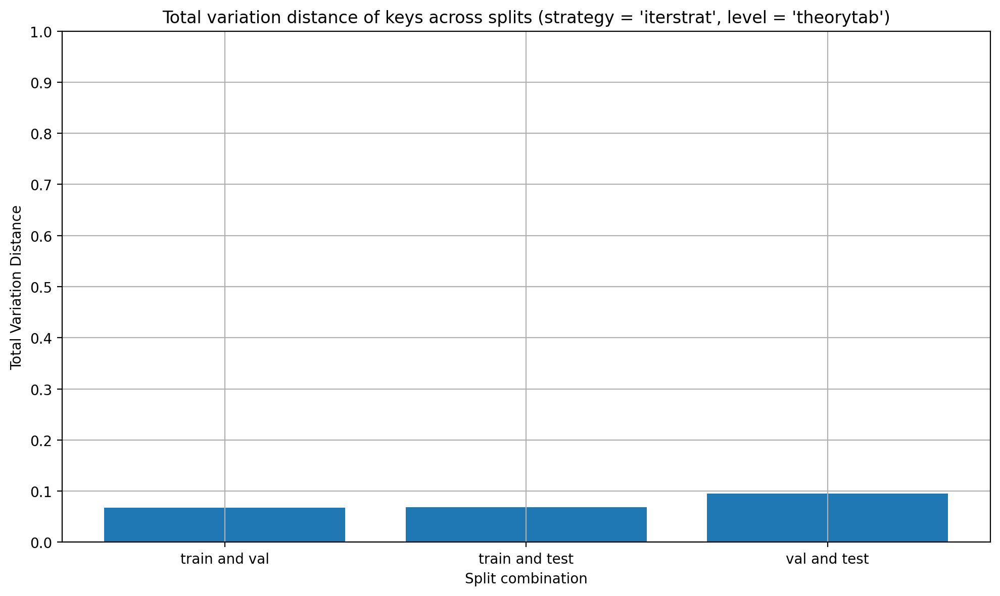

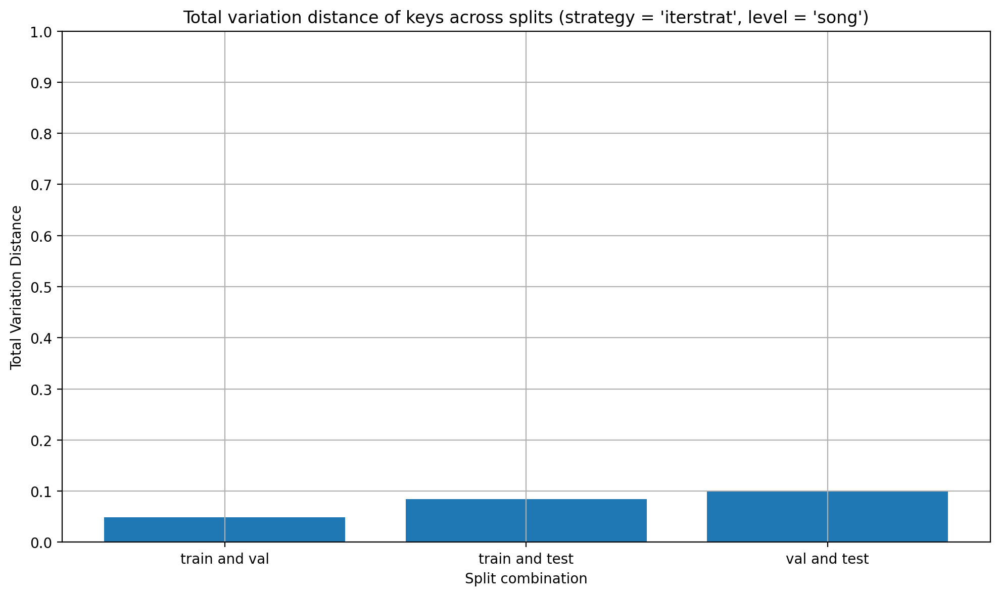

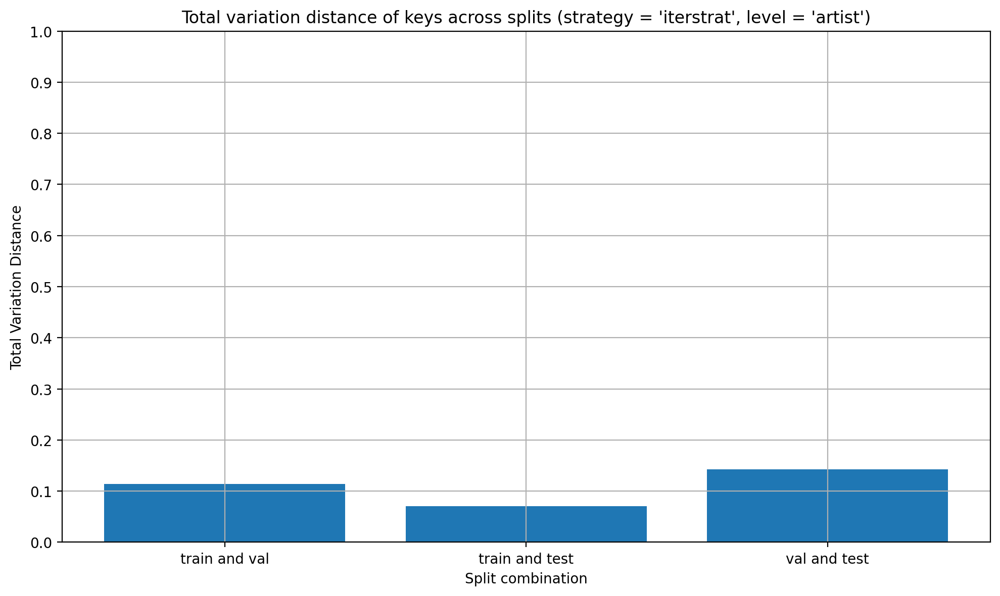

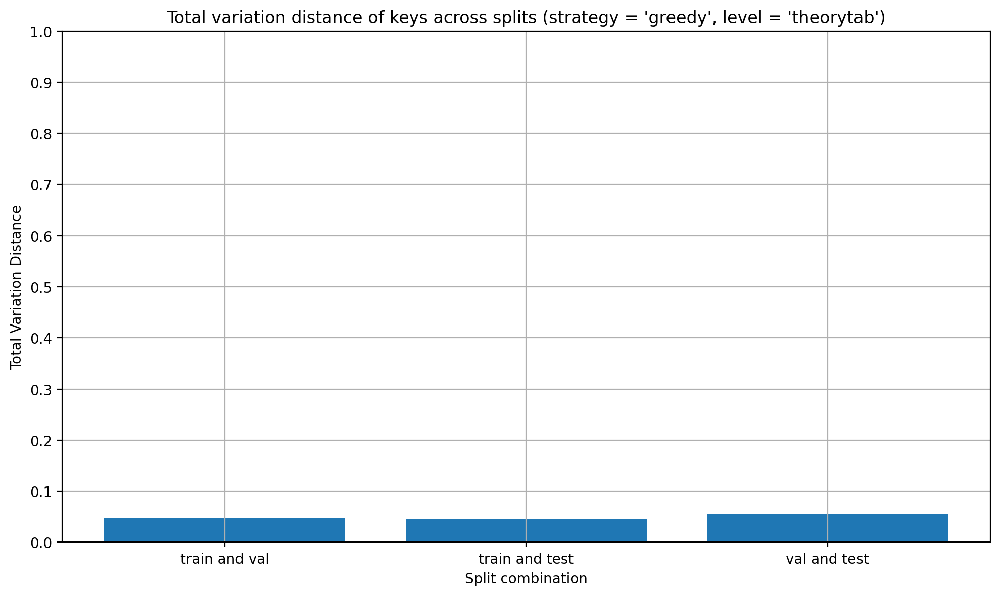

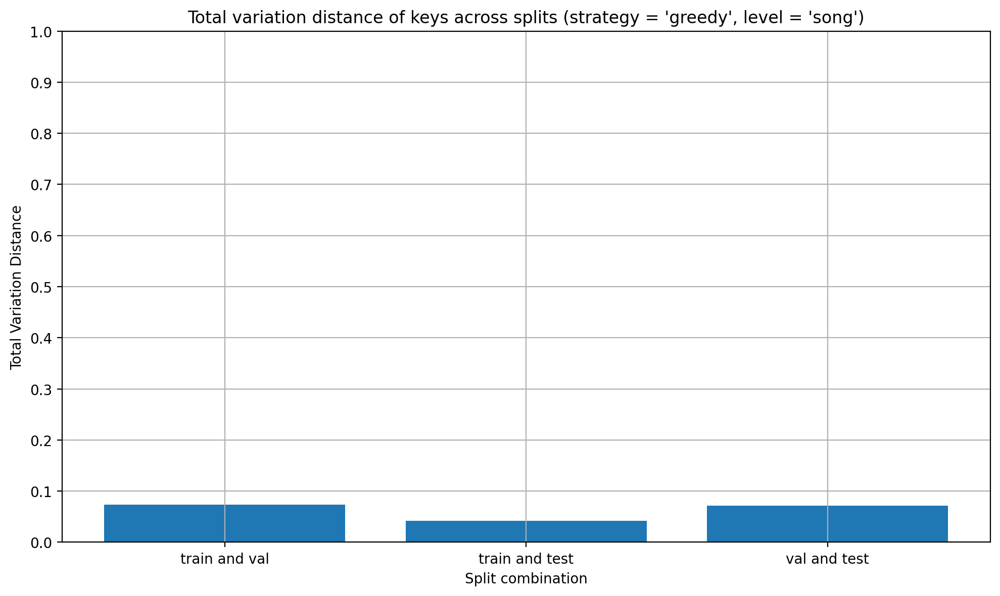

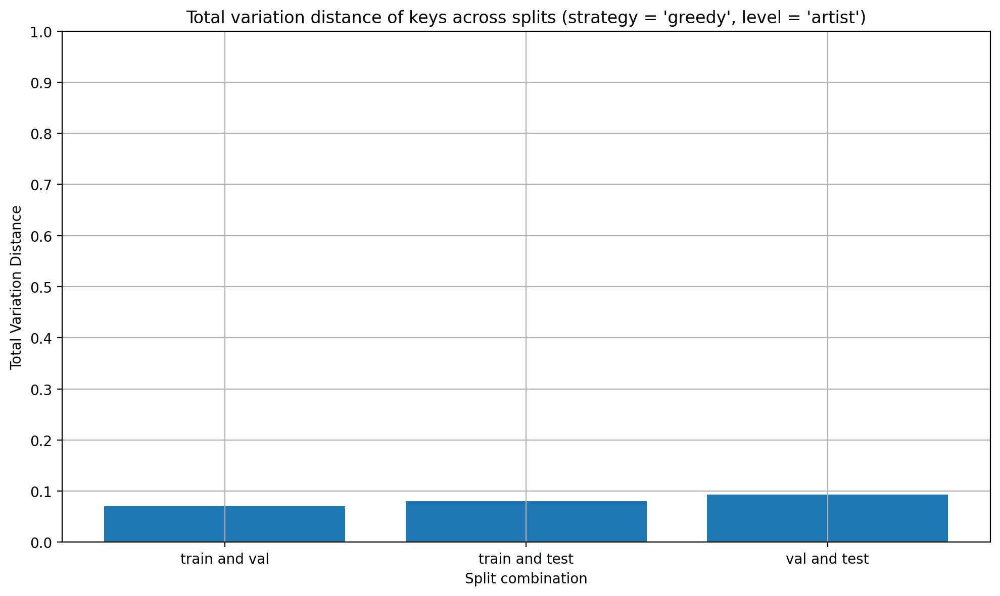

In [114]:
for strategy in stratification_key_proportion:
    for level in stratification_key_proportion[strategy]:
        tvds = {}
        
        for (split_x, split_y) in [['train', 'val'], ['train', 'test'], ['val', 'test']]:
            p = np.array(stratification_key_proportion[strategy][level][split_x])
            q = np.array(stratification_key_proportion[strategy][level][split_y])

            tvds[f'{split_x} and {split_y}'] = total_variation_distance(p, q)
        
        # Plotting
        fig, ax = plt.subplots(figsize=(10, 6))
        ax.bar(tvds.keys(), tvds.values())
        
        ax.set_xlabel('Split combination')
        ax.set_ylabel('Total Variation Distance')
        ax.set_title(f'Total variation distance of keys across splits ({strategy = }, {level = })')
        ax.set_ylim(0, 1)
        ax.set_yticks(np.arange(0, 1.1, 0.1))
        plt.grid(True)
        plt.tight_layout()
        plt.show()